# **Import Libraries and Load Data**

In [3]:
# Import necessary libraries
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
import itertools
import statsmodels.api as sm
import scipy.stats as stats
from scipy.stats import shapiro, levene, chi2_contingency, mannwhitneyu, kstest, pearsonr, spearmanr, kendalltau, normaltest, kruskal
from sklearn.feature_selection import f_classif, f_regression, mutual_info_regression
from sklearn.decomposition import PCA
from sklearn.preprocessing import LabelEncoder, StandardScaler
from sklearn.model_selection import train_test_split, ShuffleSplit, GridSearchCV, StratifiedKFold, cross_val_predict
from sklearn.linear_model import LogisticRegression, LinearRegression
from sklearn.tree import DecisionTreeClassifier
from sklearn.ensemble import RandomForestClassifier
from sklearn.naive_bayes import GaussianNB
from sklearn.neighbors import KNeighborsClassifier
from sklearn.svm import SVC
from sklearn.metrics import accuracy_score, precision_recall_fscore_support, classification_report, roc_curve, auc, precision_recall_curve, average_precision_score
from xgboost import XGBClassifier
from imblearn.over_sampling import ADASYN
from sklearn.impute import SimpleImputer
import tensorflow as tf
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense
from tensorflow.keras.optimizers import Adam



In [4]:
#Import dataset/content/merged_dataset.csv
df= pd.read_csv("/content/merged_dataset.csv")
df.head()

,SEQN,AlcohoYN,AlcoholLY,EverAsthma,EverArthritis,CongestiveHFailure,CronaryHeart,Angina,HeartAttack,EverThyroid,...,25OHD2Comm,25OHD3Nmol,25OHD23Comm,epi-25OHD3Nmol,epi-25OHD3Comm,CurrentHeightSelf,CurrentWeightSelf,LastWeightSelf,PhysicalModerateFreq,PhysicalVigFreq
0,130378,NaN,NaN,2,1.0,2.0,2.0,2.0,2.0,2.0,...,1.0,57.3,5.400000e-79,2.47,5.400000e-79,71,190,200,W,W
1,130379,1.0,2.000000e+00,2,2.0,2.0,2.0,2.0,2.0,2.0,...,1.0,58.9,5.400000e-79,3.40,5.400000e-79,70,220,220,W,W
2,130380,1.0,1.000000e+01,2,2.0,2.0,2.0,2.0,2.0,1.0,...,1.0,37.8,5.400000e-79,1.52,5.400000e-79,60,150,165,W,NaN
3,130386,1.0,4.000000e+00,2,2.0,2.0,2.0,2.0,2.0,2.0,...,1.0,95.3,5.400000e-79,5.53,5.400000e-79,68,200,180,W,M
4,130387,1.0,5.400000e-79,2,2.0,2.0,2.0,2.0,2.0,2.0,...,1.0,25.1,5.400000e-79,1.10,5.400000e-79,67,215,215,0,NaN


# **Dataset Overview**

In [5]:
# Display shape, columns, data types, and number of NaN values
print(f"Shape of the dataset: {df.shape}\n")

print("Column names and number of NaN values:")
nan_counts = df.isna().sum()
for col in df.columns:
    print(f"{col}: {nan_counts[col]} NaN")

print("\nData types:")
print(df.dtypes)


df.describe()

Shape of the dataset: (6337, 178)

Column names and number of NaN values:
SEQN: 0 NaN
AlcohoYN: 856 NaN
AlcoholLY: 857 NaN
EverAsthma: 0 NaN
EverArthritis: 274 NaN
CongestiveHFailure: 273 NaN
CronaryHeart: 274 NaN
Angina: 273 NaN
HeartAttack: 274 NaN
EverThyroid : 274 NaN
EverLiverCondition: 273 NaN
SDDSRVYR: 0 NaN
Inter_ExamStatus: 0 NaN
Gender: 0 NaN
Age: 0 NaN
Hispanic: 0 NaN
Race: 0 NaN
Education: 273 NaN
MaritalSt: 274 NaN
Pregnant: 5203 NaN
NumPeoHouse: 0 NaN
Weight2YInter: 0 NaN
Weight2Yexam: 0 NaN
MaskPseuStra: 0 NaN
MaskPseuPSU: 0 NaN
FamilyIncom: 831 NaN
Systolic1: 214 NaN
Diastolic1: 214 NaN
Systolic2: 221 NaN
Diastolic2: 221 NaN
Systolic3: 236 NaN
Diastolic3: 236 NaN
Pulse1: 214 NaN
Pulse2: 221 NaN
Pulse3: 236 NaN
BMDSTATS: 0 NaN
WeightKG: 89 NaN
Height_cm: 75 NaN
BMI: 102 NaN
Waist_cm: 318 NaN
Hip_cm: 380 NaN
Elastography Stat: 0 NaN
ExamWandType: 0 NaN
completeFinalWand: 433 NaN
AttempedFinalWand: 0 NaN
StiffnesskPa: 463 NaN
Stiff_IQR: 475 NaN
Stiff_IQR_MedRatio: 475 NaN


,SEQN,AlcohoYN,AlcoholLY,EverAsthma,EverArthritis,CongestiveHFailure,CronaryHeart,Angina,HeartAttack,EverThyroid,...,Total25OComm,25OHD2Nmol,25OHD2Comm,25OHD3Nmol,25OHD23Comm,epi-25OHD3Nmol,epi-25OHD3Comm,CurrentHeightSelf,CurrentWeightSelf,LastWeightSelf
count,6337.000000,5481.000000,5.480000e+03,6337.000000,6063.000000,6064.000000,6063.000000,6064.000000,6063.000000,6063.000000,...,5.824000e+03,5824.000000,5.824000e+03,5825.000000,5.825000e+03,5758.000000,5.758000e+03,6337.000000,6337.000000,6337.000000
mean,136348.738362,1.109104,4.518431e+00,1.823102,1.679037,1.967843,1.974600,1.994228,1.967343,1.875474,...,5.400000e-79,4.832107,7.779876e-01,75.994402,5.400000e-79,5.055978,1.042028e-02,147.229604,297.461890,355.464889
std,3439.132476,0.385114,4.362648e+00,0.455518,0.581441,0.338017,0.496455,0.379848,0.338728,0.464330,...,2.349280e-92,15.070012,4.156351e-01,37.938637,2.361266e-92,4.026899,1.015554e-01,889.263184,1030.646323,1268.320587
min,130378.000000,1.000000,0.000000e+00,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,...,5.400000e-79,1.570000,5.400000e-79,4.100000,5.400000e-79,0.540000,5.400000e-79,40.000000,63.000000,67.000000
25%,133337.000000,1.000000,5.400000e-79,2.000000,1.000000,2.000000,2.000000,2.000000,2.000000,2.000000,...,5.400000e-79,1.570000,1.000000e+00,49.200000,5.400000e-79,2.450000,5.400000e-79,63.000000,147.000000,147.000000
50%,136397.000000,1.000000,4.000000e+00,2.000000,2.000000,2.000000,2.000000,2.000000,2.000000,2.000000,...,5.400000e-79,1.570000,1.000000e+00,71.800000,5.400000e-79,3.950000,5.400000e-79,66.000000,175.000000,176.000000
75%,139310.000000,1.000000,7.000000e+00,2.000000,2.000000,2.000000,2.000000,2.000000,2.000000,2.000000,...,5.400000e-79,1.570000,1.000000e+00,96.400000,5.400000e-79,6.370000,5.400000e-79,70.000000,210.000000,215.000000
max,142310.000000,9.000000,9.900000e+01,9.000000,9.000000,9.000000,9.000000,9.000000,9.000000,9.000000,...,5.400000e-79,239.000000,1.000000e+00,422.000000,5.400000e-79,62.800000,1.000000e+00,9999.000000,9999.000000,9999.000000


# **Data Cleaning and Preparation**

**Transformation for Physical Activity**

In [6]:
# Define the columns to process
columns_to_process = ['PhysicalModerateFreq', 'PhysicalVigFreq']

# Function to remove the 'b' prefix and handle empty strings
def clean_column(value):
    if pd.notna(value):
        value = str(value).replace("b'", "").replace("'", "").strip()
    if value == "":
        return np.nan
    return value

# Apply the cleaning function to each column
for col in columns_to_process:
    df[col] = df[col].map(clean_column)


for col in columns_to_process:
    print(f"Unique values in {col}: {df[col].unique()}")

print(df['PhysicalModerateFreq'].unique())
print(df['PhysicalVigFreq'].unique())
df.head()

Unique values in PhysicalModerateFreq: ['W' '0' 'D' 'M' 'Y' nan]
Unique values in PhysicalVigFreq: ['W' nan 'M' 'D' 'Y']
['W' '0' 'D' 'M' 'Y' nan]
['W' nan 'M' 'D' 'Y']


,SEQN,AlcohoYN,AlcoholLY,EverAsthma,EverArthritis,CongestiveHFailure,CronaryHeart,Angina,HeartAttack,EverThyroid,...,25OHD2Comm,25OHD3Nmol,25OHD23Comm,epi-25OHD3Nmol,epi-25OHD3Comm,CurrentHeightSelf,CurrentWeightSelf,LastWeightSelf,PhysicalModerateFreq,PhysicalVigFreq
0,130378,NaN,NaN,2,1.0,2.0,2.0,2.0,2.0,2.0,...,1.0,57.3,5.400000e-79,2.47,5.400000e-79,71,190,200,W,W
1,130379,1.0,2.000000e+00,2,2.0,2.0,2.0,2.0,2.0,2.0,...,1.0,58.9,5.400000e-79,3.40,5.400000e-79,70,220,220,W,W
2,130380,1.0,1.000000e+01,2,2.0,2.0,2.0,2.0,2.0,1.0,...,1.0,37.8,5.400000e-79,1.52,5.400000e-79,60,150,165,W,NaN
3,130386,1.0,4.000000e+00,2,2.0,2.0,2.0,2.0,2.0,2.0,...,1.0,95.3,5.400000e-79,5.53,5.400000e-79,68,200,180,W,M
4,130387,1.0,5.400000e-79,2,2.0,2.0,2.0,2.0,2.0,2.0,...,1.0,25.1,5.400000e-79,1.10,5.400000e-79,67,215,215,0,NaN


**Handling missing values for AlcoholLY, and SmokeNow and TakeBPMed Columns**

In [7]:
# Handling Missing AlcoholLY Values
df['AlcoholLY'] = np.where((df['AlcohoYN'] == 2) & (df['AlcoholLY'].isna() | (df['AlcoholLY'] == "")), 0, df['AlcoholLY'])
print(df[['AlcohoYN', 'AlcoholLY']].head())

   AlcohoYN     AlcoholLY
0       NaN           NaN
1       1.0  2.000000e+00
2       1.0  1.000000e+01
3       1.0  4.000000e+00
4       1.0  5.400000e-79


In [8]:
# Handling Missing SmokeNow Values
df['SmokeNow'] = np.where((df['SmokeLife100'] == 2) & (df['SmokeNow'].isna() | (df['SmokeNow'] == "")), 0, df['SmokeNow'])

print(df[['SmokeLife100', 'SmokeNow']].head())

   SmokeLife100  SmokeNow
0           1.0       3.0
1           1.0       3.0
2           2.0       0.0
3           1.0       3.0
4           2.0       0.0


In [9]:
# Handling Missing TakeBPMed Values
df['TakeBPMed'] = df['TakeBPMed'].fillna(2).where(df['EverBP'] == 2, df['TakeBPMed'])

**Replacing Unwanted Responses with NaN**

In [10]:
# Replacing Unwanted Responses with NaN
df['DPQ010'] = df['DPQ010'].apply(lambda x: np.nan if x in [7.0, 9.0] else int(x) if not pd.isna(x) else x)
df['DPQ020'] = df['DPQ020'].apply(lambda x: np.nan if x in [7.0, 9.0] else int(x) if not pd.isna(x) else x)
df['DPQ030'] = df['DPQ030'].apply(lambda x: np.nan if x in [7.0, 9.0] else int(x) if not pd.isna(x) else x)
df['DPQ040'] = df['DPQ040'].apply(lambda x: np.nan if x in [7.0, 9.0] else int(x) if not pd.isna(x) else x)
df['DPQ050'] = df['DPQ050'].apply(lambda x: np.nan if x in [7.0, 9.0] else int(x) if not pd.isna(x) else x)
df['DPQ060'] = df['DPQ060'].apply(lambda x: np.nan if x in [7.0, 9.0] else int(x) if not pd.isna(x) else x)
df['DPQ070'] = df['DPQ070'].apply(lambda x: np.nan if x in [7.0, 9.0] else int(x) if not pd.isna(x) else x)
df['DPQ080'] = df['DPQ080'].apply(lambda x: np.nan if x in [7.0, 9.0] else int(x) if not pd.isna(x) else x)
df['DPQ090'] = df['DPQ090'].apply(lambda x: np.nan if x in [7.0, 9.0] else int(x) if not pd.isna(x) else x)
df['DPQ100'] = df['DPQ100'].apply(lambda x: np.nan if x in [7.0, 9.0] else int(x) if not pd.isna(x) else x)


# Define columns with direct `replace`
columns_with_replace1 = ["EverThyroid ", "EverLiverCondition", "Insurance"]

# Replace values directly for these columns
df[columns_with_replace1] = df[columns_with_replace1].replace([7, 9], np.nan)

# List of columns to replace 9 with NaN
columns_to_replace2 = [
    "EverArthritis", "CongestiveHFailure", "CronaryHeart", "Angina", "HeartAttack",
    "EverBP", "EverChole", "TakeCholMed", "TakeBPMed","Generalhealth", "Aspirin", "EverAsthma"
]

# Apply the transformation
df[columns_to_replace2] = df[columns_to_replace2].replace(9, np.nan)

df["MaritalSt"] = df["MaritalSt"].replace(99, np.nan)
df["AlcoholLY"] = df["AlcoholLY"].replace([77, 99], np.nan)



In [11]:
# List of all the columns print unique values
columns = [
    "DPQ010", "DPQ020", "DPQ030", "DPQ040", "DPQ050", "DPQ060", "DPQ070", "DPQ080", "DPQ090", "DPQ100",
    "EverAsthma", "EverArthritis", "EverThyroid ", "EverLiverCondition",
    "CongestiveHFailure", "CronaryHeart", "Angina", "HeartAttack",
    "MaritalSt", "AlcoholLY", "EverBP", "EverChole", "TakeCholMed", "Generalhealth", "Aspirin"]


unique_values = {col: df[col].unique() for col in columns}

for col, values in unique_values.items():
    print(f"Unique values for {col}: {values}")

Unique values for DPQ010: [nan  0.  3.  1.  2.]
Unique values for DPQ020: [nan  0.  3.  1.  2.]
Unique values for DPQ030: [nan  1.  0.  3.  2.]
Unique values for DPQ040: [nan  0.  1.  3.  2.]
Unique values for DPQ050: [nan  0.  3.  1.  2.]
Unique values for DPQ060: [nan  0.  1.  3.  2.]
Unique values for DPQ070: [nan  0.  3.  2.  1.]
Unique values for DPQ080: [nan  0.  2.  1.  3.]
Unique values for DPQ090: [nan  0.  1.  2.  3.]
Unique values for DPQ100: [nan  0.  2.  1.  3.]
Unique values for EverAsthma: [ 2.  1. nan]
Unique values for EverArthritis: [ 1.  2. nan]
Unique values for EverThyroid : [ 2.  1. nan]
Unique values for EverLiverCondition: [ 2. nan  1.]
Unique values for CongestiveHFailure: [ 2.  1. nan]
Unique values for CronaryHeart: [ 2. nan  1.]
Unique values for Angina: [ 2. nan  1.]
Unique values for HeartAttack: [ 2. nan  1.]
Unique values for MaritalSt: [ 1.  3. nan  2. 77.]
Unique values for AlcoholLY: [    nan 2.0e+00 1.0e+01 4.0e+00 5.4e-79 0.0e+00 8.0e+00 3.0e+00 6.0

**Creation of derived variables (Depression Index, CVD Indicator)​**

In [12]:
# Depression
df['DPQ_Sum'] = df[['DPQ010', 'DPQ020', 'DPQ030', 'DPQ040', 'DPQ050',
                    'DPQ060', 'DPQ070', 'DPQ080', 'DPQ090', 'DPQ100']].sum(axis=1)

print(df['DPQ_Sum'])


df['Depression'] = pd.cut(
    df['DPQ_Sum'],
    bins=[-1, 4, 9, 14, 19, 27],
    labels=['No_minimal', 'Mild', 'Moderate',
            'Moderate-severe', 'Severe'])


print(df[['DPQ_Sum', 'Depression']])


df = df.drop(columns=['DPQ010', 'DPQ020', 'DPQ030', 'DPQ040', 'DPQ050',
                      'DPQ060', 'DPQ070', 'DPQ080', 'DPQ090', 'DPQ100', 'DPQ_Sum'] )

0       0.0
1       1.0
2       2.0
3       1.0
4       0.0
       ... 
6332    0.0
6333    0.0
6334    0.0
6335    0.0
6336    1.0
Name: DPQ_Sum, Length: 6337, dtype: float64
      DPQ_Sum  Depression
0         0.0  No_minimal
1         1.0  No_minimal
2         2.0  No_minimal
3         1.0  No_minimal
4         0.0  No_minimal
...       ...         ...
6332      0.0  No_minimal
6333      0.0  No_minimal
6334      0.0  No_minimal
6335      0.0  No_minimal
6336      1.0  No_minimal

[6337 rows x 2 columns]


In [13]:
# Define the logic for the new 'CVD' column
df['CVD'] = np.where(
    df[['CongestiveHFailure', 'CronaryHeart', 'Angina', 'HeartAttack']].eq(1).any(axis=1), 1,
    np.where(
        df[['CongestiveHFailure', 'CronaryHeart', 'Angina', 'HeartAttack']].eq(2).all(axis=1), 2,
        np.where(
            df[['CongestiveHFailure', 'CronaryHeart', 'Angina', 'HeartAttack']].isna().all(axis=1), np.nan,
            np.nan  )))



print(df['CVD'].unique())

# Drop the specified columns
df = df.drop(columns=['CongestiveHFailure', 'CronaryHeart', 'Angina', 'HeartAttack'])


print(df.columns)

nan_count = df['CVD'].isna().sum()
print("Number of NaN values in CVD:", nan_count)

[ 2.  1. nan]
Index(['SEQN', 'AlcohoYN', 'AlcoholLY', 'EverAsthma', 'EverArthritis',
       'EverThyroid ', 'EverLiverCondition', 'SDDSRVYR', 'Inter_ExamStatus',
       'Gender',
       ...
       '25OHD23Comm', ' epi-25OHD3Nmol', ' epi-25OHD3Comm',
       'CurrentHeightSelf', 'CurrentWeightSelf', 'LastWeightSelf',
       'PhysicalModerateFreq', 'PhysicalVigFreq', 'Depression', 'CVD'],
      dtype='object', length=166)
Number of NaN values in CVD: 300


In [14]:
nan_count = df['CVD'].isna().sum()
print("Number of NaN values in CVD:", nan_count)

Number of NaN values in CVD: 300


### **Dropping Irrelevant Columns**

In [15]:
# Drop unrelavent columns
df.drop(columns=["NumPeoHouse", "Hispanic", "MaskPseuStra", "Stiff_IQR_MedRatio", "MaskPseuPSU",
"SmokeLife100", "PlaceHealthcare", "MonthlyPovertyLevel","FoodFastLength", "TestMorAF", "SDDSRVYR",  "SEQN",
"GluFmmol", "HDLmmol", "InsulinpmolL", "CurrentHeightSelf", "CurrentWeightSelf", "LastWeightSelf", "AlcohoYN",
"Elastography Stat", "ExamWandType", "completeFinalWand", "AttempedFinalWand", "StiffnesskPa", "Stiff_IQR", "MedianCAP_dBm", "Sleep HourWE",
"CAP_IQR", "Pregnant", "Privet", "Medicare", "MediGap", "Medicaid", "AgenDiab", "DiabTest3Years",
"TakeInsulin", "TakeDiabMEd", "PreDiabEver", "TwiceBP",  "U Pregnancy", "HearingG", "TransferrinW","TransferrinMg","VitDW", "Total25OHDNmol", "Total25OComm", "25OHD2Nmol", "25OHD2Comm", "25OHD3Nmol ", "25OHD23Comm", "Cholesterol _mmol",
"WeightKG"," epi-25OHD3Nmol", " epi-25OHD3Comm", "Blood MetalsW","BLeadUmol","BCadmiumNmol","BMercuryNmol","BSeleniumNmol", "BManganeseUg", "FolicAComm", "5FormylTHFnmol",
"FamilyIncom", "LBDLYMNO","LBDMONO","Insurance", "AlcoholF", "LBDNENO","LBDEONO","LBDBANO","RBC","Hemoglobin","HematocritPCT","MeanCellVol","MeanCellHgbConc","MeanCellHemo","RBCdistributionWidth","MeanPlateletVol","NucleatedRBC","PhysicalVigFreq", "Alpha1_AGP_gL", "Height_cm", "Waist_cm","Phlebotomy 2Y", "InsulinW", "InsulinuUmL", "Hip_cm", "FerritinW", "FerritinNgmL", "RBCFolateW", "RBCFolateNgmL", "RBCFolateNmolL ","WTPH2YR","TotalFolateNgMl", "5MethylTHFComm","FolicAnmol", "5FormylTHFComm", "TetrahydrofolateNmol", "TetrahydrofolateComm", "5_10MethenylTHFNmol", "5_10MethenylTHFComm", "Mefox OxidNmol", "Mefox OxidComm", "GlycohemoglobinW", "GlycohemoglobinPCT", "GluFW", "GluFmg", "HepAAntiW", "HepAAnti", "HepBAntiW", "HepBAnti", "C-ReactiveProteinW", "C-ReactiveProteinMg", "C-ReactiveComment"
], inplace=True)



### **Data Transformation**

In [16]:
df['DiabEver'] = df['DiabEver'].replace({2:0, 3:1, 1:2})
df['SmokeNow'] = df['SmokeNow'].replace({0:0, 3:1, 2:2, 1:3})
df['PhysicalModerateFreq'] = df['PhysicalModerateFreq'].replace({'0': 0, 'Y': 1, 'M': 2, 'W': 3, 'D': 4})
df['AlcoholLY'] = df['AlcoholLY'].replace({
    0: 0,
    10: 1,
    9: 2,
    8: 3,
    7: 4,
    6: 5,
    5: 6,
    4: 7,
    3: 8,
    2: 9,
    1: 10})



<ipython-input-16-9fe58e3ddbbb>:3: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  df['PhysicalModerateFreq'] = df['PhysicalModerateFreq'].replace({'0': 0, 'Y': 1, 'M': 2, 'W': 3, 'D': 4})


In [17]:
# Replace extreme value 5.4e-79 with 0
df["AlcoholLY"] = df["AlcoholLY"].replace(5.4e-79, 0)

df["AlcoholLY"] = df["AlcoholLY"].astype("float64")

# Count each unique value in the column
value_counts = df["AlcoholLY"].value_counts()


print(value_counts)

AlcoholLY
0.0     1394
5.0      574
1.0      542
2.0      517
7.0      483
8.0      458
6.0      420
4.0      362
9.0      301
3.0      261
10.0     163
Name: count, dtype: int64


In [18]:
# List of variables to convert to binary
variables_to_binary = [
    "CVD", "DietarySuppsF", "DigestiveMedsF", "GumMintsCoughDropsF",
    "CoffeeTeaCreamOSugarF", "Aspirin", "EverBP", "EverChole",
    "TakeCholMed", "EverAsthma", "EverArthritis","TakeBPMed",
    "EverThyroid ", "EverLiverCondition", "Gender"]


# Apply the transformation for each variable in the list
for column in variables_to_binary:
    if column in df.columns:
        df[column] = df[column].replace({2: 0})

print(df[variables_to_binary].head())

   CVD  DietarySuppsF  DigestiveMedsF  GumMintsCoughDropsF  \
0  0.0            0.0             0.0                  0.0   
1  0.0            0.0             0.0                  0.0   
2  0.0            0.0             0.0                  0.0   
3  0.0            0.0             0.0                  0.0   
4  0.0            0.0             0.0                  0.0   

   CoffeeTeaCreamOSugarF  Aspirin  EverBP  EverChole  TakeCholMed  EverAsthma  \
0                    0.0      0.0     1.0        0.0          0.0         0.0   
1                    0.0      0.0     1.0        0.0          0.0         0.0   
2                    0.0      1.0     0.0        1.0          1.0         0.0   
3                    0.0      NaN     0.0        0.0          0.0         0.0   
4                    0.0      1.0     1.0        1.0          0.0         0.0   

   EverArthritis  TakeBPMed  EverThyroid   EverLiverCondition  Gender  
0            1.0        1.0           0.0                 0.0       

## **Filter age  and who have both lab exam and  survay**

In [19]:
# Count Age 40 and older
Count_above_40 =df[df["Age"]>=40].shape[0]
print(f"Number of people aged 40 and above: {Count_above_40}")

# Count participants aged 40 or older with Inter_ExamStatus equal to 2
count_40_or_older = df[(df['Inter_ExamStatus'] == 2) & (df['Age'] >= 40)].shape[0]

print(f"Number of participants aged 40 or older with Inter_ExamStatus = 2: {count_40_or_older}")

# Filter the DataFrame to keep only the desired participants
df = df[(df['Inter_ExamStatus'] == 2) & (df['Age'] >= 40)]

df.reset_index(drop=True, inplace=True)

print(f"Filtered dataset shape: {df.shape}")

Number of people aged 40 and above: 4505
Number of participants aged 40 or older with Inter_ExamStatus = 2: 4505
Filtered dataset shape: (4505, 52)


In [20]:
print(df.shape)


(4505, 52)


In [21]:
# Count the occurrences of CVD value 1
count_1 = (df['CVD'] == 1).sum()

percentage_1 = (df['CVD'] == 1).mean() * 100

print(f"Count of CVD value 1: {count_1}")
print(f"Percentage of CVD value 1: {percentage_1:.2f}%")

Count of CVD value 1: 574
Percentage of CVD value 1: 12.74%


**Compare CVD Before and After Dropping NaN**

In [22]:
# Count the number of NaN values in each column
nan_counts = df.isna().sum()

print("Column names and number of NaN values:")
for col in df.columns:
    print(f"{col}: {nan_counts[col]} NaN")

# Calculate the percentage of NaN values for each column
total_rows = df.shape[0]
print("\nPercentage of NaN values for each column:")
for col in df.columns:
    percentage_nan = (nan_counts[col] / total_rows) * 100
    print(f"{col}: {percentage_nan:.2f}% NaN")


print("\nData types:")
print(df.dtypes)



Column names and number of NaN values:
AlcoholLY: 613 NaN
EverAsthma: 5 NaN
EverArthritis: 11 NaN
EverThyroid : 10 NaN
EverLiverCondition: 8 NaN
Inter_ExamStatus: 0 NaN
Gender: 0 NaN
Age: 0 NaN
Race: 0 NaN
Education: 0 NaN
MaritalSt: 4 NaN
Weight2YInter: 0 NaN
Weight2Yexam: 0 NaN
Systolic1: 132 NaN
Diastolic1: 132 NaN
Systolic2: 137 NaN
Diastolic2: 137 NaN
Systolic3: 150 NaN
Diastolic3: 150 NaN
Pulse1: 132 NaN
Pulse2: 137 NaN
Pulse3: 150 NaN
BMDSTATS: 0 NaN
BMI: 73 NaN
EverBP: 3 NaN
TakeBPMed: 5 NaN
EverChole: 29 NaN
TakeCholMed: 25 NaN
DiabEver: 0 NaN
Generalhealth: 2 NaN
Aspirin: 8 NaN
Sleep HourWD: 57 NaN
SmokeNow: 4 NaN
CBCW: 0 NaN
WBCelluL: 187 NaN
LymphocytePCT: 196 NaN
Monocyte PCT: 196 NaN
NeutrophilsPCT: 196 NaN
EosinophilsPCT: 196 NaN
BasophilsPCT: 196 NaN
Platelet: 187 NaN
CoffeeTeaCreamOSugarF: 52 NaN
GumMintsCoughDropsF: 52 NaN
DigestiveMedsF: 52 NaN
DietarySuppsF: 52 NaN
HDLW: 0 NaN
HDLmg: 390 NaN
CholesterolW: 0 NaN
Cholesterol_mg: 390 NaN
PhysicalModerateFreq: 18 NaN
De

In [23]:
df= df.dropna(subset=["CVD"])
print(f"Number of rows after dropping NaN values in CVD: {df.shape[0]}")

Number of rows after dropping NaN values in CVD: 4480


In [24]:
# Drop rows with NaN values in these features
features_to_check = [
    "AlcoholLY", "EverAsthma", "EverArthritis", "EverThyroid ", "EverLiverCondition",
    "MaritalSt", "Systolic1", "Systolic2", "Systolic3", "Diastolic3", "BMI", "EverBP",
    "EverChole", "TakeCholMed", "Generalhealth", "Aspirin", "Sleep HourWD", "SmokeNow",
     "LymphocytePCT", "Monocyte PCT", "NeutrophilsPCT", "EosinophilsPCT",
    "BasophilsPCT", "Platelet", "CoffeeTeaCreamOSugarF", "GumMintsCoughDropsF",
    "DigestiveMedsF", "DietarySuppsF", "HDLmg", "Cholesterol_mg",
    "PhysicalModerateFreq", "Depression", "TakeBPMed"]

df = df.dropna(subset=features_to_check)

print(df.head())

   AlcoholLY  EverAsthma  EverArthritis  EverThyroid   EverLiverCondition  \
1        9.0         0.0            0.0           0.0                 0.0   
2        1.0         0.0            0.0           1.0                 0.0   
3        0.0         0.0            0.0           0.0                 0.0   
5        3.0         0.0            1.0           1.0                 0.0   
6        5.0         0.0            0.0           0.0                 0.0   

   Inter_ExamStatus  Gender  Age  Race  Education  ...  GumMintsCoughDropsF  \
1                 2       1   66     3        5.0  ...                  0.0   
2                 2       0   44     2        3.0  ...                  0.0   
3                 2       0   68     3        5.0  ...                  0.0   
5                 2       0   74     3        5.0  ...                  0.0   
6                 2       1   51     3        5.0  ...                  0.0   

   DigestiveMedsF  DietarySuppsF         HDLW  HDLmg  Choleste

In [25]:
# Count the occurrences of CVD value 1 after drop NaN
count_1 = (df['CVD'] == 1).sum()

percentage_1 = (df['CVD'] == 1).mean() * 100


print(f"Count of CVD value 1: {count_1}")
print(f"Percentage of CVD value 1: {percentage_1:.2f}%")

Count of CVD value 1: 383
Percentage of CVD value 1: 11.43%


In [26]:
# Check the result
nan_counts = df.isna().sum()

print("Column names and number of NaN values:")
for col in df.columns:
    print(f"{col}: {nan_counts[col]} NaN")

total_rows = df.shape[0]
print("\nPercentage of NaN values for each column:")
for col in df.columns:
    percentage_nan = (nan_counts[col] / total_rows) * 100
    print(f"{col}: {percentage_nan:.2f}% NaN")

print("\nData types:")
print(df.dtypes)


Column names and number of NaN values:
AlcoholLY: 0 NaN
EverAsthma: 0 NaN
EverArthritis: 0 NaN
EverThyroid : 0 NaN
EverLiverCondition: 0 NaN
Inter_ExamStatus: 0 NaN
Gender: 0 NaN
Age: 0 NaN
Race: 0 NaN
Education: 0 NaN
MaritalSt: 0 NaN
Weight2YInter: 0 NaN
Weight2Yexam: 0 NaN
Systolic1: 0 NaN
Diastolic1: 0 NaN
Systolic2: 0 NaN
Diastolic2: 0 NaN
Systolic3: 0 NaN
Diastolic3: 0 NaN
Pulse1: 0 NaN
Pulse2: 0 NaN
Pulse3: 0 NaN
BMDSTATS: 0 NaN
BMI: 0 NaN
EverBP: 0 NaN
TakeBPMed: 0 NaN
EverChole: 0 NaN
TakeCholMed: 0 NaN
DiabEver: 0 NaN
Generalhealth: 0 NaN
Aspirin: 0 NaN
Sleep HourWD: 0 NaN
SmokeNow: 0 NaN
CBCW: 0 NaN
WBCelluL: 0 NaN
LymphocytePCT: 0 NaN
Monocyte PCT: 0 NaN
NeutrophilsPCT: 0 NaN
EosinophilsPCT: 0 NaN
BasophilsPCT: 0 NaN
Platelet: 0 NaN
CoffeeTeaCreamOSugarF: 0 NaN
GumMintsCoughDropsF: 0 NaN
DigestiveMedsF: 0 NaN
DietarySuppsF: 0 NaN
HDLW: 0 NaN
HDLmg: 0 NaN
CholesterolW: 0 NaN
Cholesterol_mg: 0 NaN
PhysicalModerateFreq: 0 NaN
Depression: 0 NaN
CVD: 0 NaN

Percentage of NaN val

In [27]:
#check the value for each  column
for column in df.columns:
    print(f"Unique values for {column}:")
    print(df[column].unique())
    print("\n")

Unique values for AlcoholLY:
[ 9.  1.  0.  3.  5.  8.  6.  2. 10.  4.  7.]


Unique values for EverAsthma:
[0. 1.]


Unique values for EverArthritis:
[0. 1.]


Unique values for EverThyroid :
[0. 1.]


Unique values for EverLiverCondition:
[0. 1.]


Unique values for Inter_ExamStatus:
[2]


Unique values for Gender:
[1 0]


Unique values for Age:
[66 44 68 74 51 56 47 73 67 61 59 53 54 50 43 63 41 77 70 71 55 57 69 72
 60 75 58 79 80 62 64 78 40 46 65 52 76 48 45 42 49]


Unique values for Race:
[3 2 1 4 7 6]


Unique values for Education:
[5. 3. 4. 2. 1.]


Unique values for MaritalSt:
[1. 3. 2.]


Unique values for Weight2YInter:
[29087.45061 80062.6743  19896.97056 ... 28399.6115  30547.97456
 32753.58549]


Unique values for Weight2Yexam:
[34084.72155 81196.27799 20776.25485 ... 30517.12884 46249.36185
 49647.22547]


Unique values for Systolic1:
[121. 111. 143. 154.  99. 122. 107. 116. 136. 139. 123. 124. 109. 135.
  90. 151. 100. 132. 108. 141. 114. 127. 103. 142. 118. 112. 153. 

In [28]:
################################ Drop Weight and Exam ###########################################

df.drop(columns=['Weight2YInter', 'Weight2Yexam','CBCW', 'HDLW', 'CholesterolW', 'Inter_ExamStatus', "WBCelluL"], inplace=True)

# **Visualization**

**Gender, CVD  and Age by CVD Status  Distribution**

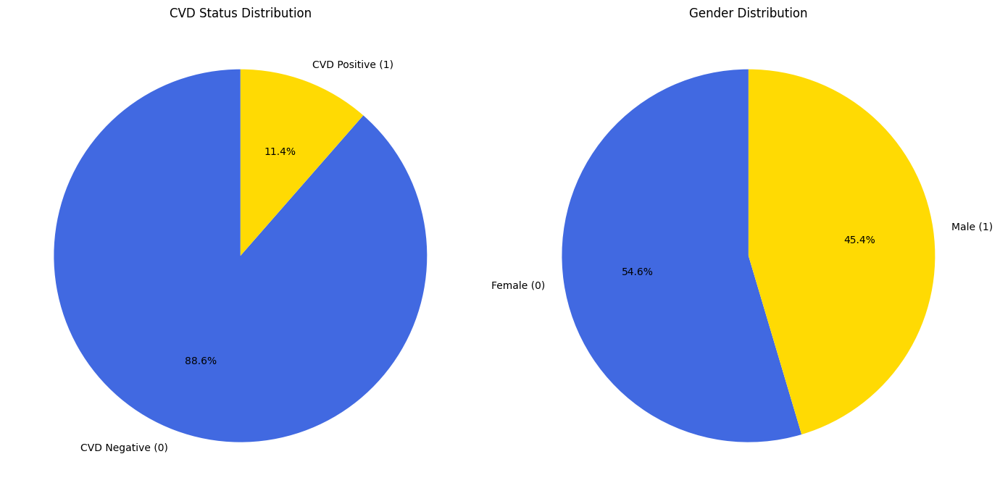

In [29]:
# Genderand CVD distribution

cvd_percentage = df['CVD'].value_counts(normalize=True) * 100

gender_percentage = df['Gender'].value_counts(normalize=True) * 100

fig, axes = plt.subplots(1, 2, figsize=(14, 7))

# CVD status pie chart
axes[0].pie(cvd_percentage, labels=['CVD Negative (0)', 'CVD Positive (1)'], autopct='%1.1f%%', startangle=90, colors=['#4169E1', '#FFDA03'])
axes[0].set_title('CVD Status Distribution')

# Gender distribution pie chart
axes[1].pie(gender_percentage, labels=['Female (0)', 'Male (1)'], autopct='%1.1f%%', startangle=90, colors=['#4169E1', '#FFDA03'])
axes[1].set_title('Gender Distribution')


plt.tight_layout()
plt.show()

Gender
Male      58.224543
Female    41.775457
Name: proportion, dtype: float64


<Figure size 600x600 with 0 Axes>

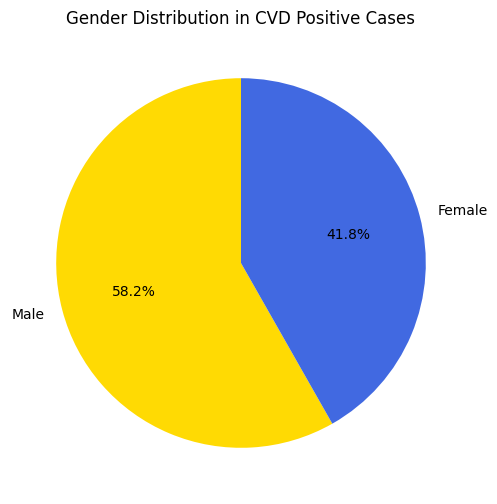

In [30]:
# Gender Distribution in CVD Positive Cases
cvd_positive = df[df['CVD'] == 1]

gender_distribution = cvd_positive['Gender'].value_counts(normalize=True) * 100

# Map the gender values to 'Male' and 'Female'
gender_distribution.index = gender_distribution.index.map({1: 'Male', 0: 'Female'})

print(gender_distribution)

plt.figure(figsize=(6, 6))
plt.figure(figsize=(6, 6))
plt.pie(gender_distribution, labels=gender_distribution.index, autopct='%1.1f%%', startangle=90, colors=['#FFDA03', '#4169E1'])
plt.title('Gender Distribution in CVD Positive Cases')
plt.show()

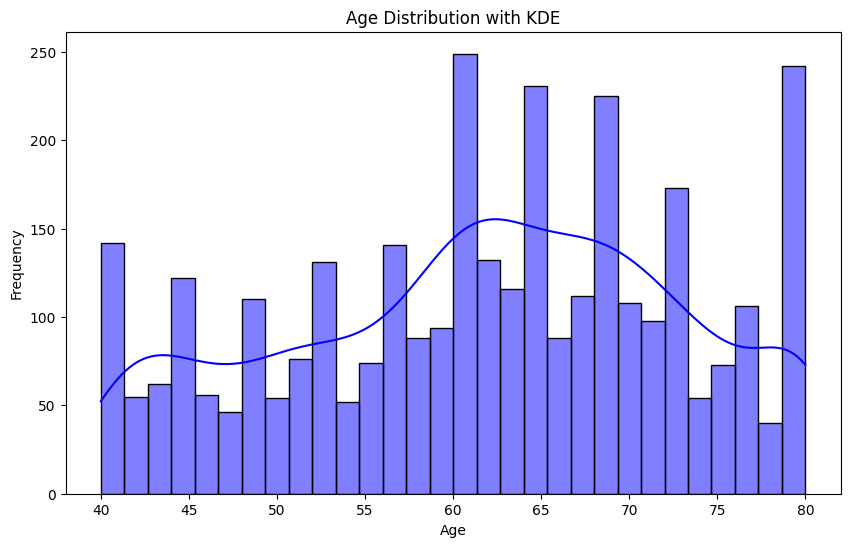

Shapiro-Wilk Test: W=0.9667, p=3.5716e-27
Kolmogorov-Smirnov Test: KS=0.0535, p=8.8979e-09
D'Agostino Test: Chi^2=393.6144, p=3.3708e-86


In [31]:
# Age Distribution and Normality Test

plt.figure(figsize=(10, 6))
sns.histplot(df['Age'], kde=True, color='blue', bins=30)
plt.title('Age Distribution with KDE')
plt.xlabel('Age')
plt.ylabel('Frequency')
plt.show()

# Shapiro-Wilk Test
shapiro_test = shapiro(df['Age'])
print(f"Shapiro-Wilk Test: W={shapiro_test.statistic:.4f}, p={shapiro_test.pvalue:.4e}")

# Kolmogorov-Smirnov Test
kstest_result = kstest(df['Age'], 'norm', args=(df['Age'].mean(), df['Age'].std()))
print(f"Kolmogorov-Smirnov Test: KS={kstest_result.statistic:.4f}, p={kstest_result.pvalue:.4e}")

# D'Agostino and Pearson's Test
dagostino_test = normaltest(df['Age'])
print(f"D'Agostino Test: Chi^2={dagostino_test.statistic:.4f}, p={dagostino_test.pvalue:.4e}")



In [32]:
# Split the dataset into two groups based on CVD values
CVD_Positive = df[df['CVD'] == 1]['Age']
CVD_negative = df[df['CVD'] == 0]['Age']

# Mann-Whitney U Test for Age
stat, p = mannwhitneyu(CVD_Positive, CVD_negative)
print(f"Mann-Whitney U Test: U={stat:.4f}, p={p:.4e}")



Mann-Whitney U Test: U=789182.0000, p=2.2546e-35


<ipython-input-33-7d1282d21e1d>:4: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x='CVD', y='Age', data=df, palette=custom_palette)


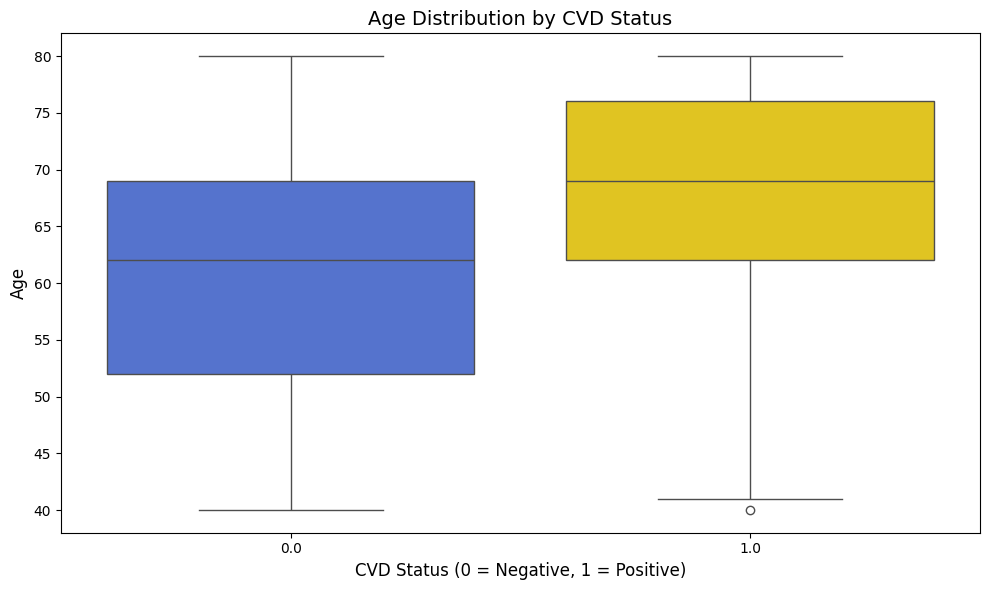

In [33]:
# Age distribution by CVD status
plt.figure(figsize=(10, 6))
custom_palette = ['#4169E1', '#FFDA03']
sns.boxplot(x='CVD', y='Age', data=df, palette=custom_palette)

plt.title('Age Distribution by CVD Status', fontsize=14)
plt.xlabel('CVD Status (0 = Negative, 1 = Positive)', fontsize=12)
plt.ylabel('Age', fontsize=12)

plt.tight_layout()
plt.show()

**Histogram and box plot for numerical feature**

<ipython-input-34-b4401c4dd589>:21: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x=df[feature], ax=axes[i, 1], palette='Set1')
<ipython-input-34-b4401c4dd589>:21: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x=df[feature], ax=axes[i, 1], palette='Set1')
<ipython-input-34-b4401c4dd589>:21: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x=df[feature], ax=axes[i, 1], palette='Set1')
<ipython-input-34-b4401c4dd589>:21: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variabl

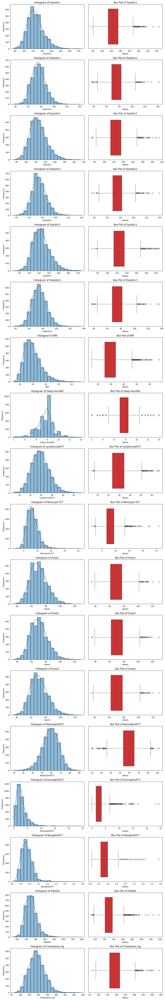

In [34]:
numerical_columns = [
    'Systolic1', 'Diastolic1', 'Systolic2', 'Diastolic2',
    'Systolic3', 'Diastolic3', 'BMI', 'Sleep HourWD',
     'LymphocytePCT', 'Monocyte PCT', "Pulse1", "Pulse2", "Pulse3",
    'NeutrophilsPCT', 'EosinophilsPCT', 'BasophilsPCT',
    'Platelet', 'Cholesterol_mg']


# Set up the figure with 2 plots
num_features = len(numerical_columns)
fig, axes = plt.subplots(num_features, 2, figsize=(12, 4*num_features))

# Loop through each feature
for i, feature in enumerate(numerical_columns):
    sns.histplot(df[feature], kde=True, ax=axes[i, 0], bins=20)
    axes[i, 0].set_title(f'Histogram of {feature}', fontsize=12)
    axes[i, 0].set_xlabel(feature)
    axes[i, 0].set_ylabel('Frequency')


    sns.boxplot(x=df[feature], ax=axes[i, 1], palette='Set1')
    axes[i, 1].set_title(f'Box Plot of {feature}', fontsize=12)
    axes[i, 1].set_xlabel('Values')


plt.tight_layout()
plt.show()

**Assessing Distribution and Variance Homogeneity in Cardiovascular Risk Factors**

          Variable  Normality_CVD0  Normality_CVD1      Levene_p  \
0        Systolic1           False           False  8.935520e-04   
1       Diastolic1           False           False  2.553031e-02   
2        Systolic2           False           False  4.039603e-05   
3       Diastolic2           False           False  7.706532e-02   
4        Systolic3           False           False  6.889187e-05   
5       Diastolic3           False           False  2.348918e-02   
6              BMI           False           False  1.623205e-03   
7     Sleep HourWD           False           False  3.559388e-03   
8    LymphocytePCT           False           False  5.021717e-01   
9     Monocyte PCT           False           False  6.645652e-02   
10          Pulse1           False           False  5.166086e-02   
11          Pulse2           False           False  3.639597e-02   
12          Pulse3           False           False  5.713575e-02   
13  NeutrophilsPCT           False           Fal

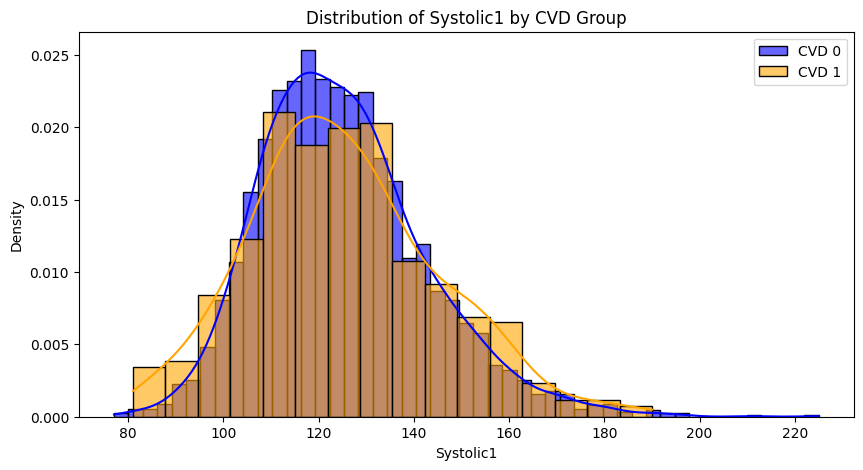

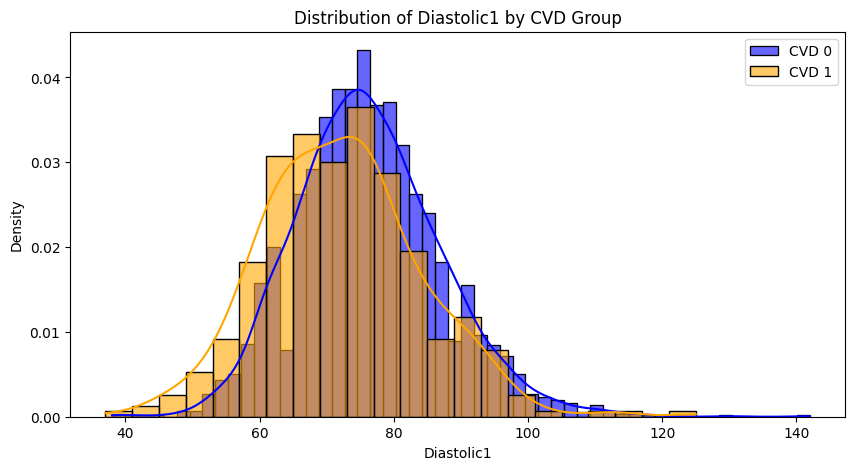

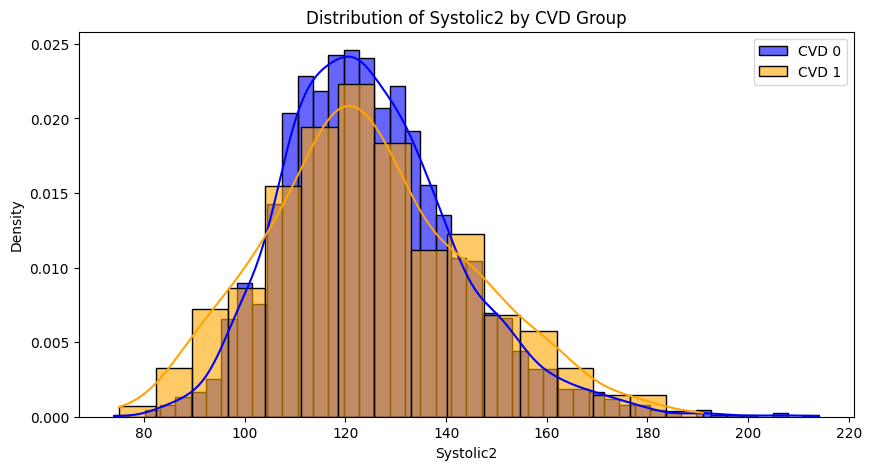

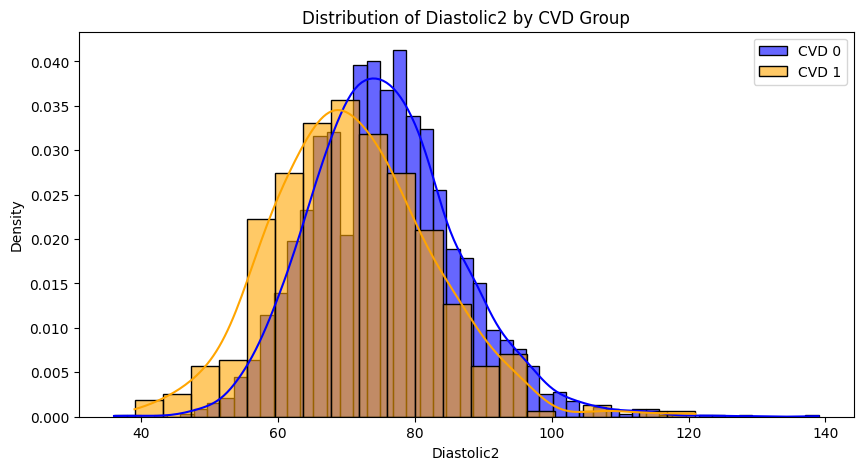

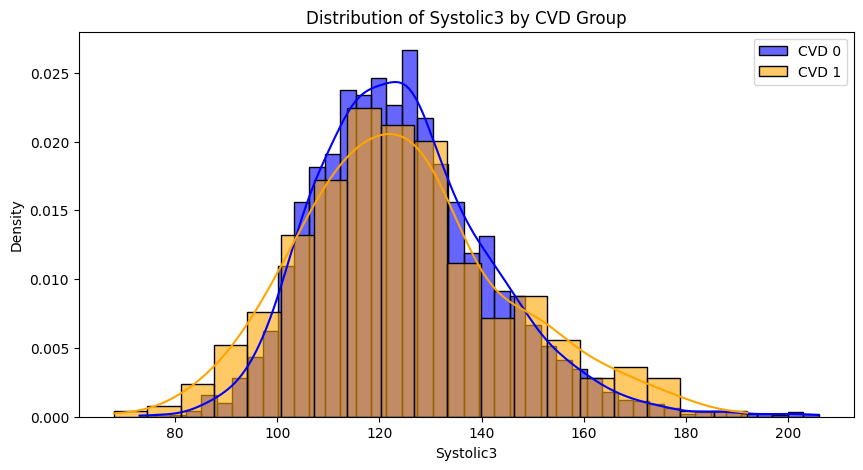

...

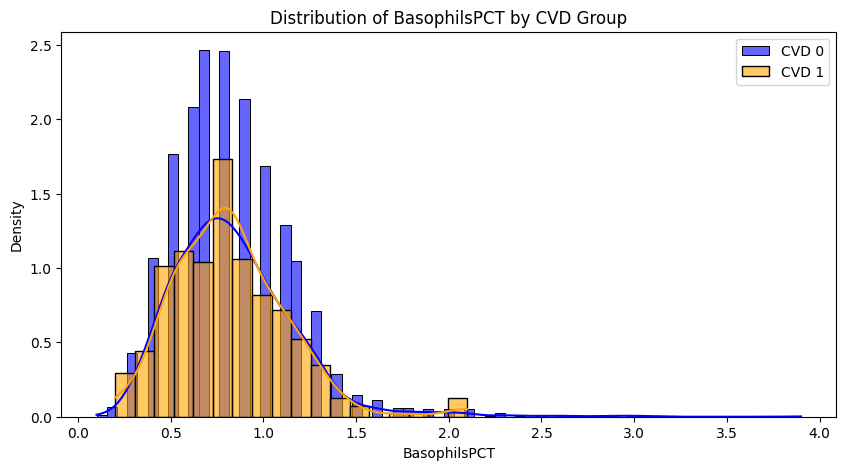

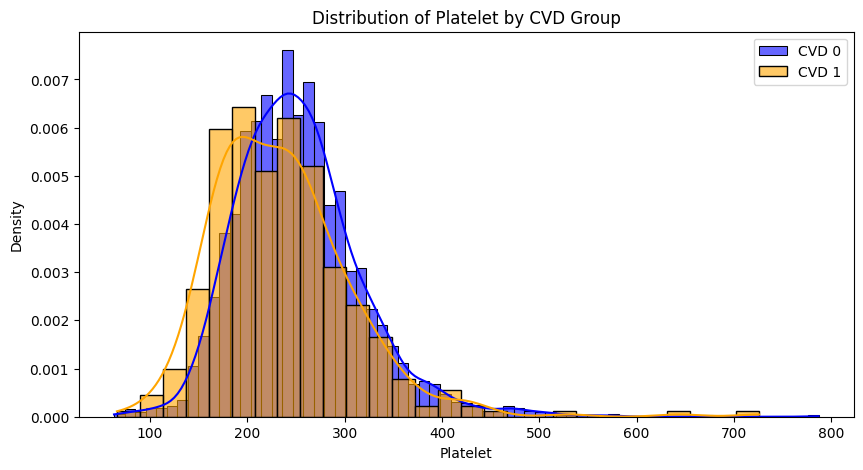

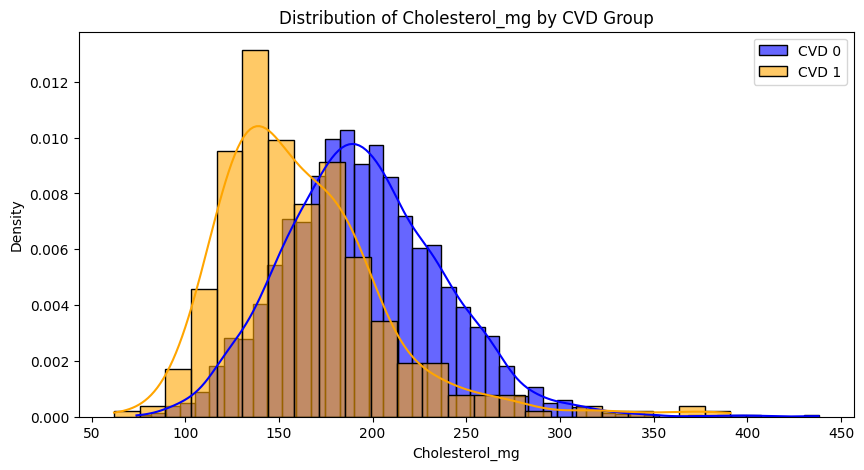

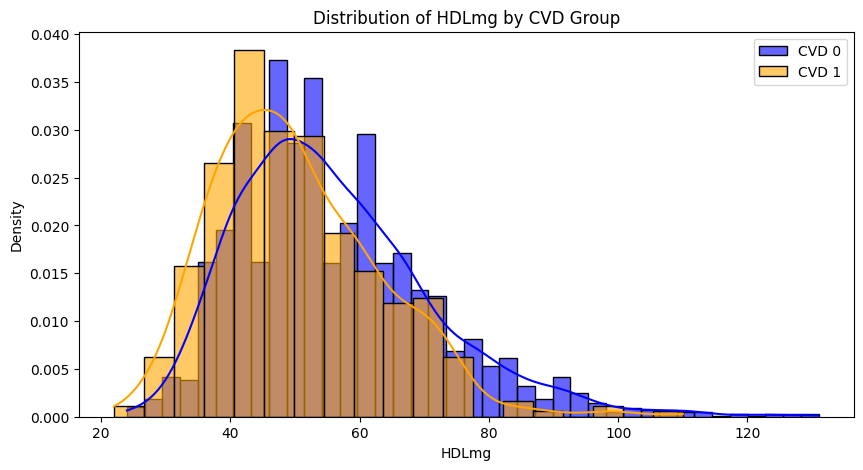

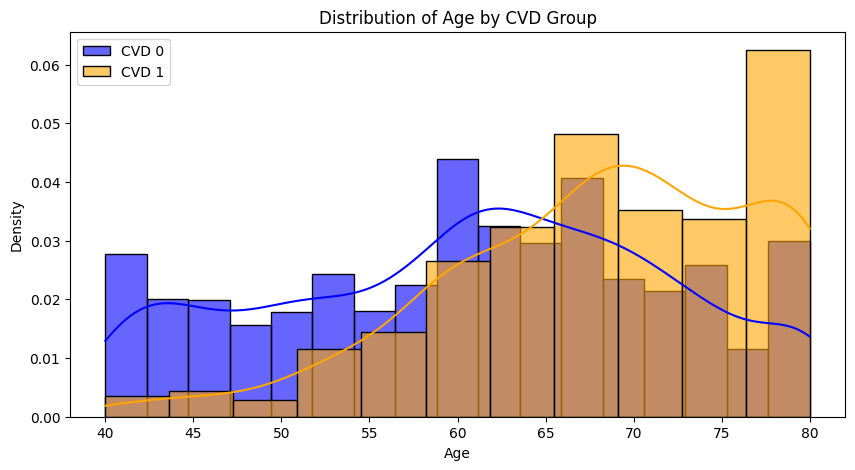

In [35]:
# Assessing Normality and Homogeneity of Variance Variables
variables_to_test = ['Systolic1', 'Diastolic1', 'Systolic2', 'Diastolic2',
    'Systolic3', 'Diastolic3', 'BMI', 'Sleep HourWD',
     'LymphocytePCT', 'Monocyte PCT', "Pulse1", "Pulse2", "Pulse3",
    'NeutrophilsPCT', 'EosinophilsPCT', 'BasophilsPCT',
    'Platelet', 'Cholesterol_mg', 'HDLmg', 'Age']
cvd_0 = df[df['CVD'] == 0]
cvd_1 = df[df['CVD'] == 1]

# Results storage
assumption_results = []

for variable in variables_to_test:
    # Normality tests
    _, p_shapiro_cvd0 = shapiro(cvd_0[variable])
    _, p_shapiro_cvd1 = shapiro(cvd_1[variable])
    normal_cvd0 = p_shapiro_cvd0 > 0.05
    normal_cvd1 = p_shapiro_cvd1 > 0.05

    # Equal variance test
    _, p_levene = levene(cvd_0[variable], cvd_1[variable])
    equal_var = p_levene > 0.05

    assumption_results.append({
        "Variable": variable,
        "Normality_CVD0": normal_cvd0,
        "Normality_CVD1": normal_cvd1,
        "Levene_p": p_levene,
        "Equal_Var_Assumption": equal_var})

# Convert results to DataFrame
assumption_results_df = pd.DataFrame(assumption_results)

# Display results
print(assumption_results_df)

# Plot distributions (optional)
for variable in variables_to_test:
    plt.figure(figsize=(10, 5))
    sns.histplot(cvd_0[variable], label="CVD 0", kde=True, color="blue", stat="density", alpha=0.6)
    sns.histplot(cvd_1[variable], label="CVD 1", kde=True, color="orange", stat="density", alpha=0.6)
    plt.title(f'Distribution of {variable} by CVD Group')
    plt.legend()
    plt.show()

**Relationships and Correlations Across Diverse Data Types**

In [36]:
!pip install pingouin
!pip install scipy

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 204.4/204.4 kB 5.9 MB/s eta 0:00:00


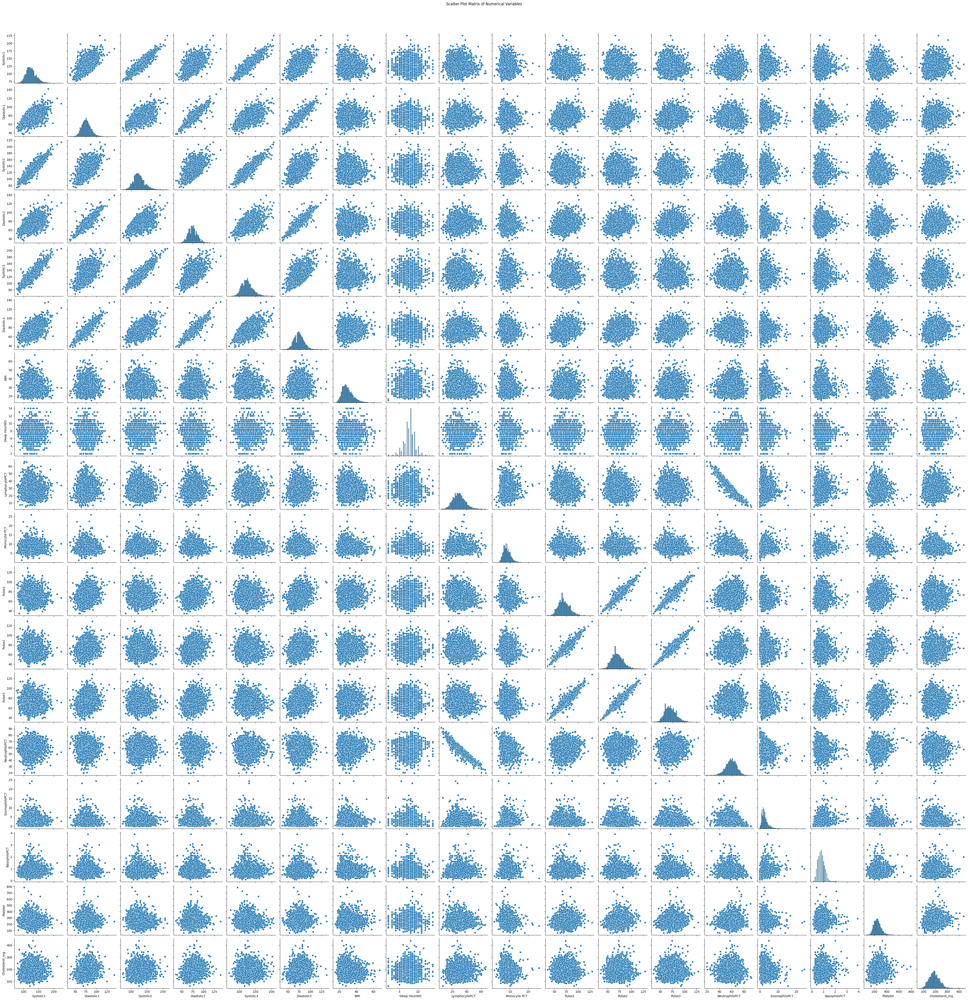

In [37]:
# Numerical <--> Numerical Correlations

# Selecting only the numerical variables
numerical_vars = ['Systolic1', 'Diastolic1', 'Systolic2', 'Diastolic2',
    'Systolic3', 'Diastolic3', 'BMI', 'Sleep HourWD',
     'LymphocytePCT', 'Monocyte PCT', "Pulse1", "Pulse2", "Pulse3",
    'NeutrophilsPCT', 'EosinophilsPCT', 'BasophilsPCT',
    'Platelet', 'Cholesterol_mg']

sns.pairplot(df[numerical_vars])
plt.suptitle('Scatter Plot Matrix of Numerical Variables', y=1.02)
plt.show()

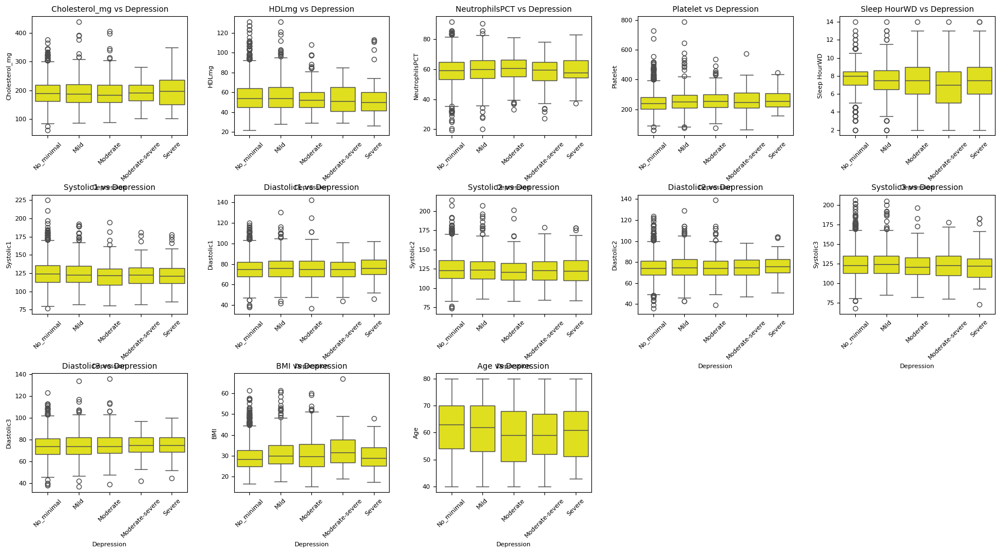

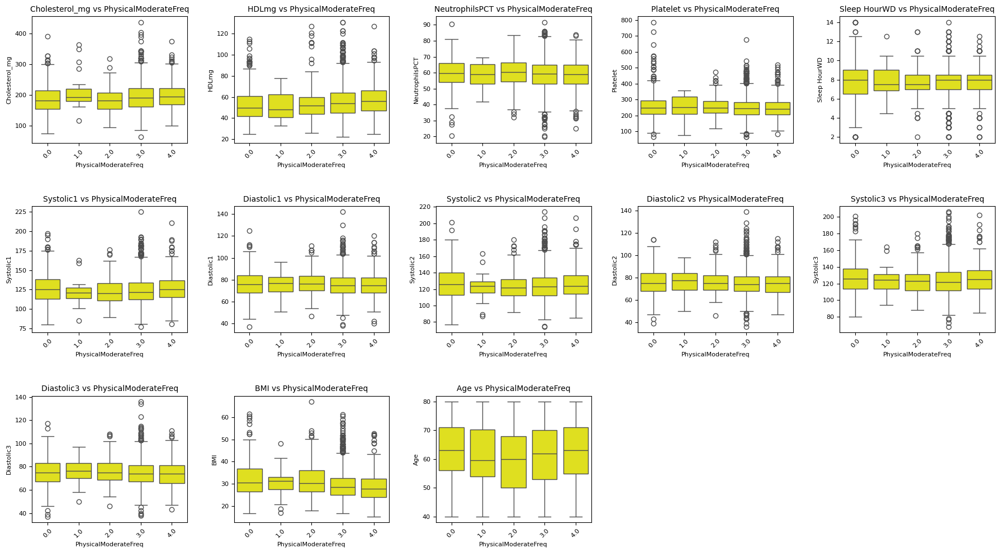

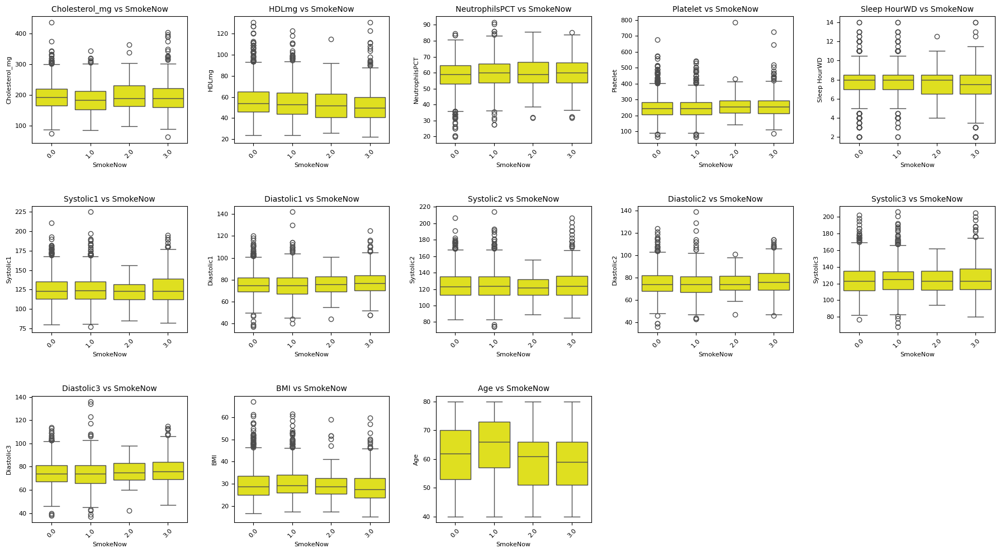

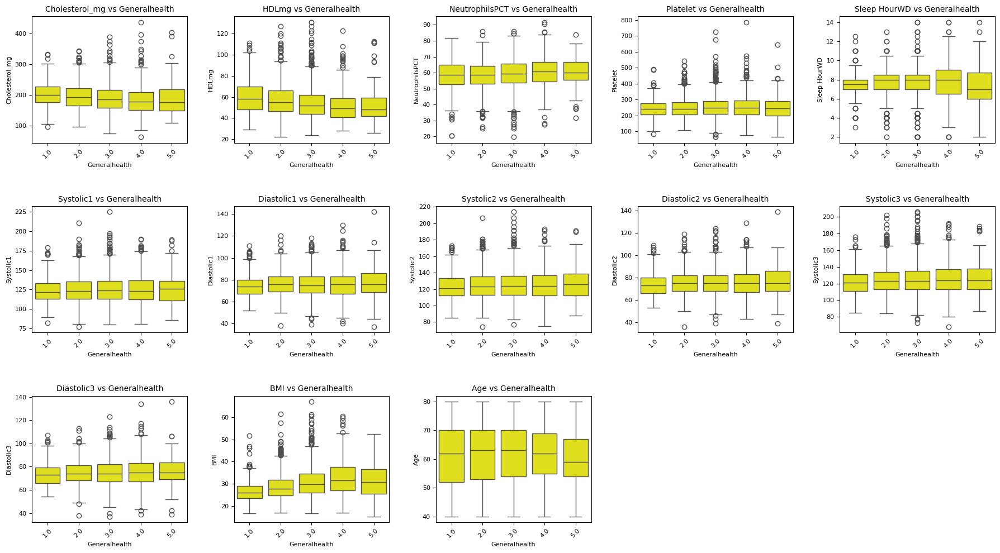

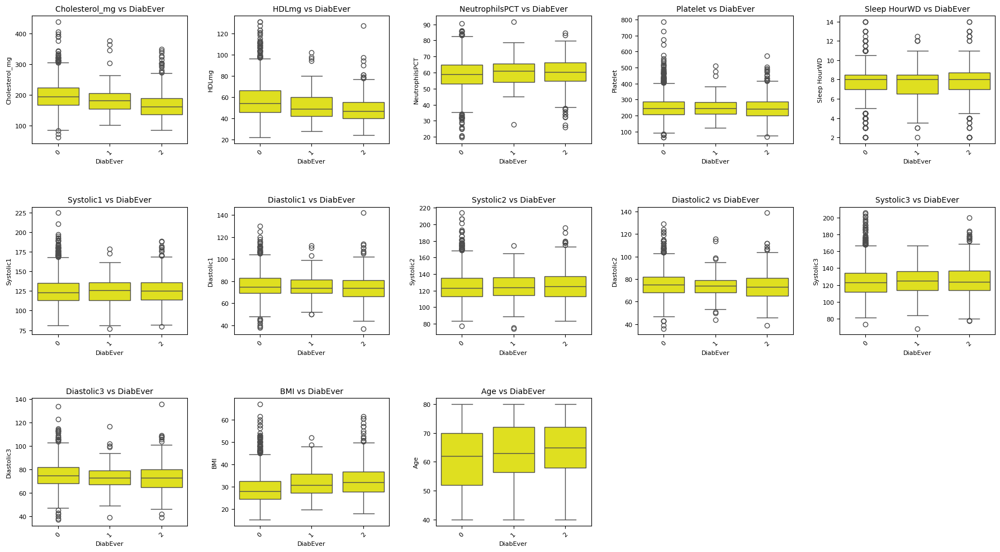

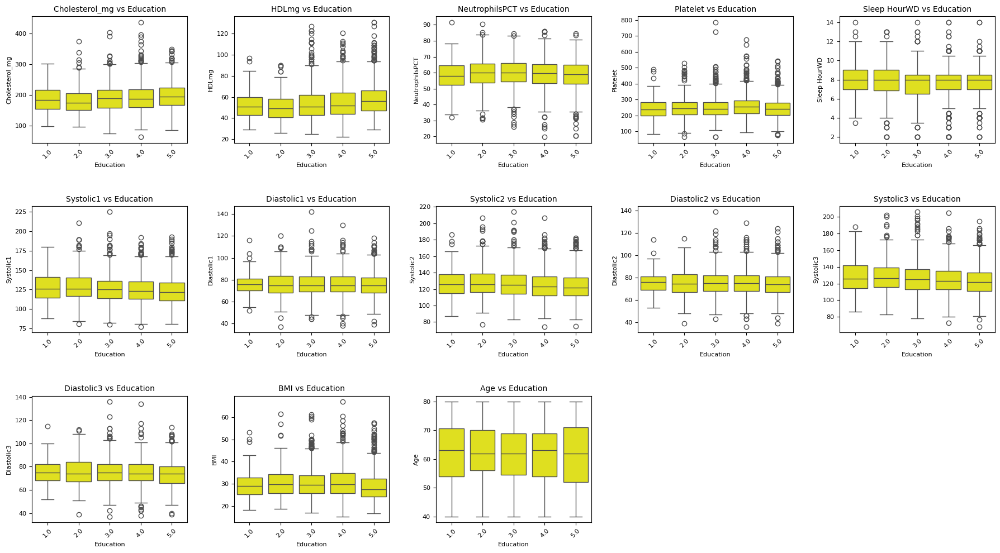

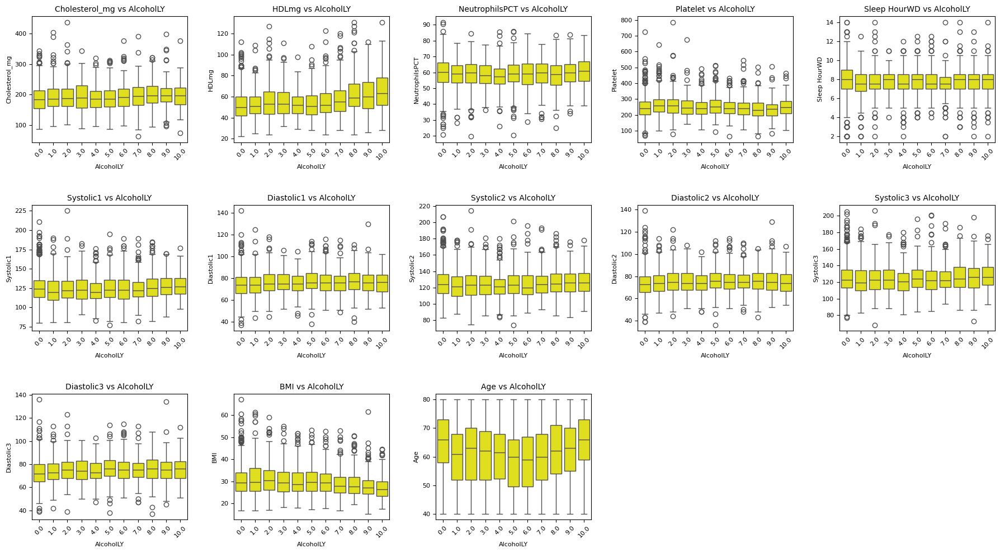

In [38]:
### Numerical vs ordinal variables

ordinal_columns = ['Depression', 'PhysicalModerateFreq', 'SmokeNow', 'Generalhealth', 'DiabEver',
                   'Education', 'AlcoholLY']
numerical_columns = ['Cholesterol_mg', 'HDLmg', 'NeutrophilsPCT', 'Platelet', 'Sleep HourWD',
                     'Systolic1', 'Diastolic1', 'Systolic2', 'Diastolic2', 'Systolic3', 'Diastolic3',
                     'BMI', 'Age']

yellow = "#FFFF00"

# Box plots for each ordinal variable
for ordinal_col in ordinal_columns:
    plt.figure(figsize=(18, 10))
    for i, num_col in enumerate(numerical_columns):
        plt.subplot(3, 5, i + 1)
        sns.boxplot(data=df, x=ordinal_col, y=num_col, color=yellow)
        plt.title(f'{num_col} vs {ordinal_col}', fontsize=10)
        plt.xticks(rotation=45, fontsize=8)
        plt.yticks(fontsize=8)
        plt.xlabel(ordinal_col, fontsize=8)
        plt.ylabel(num_col, fontsize=8)

    plt.tight_layout()
    plt.subplots_adjust(hspace=0.5, wspace=0.3)
    plt.show()



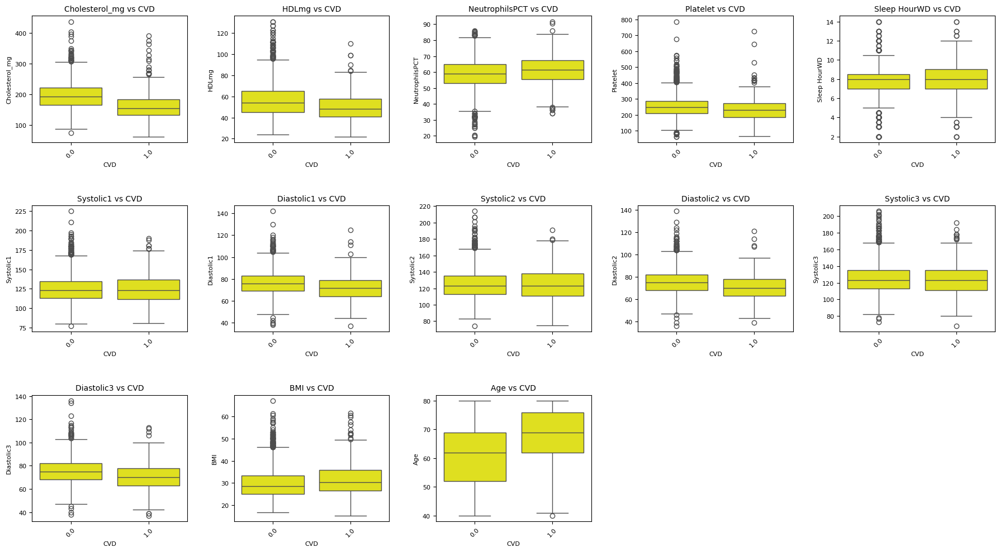

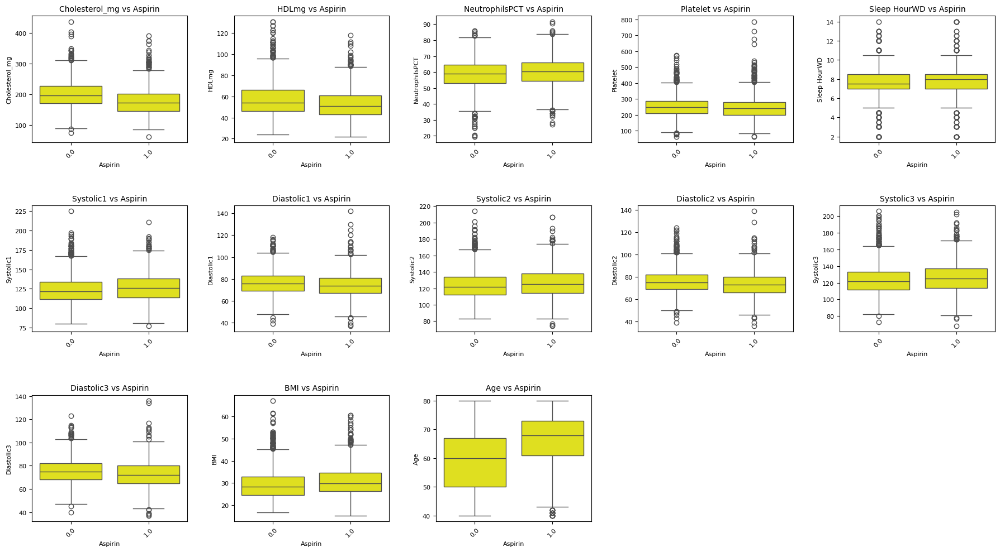

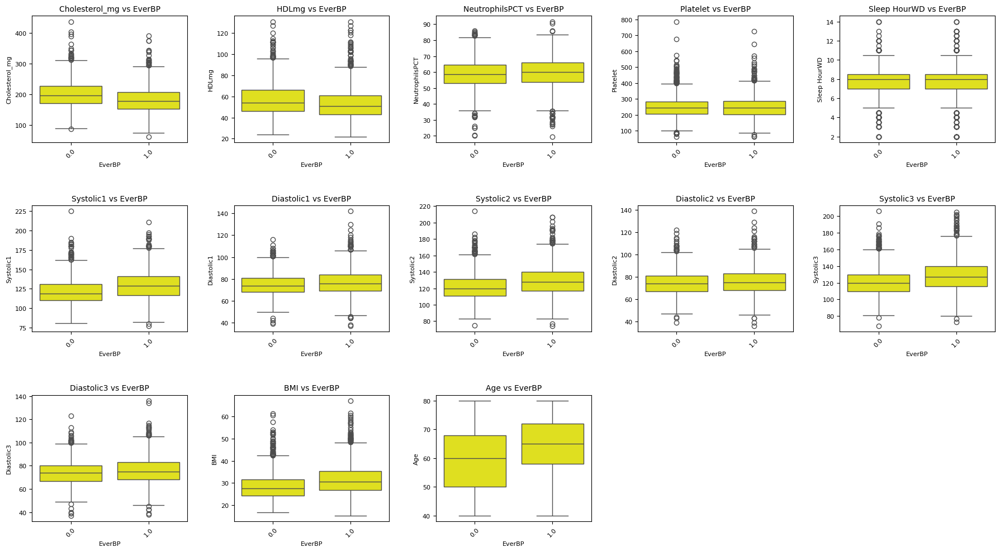

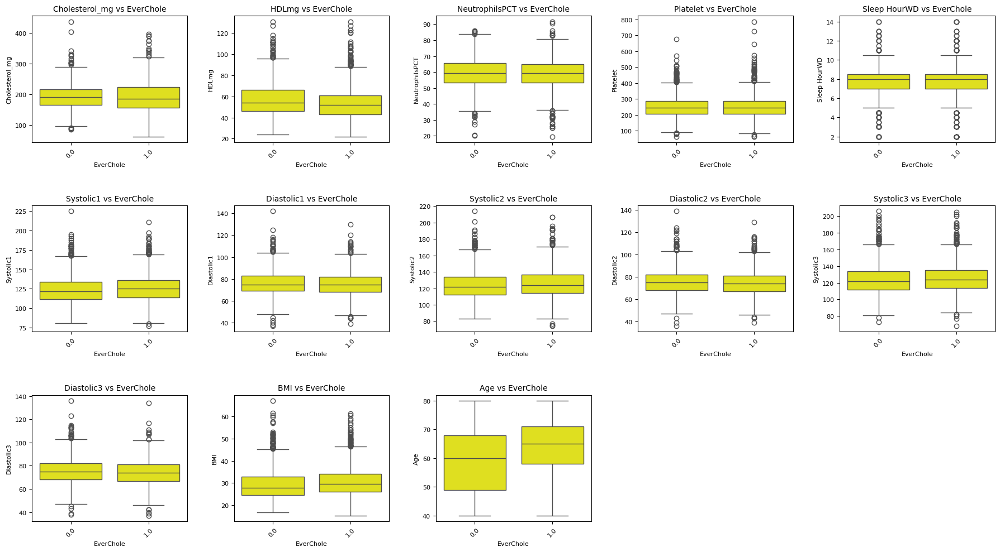

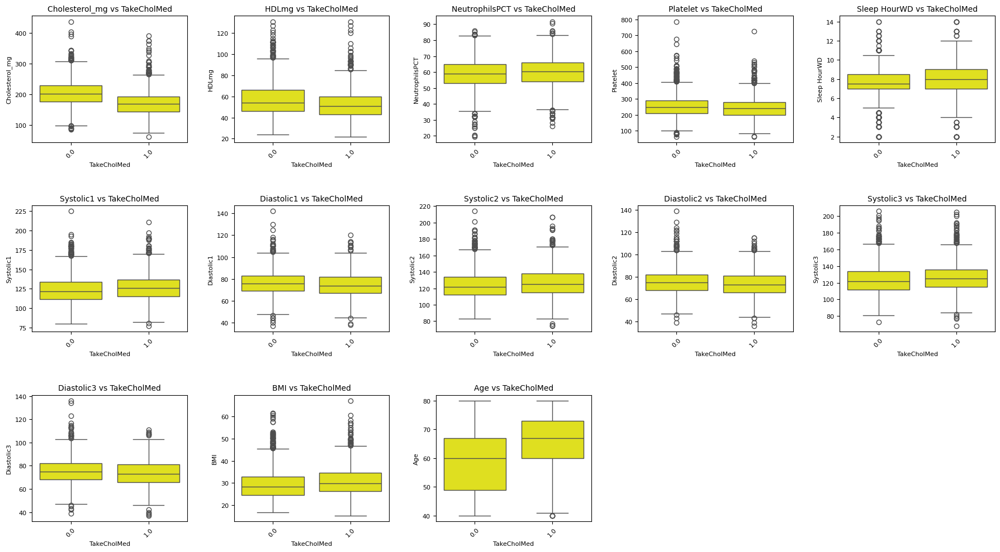

...

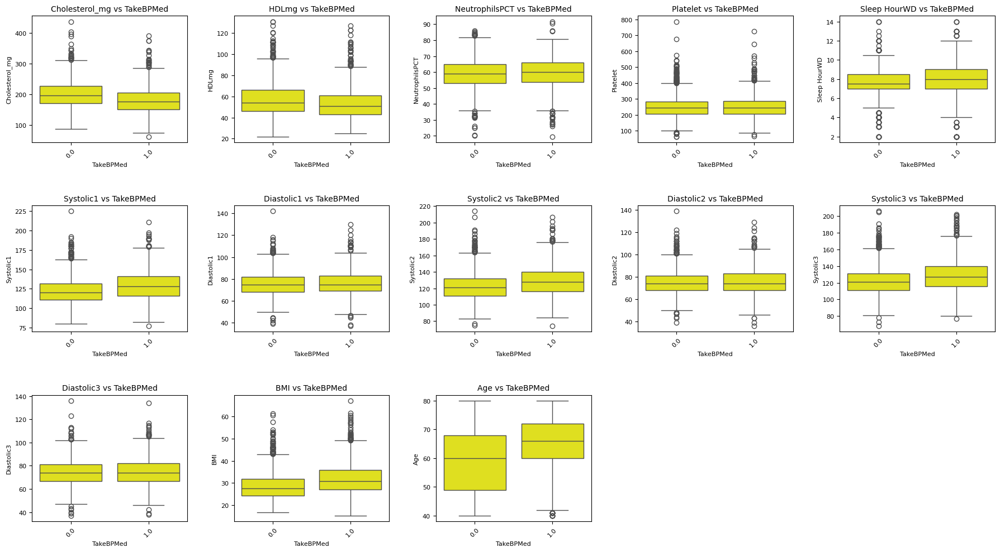

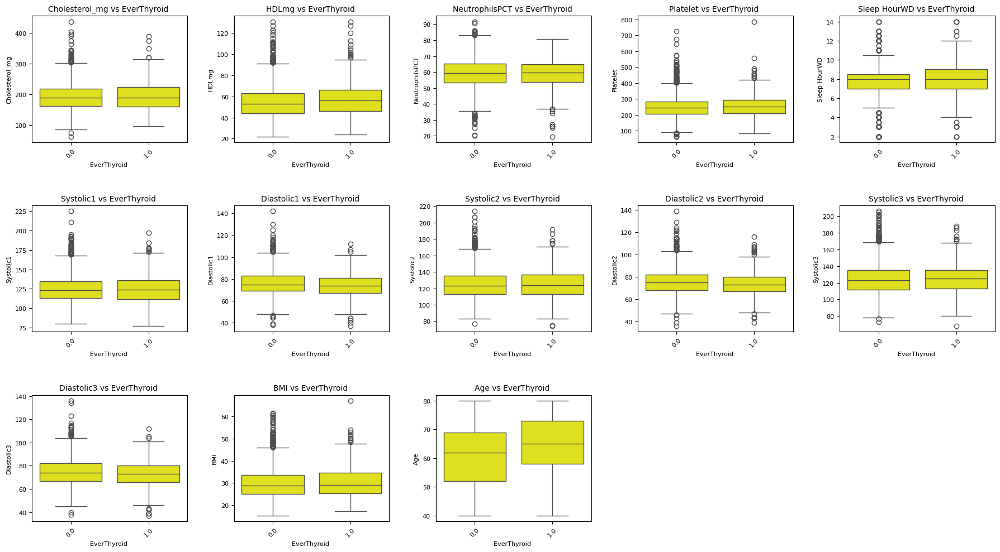

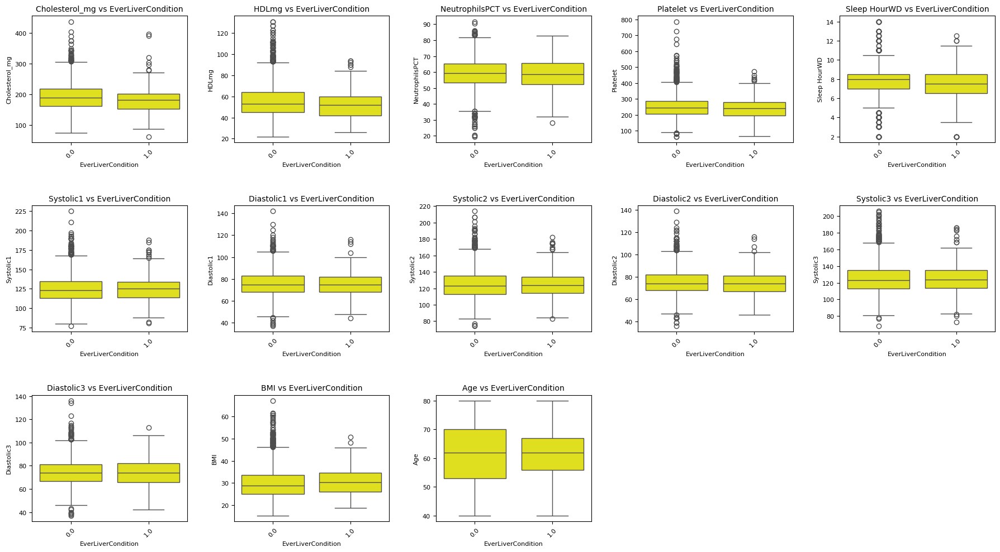

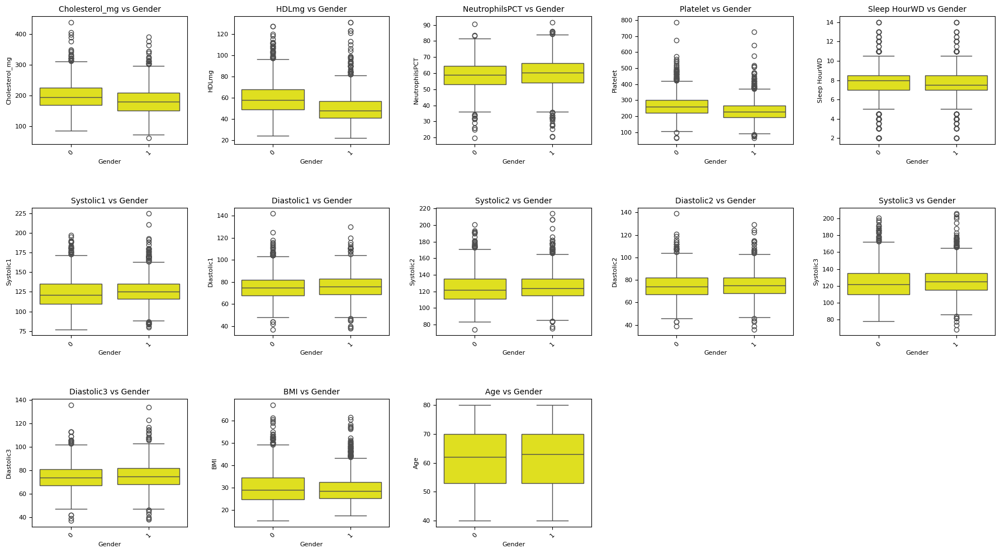

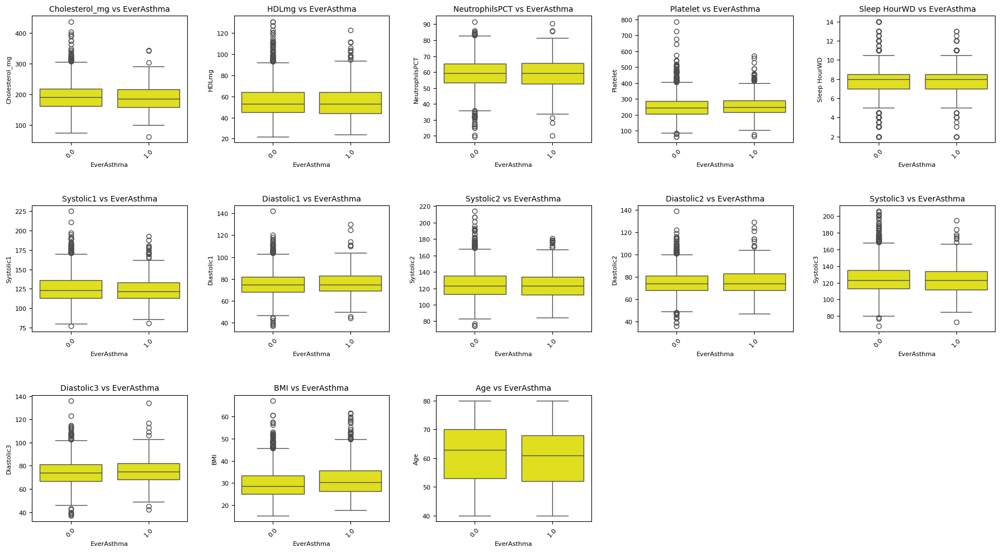

In [39]:
# Box plots for numerical vs binary variables

binary_columns = ['CVD', 'Aspirin', 'EverBP', 'EverChole', 'TakeCholMed', 'EverArthritis',
                  'TakeBPMed', 'EverThyroid ', 'EverLiverCondition', 'Gender', 'EverAsthma']

numerical_columns = ['Cholesterol_mg', 'HDLmg', 'NeutrophilsPCT', 'Platelet', 'Sleep HourWD',
                     'Systolic1', 'Diastolic1', 'Systolic2', 'Diastolic2', 'Systolic3', 'Diastolic3',
                     'BMI', 'Age']

yellow = "#FFFF00"

# Create box plots
for binary_col in binary_columns:
    plt.figure(figsize=(18, 10))
    for i, num_col in enumerate(numerical_columns):
        plt.subplot(3, 5, i + 1)
        sns.boxplot(data=df, x=binary_col, y=num_col, color=yellow)
        plt.title(f'{num_col} vs {binary_col}', fontsize=10)
        plt.xticks(rotation=45, fontsize=8)
        plt.yticks(fontsize=8)
        plt.xlabel(binary_col, fontsize=8)
        plt.ylabel(num_col, fontsize=8)

    plt.tight_layout()
    plt.subplots_adjust(hspace=0.5, wspace=0.3)
    plt.show()


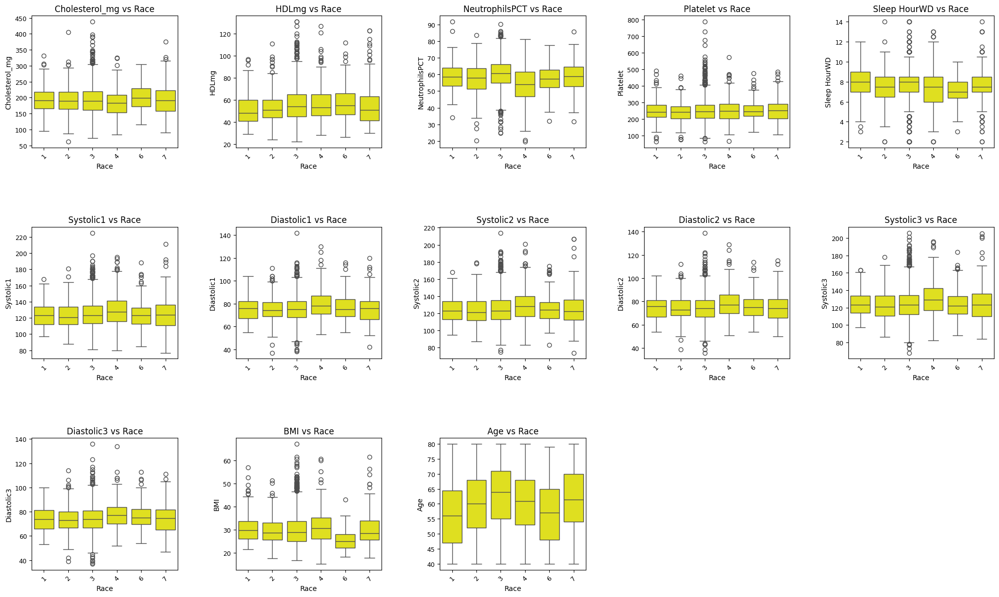

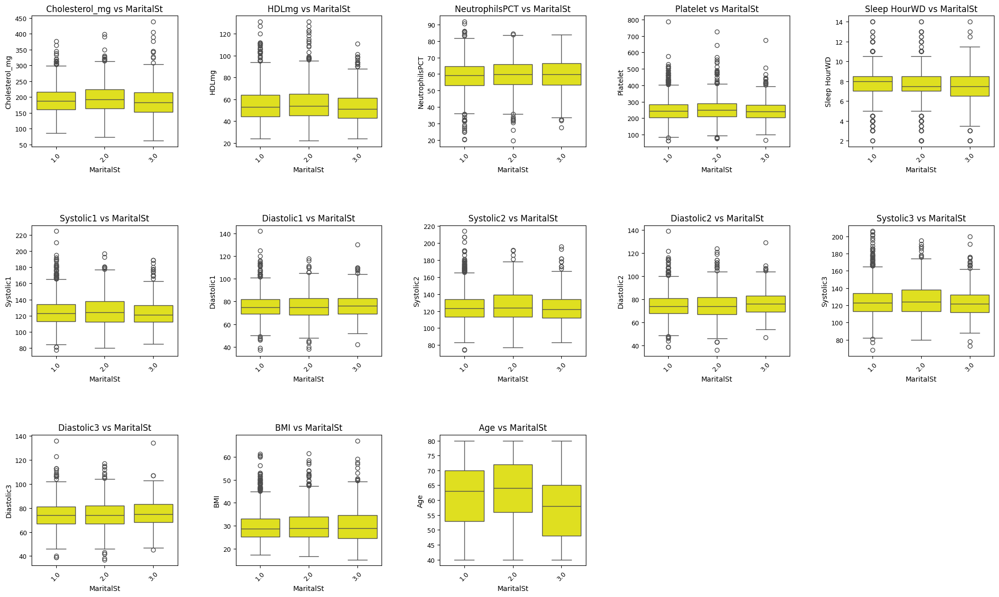

In [40]:
### Box plots for numerical vs categorical variables

categorical_columns = ['Race', 'MaritalSt']

numerical_columns = ['Cholesterol_mg', 'HDLmg', 'NeutrophilsPCT', 'Platelet', 'Sleep HourWD',
                     'Systolic1', 'Diastolic1', 'Systolic2', 'Diastolic2', 'Systolic3', 'Diastolic3',
                     'BMI', 'Age']

yellow = "#FFFF00"

# Create box plots
for categorical_col in categorical_columns:
    plt.figure(figsize=(20, 12))
    for i, num_col in enumerate(numerical_columns):
        plt.subplot(3, 5, i + 1)
        sns.boxplot(data=df, x=categorical_col, y=num_col, color=yellow)
        plt.title(f'{num_col} vs {categorical_col}', fontsize=12)
        plt.xticks(rotation=45, fontsize=9)
        plt.yticks(fontsize=9)
        plt.xlabel(categorical_col, fontsize=10)
        plt.ylabel(num_col, fontsize=10)

    plt.tight_layout()
    plt.subplots_adjust(hspace=0.6, wspace=0.4)
    plt.show()

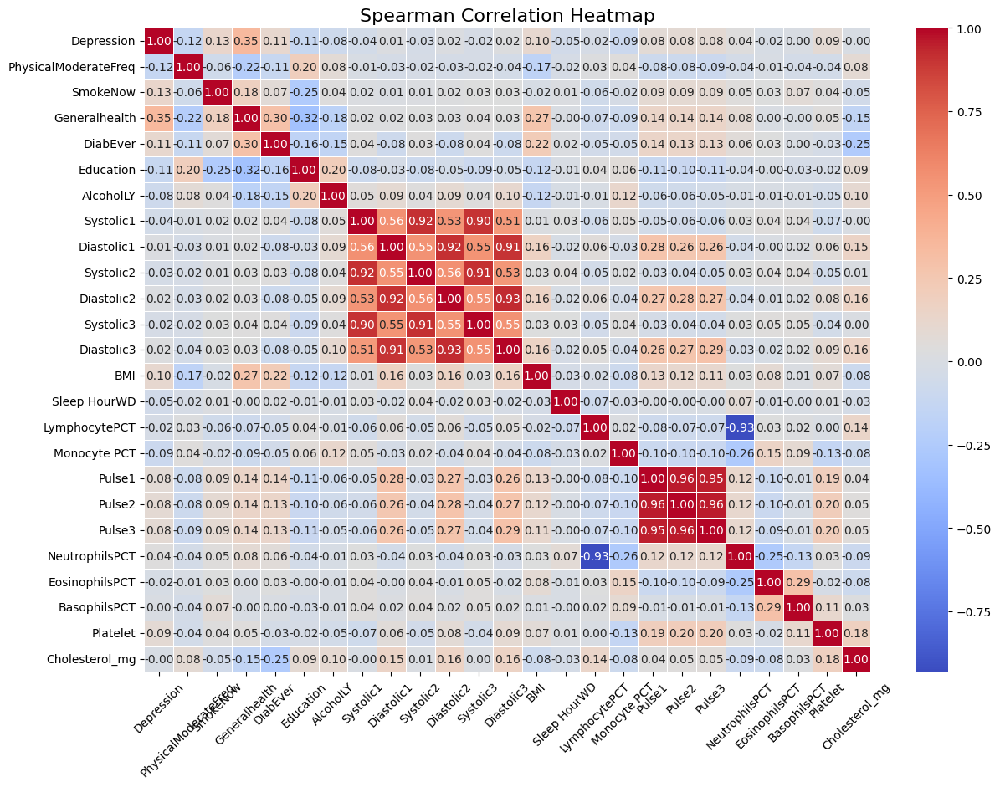

In [41]:
### Spearman Correlation Heatmap

# Mapping ordinal values for Depression
depression_mapping = {
    'No_minimal': 0,
    'Mild': 1,
    'Moderate': 2,
    'Severe': 3,
    'Moderate-severe': 4}

df['Depression'] = df['Depression'].map(depression_mapping)


ordinal_columns = ['Depression', 'PhysicalModerateFreq', 'SmokeNow', 'Generalhealth', 'DiabEver',
                   'Education', 'AlcoholLY']
numerical_columns = ['Systolic1', 'Diastolic1', 'Systolic2', 'Diastolic2',
    'Systolic3', 'Diastolic3', 'BMI', 'Sleep HourWD',
     'LymphocytePCT', 'Monocyte PCT', "Pulse1", "Pulse2", "Pulse3",
    'NeutrophilsPCT', 'EosinophilsPCT', 'BasophilsPCT',
    'Platelet', 'Cholesterol_mg']

# Subset the dataframe to include only numerical and ordinal variables
df_subset = df[ordinal_columns + numerical_columns]

# Compute the Spearman correlation matrix
corr_matrix = df_subset.corr(method='spearman')

# Plot
plt.figure(figsize=(14, 10))
sns.heatmap(corr_matrix, annot=True, cmap='coolwarm', fmt='.2f', linewidths=0.5)
plt.title('Spearman Correlation Heatmap', fontsize=16)
plt.xticks(rotation=45, fontsize=10)
plt.yticks(fontsize=10)
plt.show()


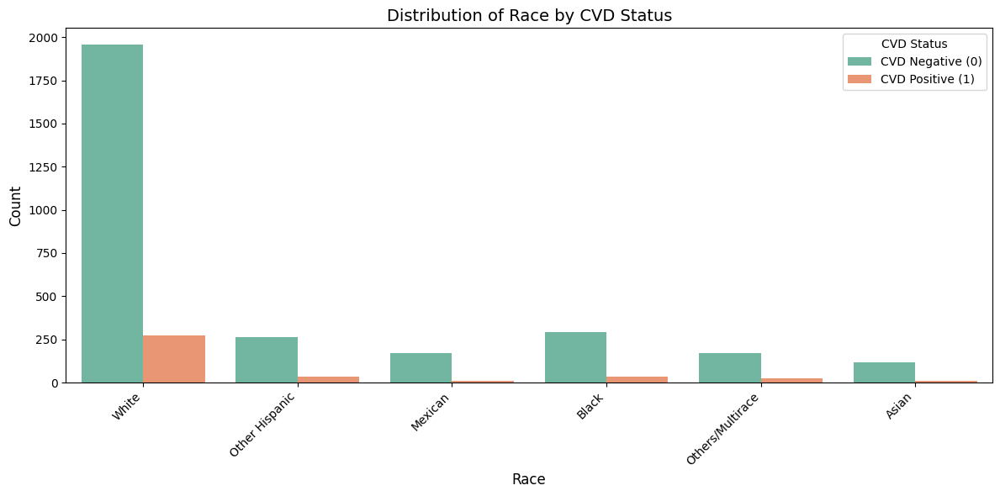

Percentage Distribution of Race in CVD Positive Cases:
Race_Mapped
White               71.018277
Other Hispanic       8.877285
Black                8.355091
Others/Multirace     6.527415
Asian                2.872063
Mexican              2.349869
Name: proportion, dtype: float64


<ipython-input-42-501bcf6433f3>:43: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  ax = sns.barplot(x=race_distribution.index, y=race_distribution.values, palette='Set2')


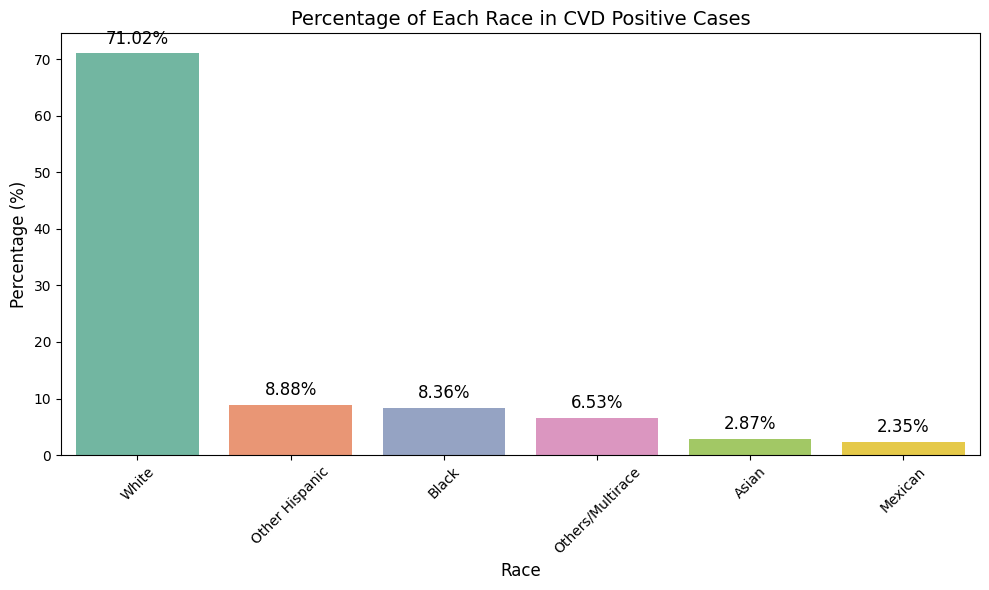

In [42]:
### Distribution of Race by CVD Status

# Map numerical values to race categories
race_mapping = {
    1: 'Mexican',
    2: 'Other Hispanic',
    3: 'White',
    4: 'Black',
    6: 'Asian',
    7: 'Others/Multirace'}

df['Race_Original'] = df['Race']

# Map numerical Race values to categories in a new column
df['Race_Mapped'] = df['Race_Original'].map(race_mapping)

###### First Plot: Distribution of Race by CVD Status

plt.figure(figsize=(12, 6))

sns.countplot(data=df, x='Race_Mapped', hue='CVD', palette='Set2')

plt.title('Distribution of Race by CVD Status', fontsize=14)
plt.xlabel('Race', fontsize=12)
plt.ylabel('Count', fontsize=12)
plt.xticks(rotation=45, ha='right')
plt.legend(title='CVD Status', loc='upper right', labels=['CVD Negative (0)', 'CVD Positive (1)'])
plt.tight_layout()


plt.show()

######## Second Plot: Percentage of Each Race in CVD Positive Cases

cvd_positive = df[df['CVD'] == 1]

race_distribution = cvd_positive['Race_Mapped'].value_counts(normalize=True) * 100

print("Percentage Distribution of Race in CVD Positive Cases:")
print(race_distribution)

plt.figure(figsize=(10, 6))
ax = sns.barplot(x=race_distribution.index, y=race_distribution.values, palette='Set2')

for p in ax.patches:
    height = p.get_height()
    ax.text(p.get_x() + p.get_width() / 2, height + 1, f'{height:.2f}%',
            ha='center', va='bottom', fontsize=12, color='black')

plt.title('Percentage of Each Race in CVD Positive Cases', fontsize=14)
plt.xlabel('Race', fontsize=12)
plt.ylabel('Percentage (%)', fontsize=12)
plt.xticks(rotation=45)
plt.tight_layout()

plt.show()

MaritalStatus
Married             53.524804
Widowed/Divorced    37.597911
Never Married        8.877285
Name: proportion, dtype: float64


<ipython-input-43-de09e1585bf9>:18: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  ax = sns.barplot(x=marital_distribution.index, y=marital_distribution.values, palette='Set3')


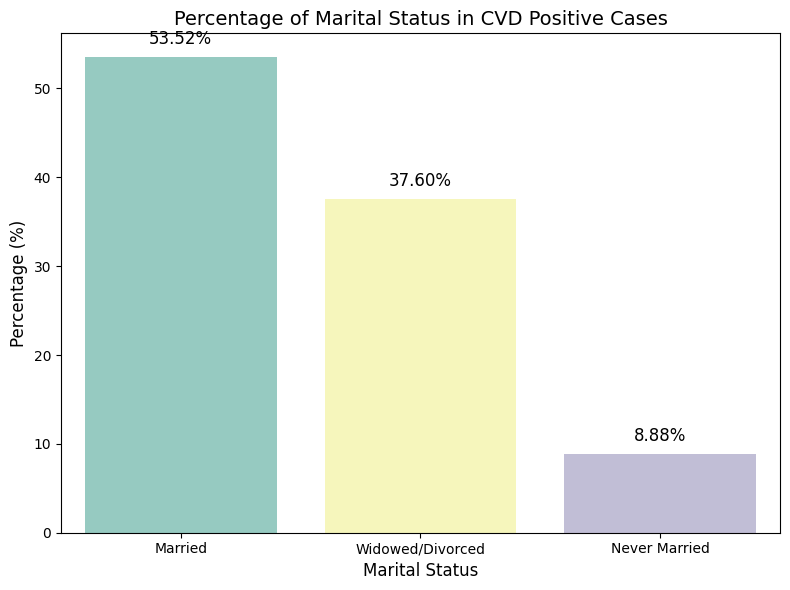

In [43]:
### Marital Status in CVD
# Map numerical values to marital status
marital_mapping = {
    1: 'Married',
    2: 'Widowed/Divorced',
    3: 'Never Married'}

df['MaritalStatus'] = df['MaritalSt'].map(marital_mapping)

cvd_positive = df[df['CVD'] == 1]

marital_distribution = cvd_positive['MaritalStatus'].value_counts(normalize=True) * 100

print(marital_distribution)


plt.figure(figsize=(8, 6))
ax = sns.barplot(x=marital_distribution.index, y=marital_distribution.values, palette='Set3')


for p in ax.patches:
    height = p.get_height()
    ax.text(p.get_x() + p.get_width() / 2, height + 1, f'{height:.2f}%',
            ha='center', va='bottom', fontsize=12, color='black')

plt.title('Percentage of Marital Status in CVD Positive Cases', fontsize=14)
plt.xlabel('Marital Status', fontsize=12)
plt.ylabel('Percentage (%)', fontsize=12)
plt.tight_layout()
plt.show()

**Visualization of Percentage Distribution for Categorical Variables by CVD Group**

<ipython-input-44-78f64cebc1e3>:9: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  group_counts = df.groupby([target, variable]).size().reset_index(name='Counts')


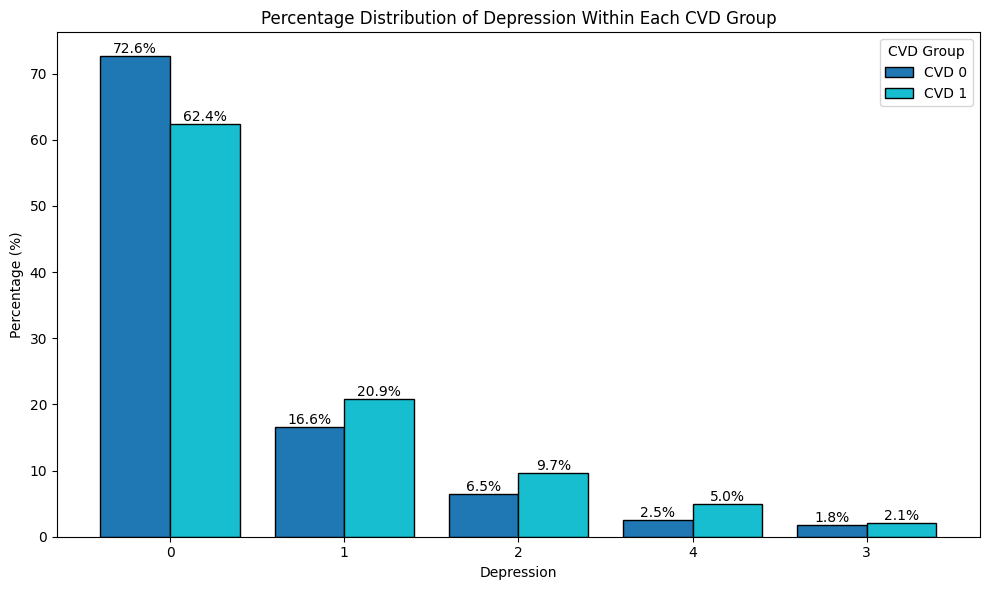

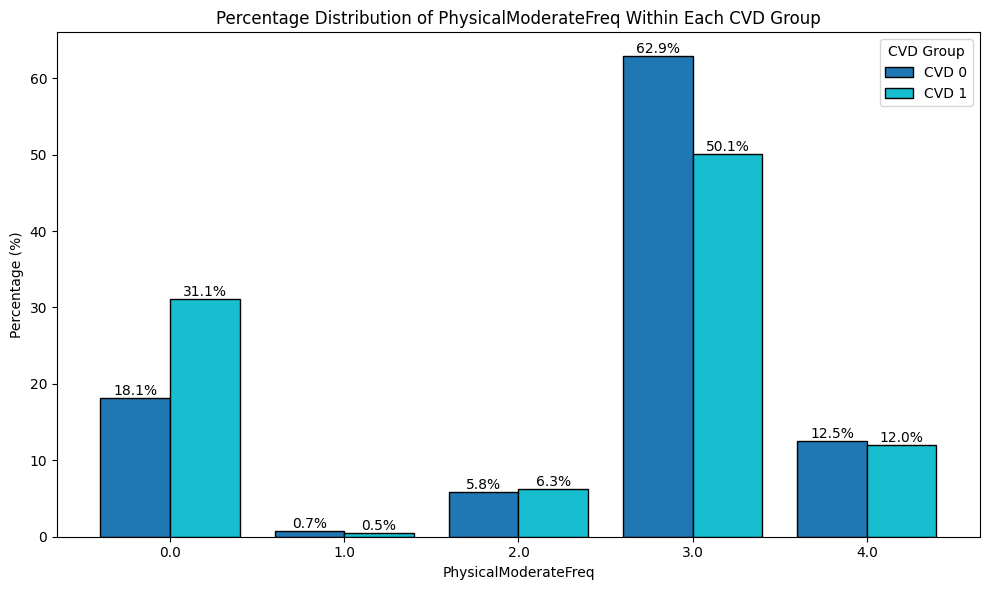

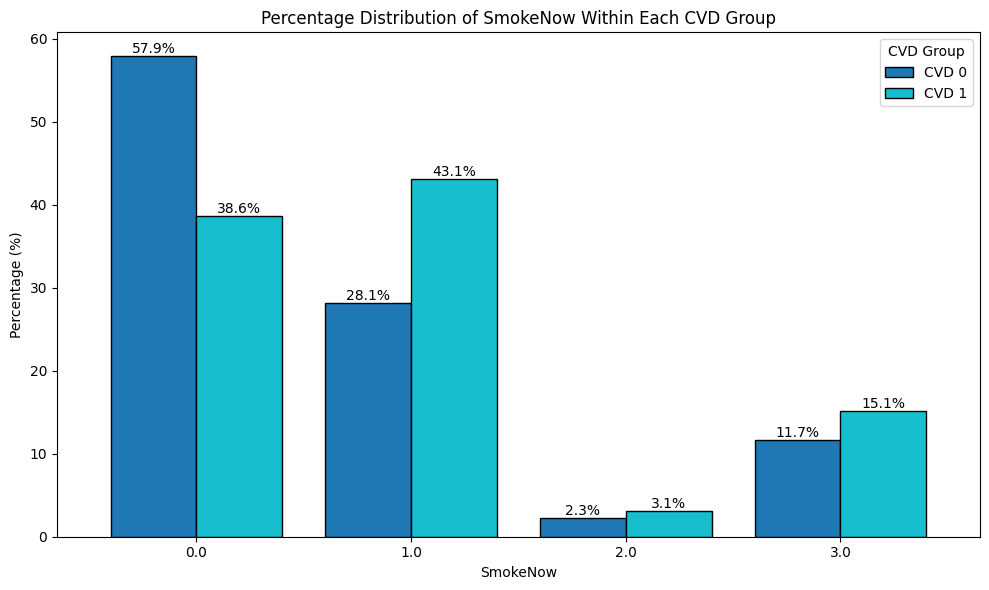

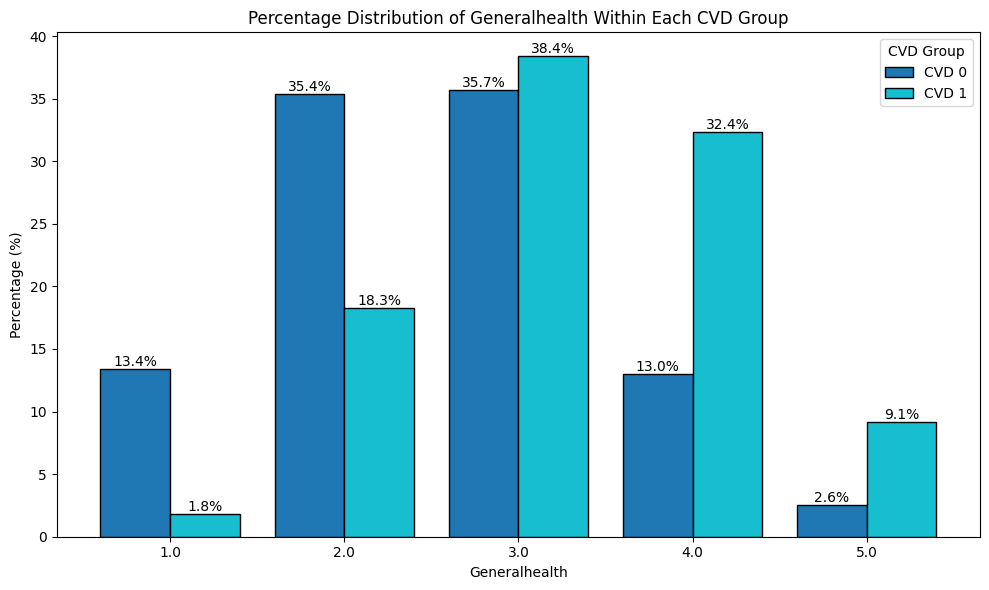

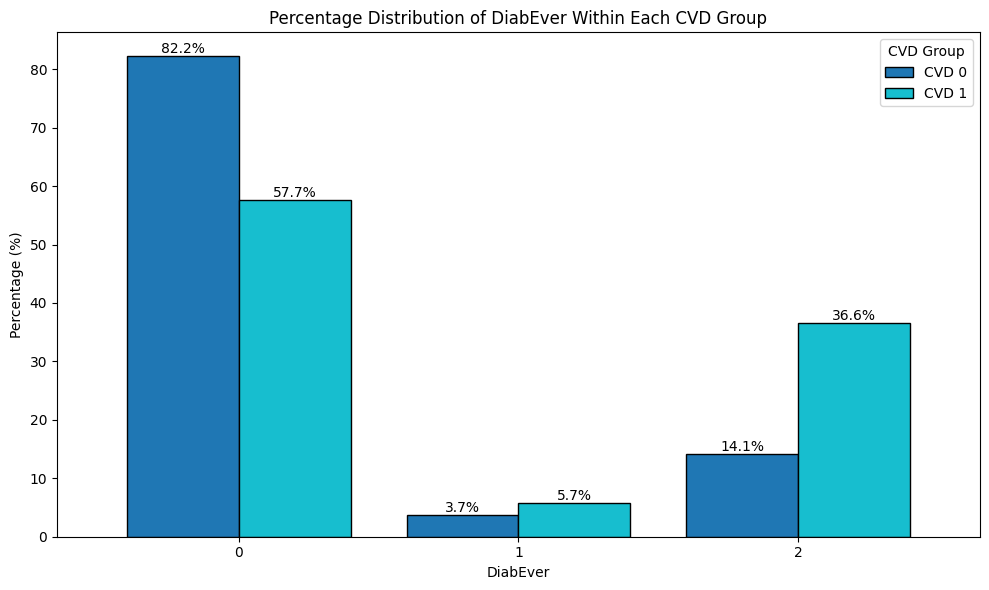

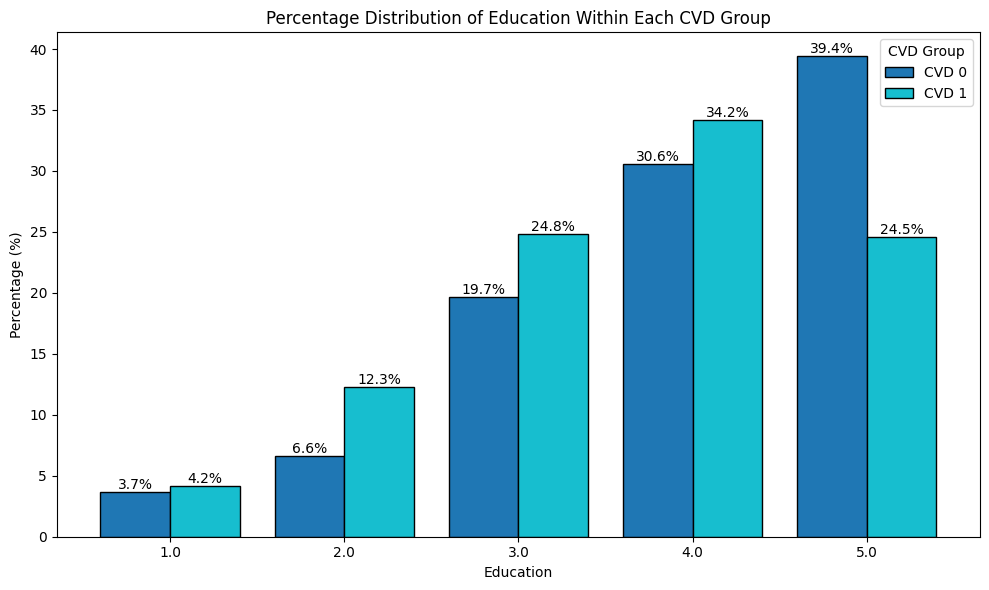

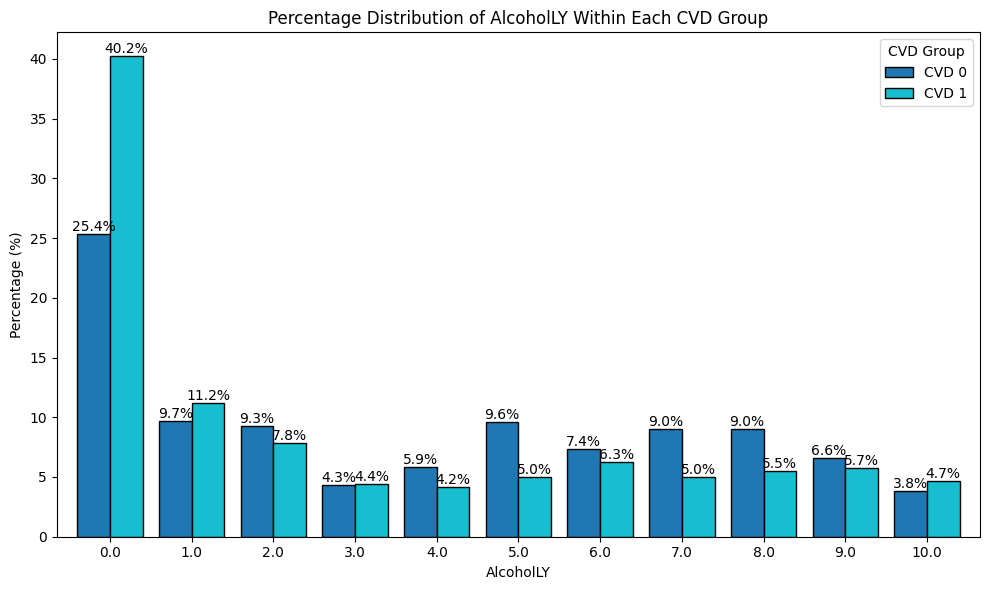

In [44]:
######## Bar Chart Visualization of Percentage Distribution for Categorical Variables by CVD Group
# List of categorical variables to analyze
categorical_vars = ['Depression','PhysicalModerateFreq', 'SmokeNow', 'Generalhealth',
    'DiabEver', 'Education', 'AlcoholLY']


# Function to create bar chart for each variable
def plot_percentage_distribution(df, variable, target='CVD'):
    group_counts = df.groupby([target, variable]).size().reset_index(name='Counts')
    pivoted = group_counts.pivot(index=variable, columns=target, values='Counts').fillna(0)

    # Normalize within each target group
    pivoted = pivoted.div(pivoted.sum(axis=0), axis=1) * 100

    # Reset index for plotting
    pivoted.reset_index(inplace=True)


    pivoted.columns.name = None
    column_names = [variable] + [f'{target} {int(col)}' for col in pivoted.columns[1:]]
    pivoted.columns = column_names

    # Plotting
    ax = pivoted.plot(
        x=variable, kind='bar', figsize=(10, 6), colormap='tab10', width=0.8, edgecolor='black')

    for container in ax.containers:
        for bar in container:
            height = bar.get_height()
            if height > 0:
                ax.text(
                    bar.get_x() + bar.get_width() / 2,
                    height,
                    f'{height:.1f}%',
                    ha='center', va='bottom', fontsize=10)


    plt.title(f'Percentage Distribution of {variable} Within Each {target} Group')
    plt.xlabel(variable)
    plt.ylabel('Percentage (%)')
    plt.legend(title=f'{target} Group')
    plt.xticks(rotation=0)
    plt.tight_layout()
    plt.show()

for var in categorical_vars:
    plot_percentage_distribution(df, var, target='CVD')


<ipython-input-45-d582b952f158>:5: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  group_counts = df.groupby([target, variable]).size().reset_index(name='Counts')


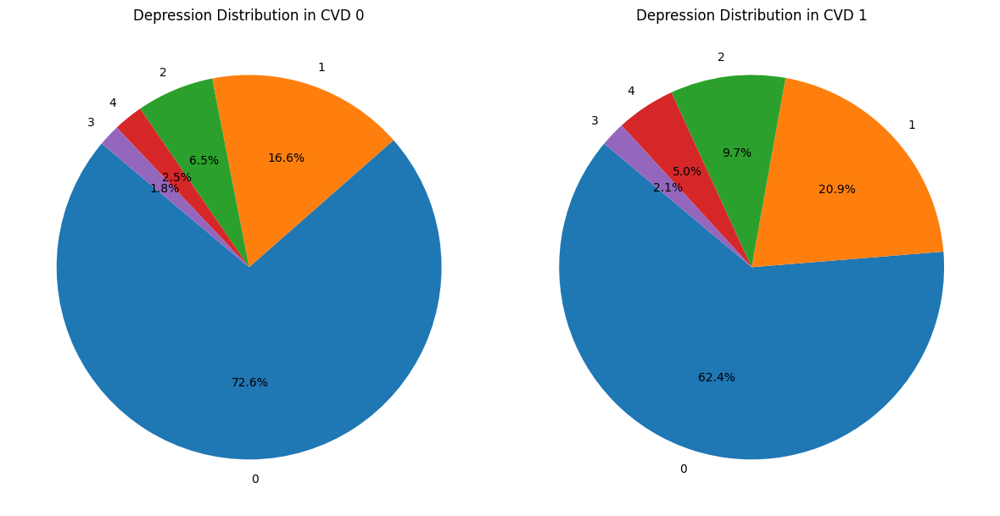

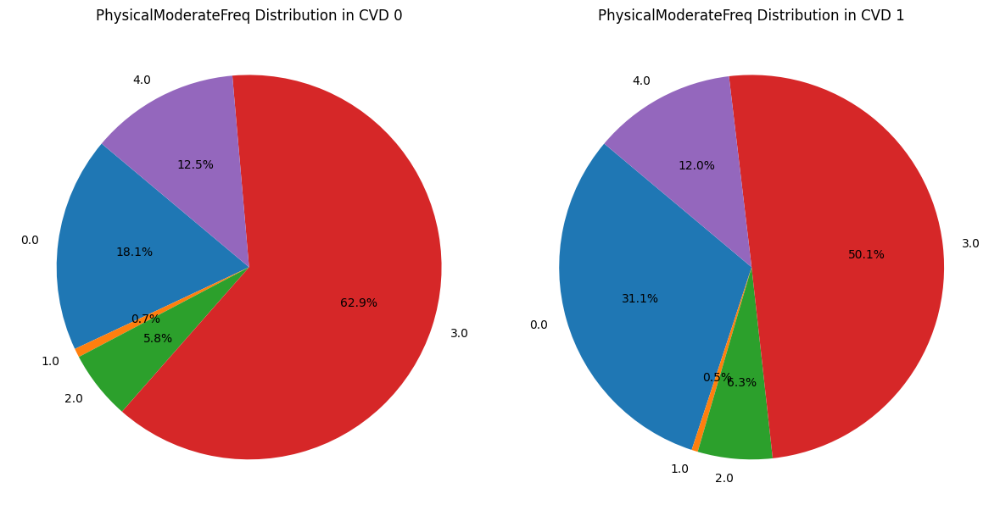

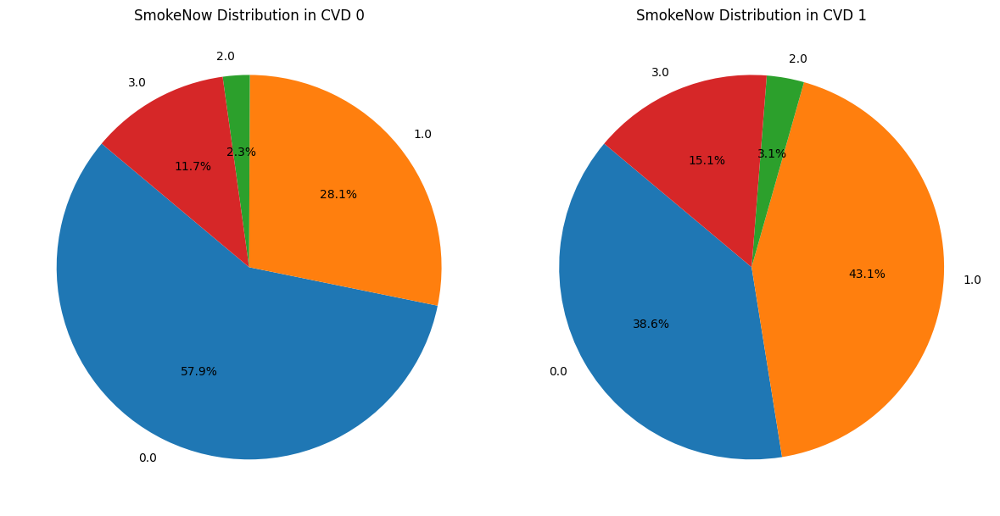

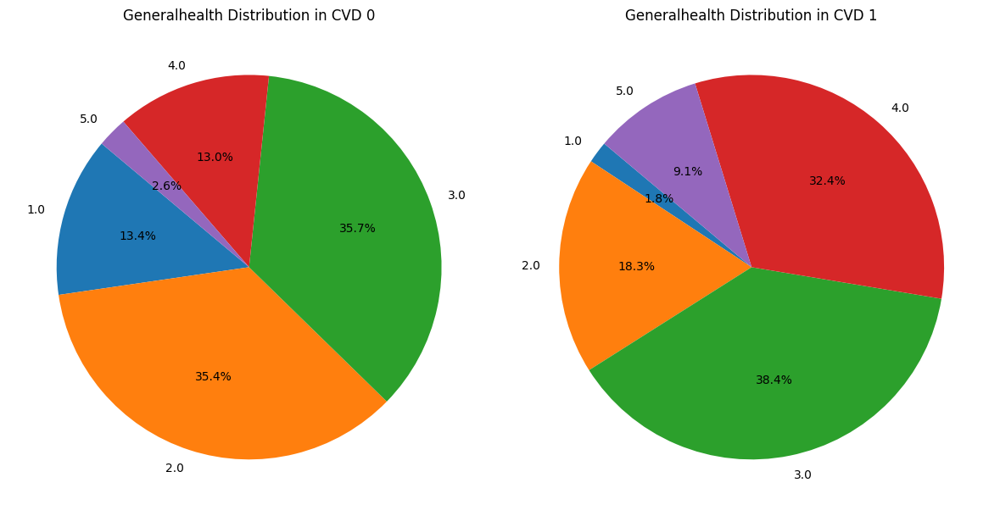

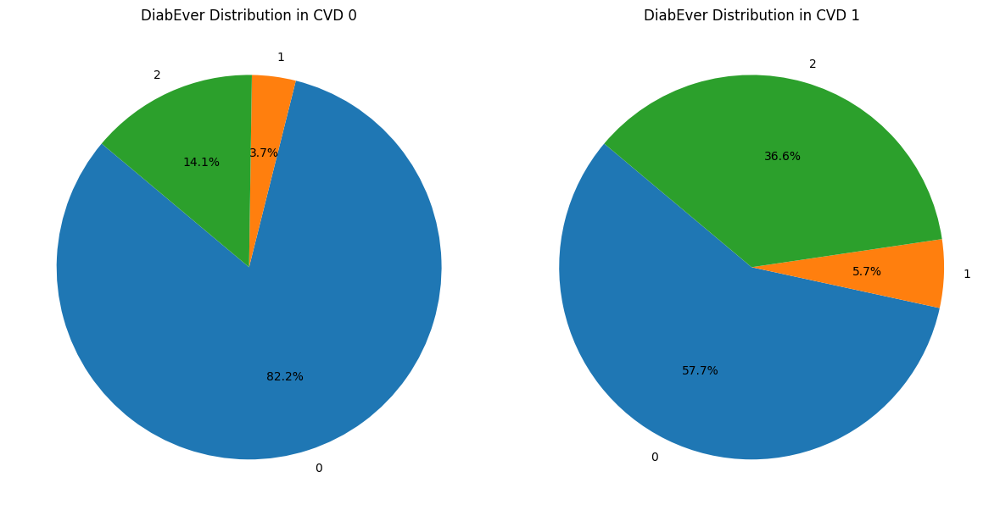

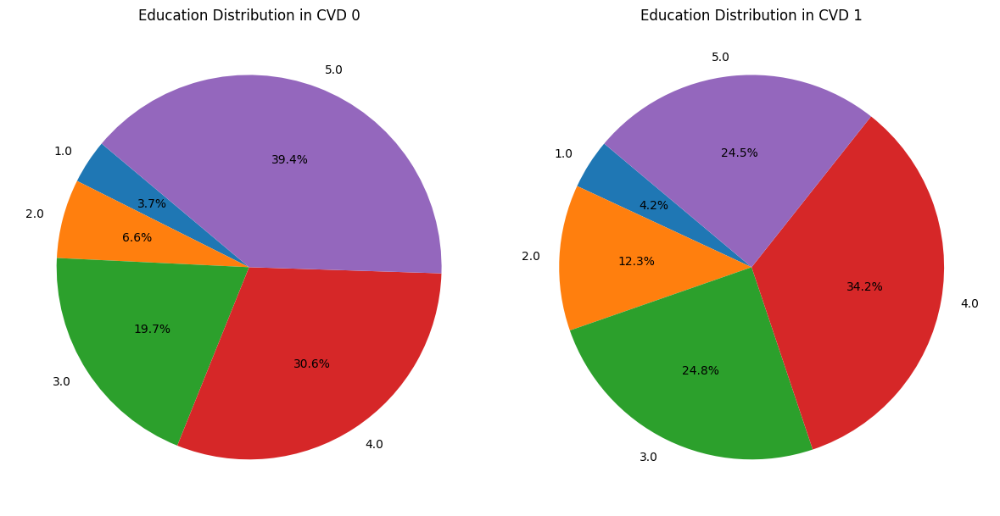

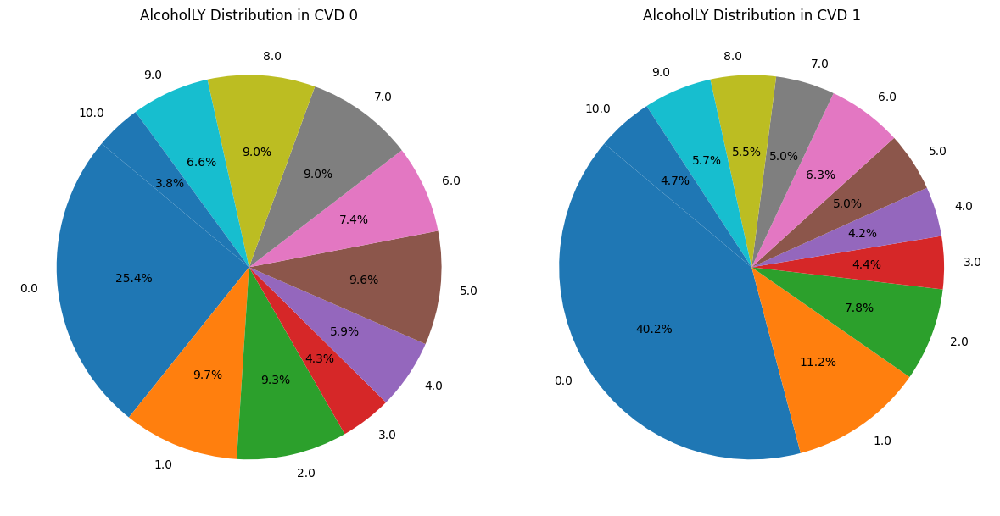

In [45]:
### Pie Chart Visualization of Percentage Distribution for Categorical Variables by CVD Group

# Function to plot pie charts for a given categorical variable
def plot_pie_charts(df, variable, target='CVD'):
    group_counts = df.groupby([target, variable]).size().reset_index(name='Counts')
    pivoted = group_counts.pivot(index=variable, columns=target, values='Counts').fillna(0)
    pivoted = pivoted.div(pivoted.sum(axis=0), axis=1) * 100

    # Prepare data for plotting
    if 0 in pivoted.columns:
        cvd_0_percentages = pivoted[0]
    else:
        cvd_0_percentages = pd.Series([], dtype=float)

    if 1 in pivoted.columns:
        cvd_1_percentages = pivoted[1]
    else:
        cvd_1_percentages = pd.Series([], dtype=float)

    # Plot Pie Chart for CVD 0
    plt.figure(figsize=(12, 6))

    plt.subplot(1, 2, 1)
    plt.pie(
        cvd_0_percentages,
        labels=cvd_0_percentages.index,
        autopct='%1.1f%%',
        startangle=140,
        colors=plt.cm.tab10.colors)

    plt.title(f'{variable} Distribution in CVD 0')

    # Plot Pie Chart for CVD 1
    plt.subplot(1, 2, 2)
    plt.pie(
        cvd_1_percentages,
        labels=cvd_1_percentages.index,
        autopct='%1.1f%%',
        startangle=140,
        colors=plt.cm.tab10.colors)

    plt.title(f'{variable} Distribution in CVD 1')


    plt.tight_layout()
    plt.show()

# List of categorical variables to analyze
categorical_vars = ['Depression','PhysicalModerateFreq', 'SmokeNow', 'Generalhealth',
    'DiabEver', 'Education', 'AlcoholLY']

# Generate pie charts for each categorical variable
for var in categorical_vars:
    plot_pie_charts(df, var, target='CVD')


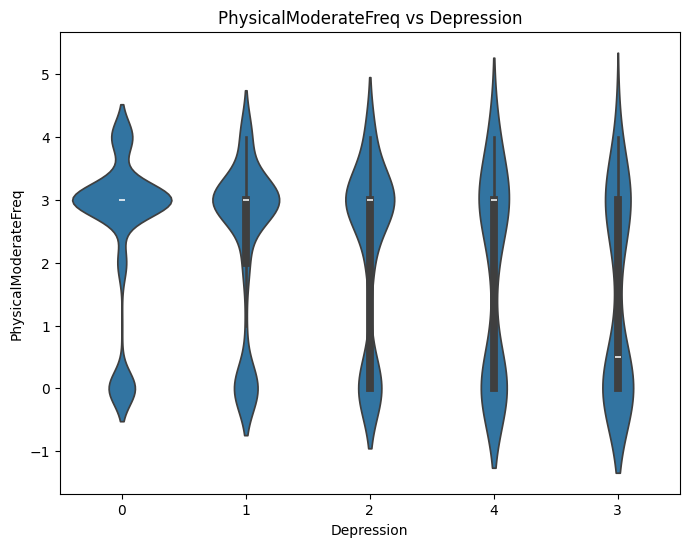

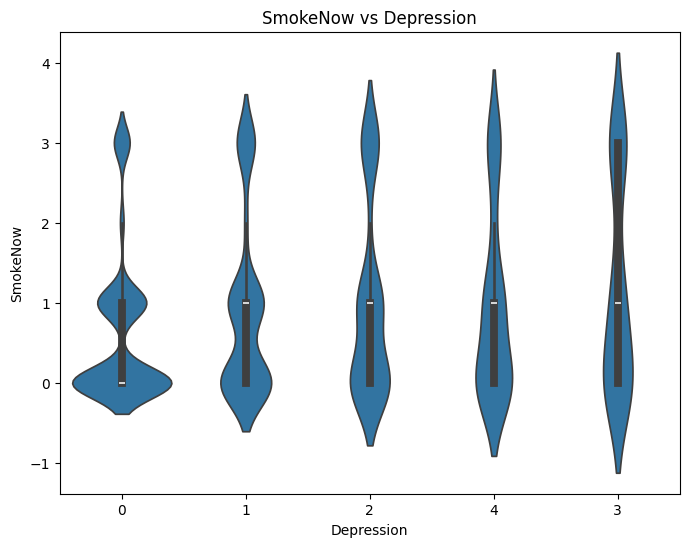

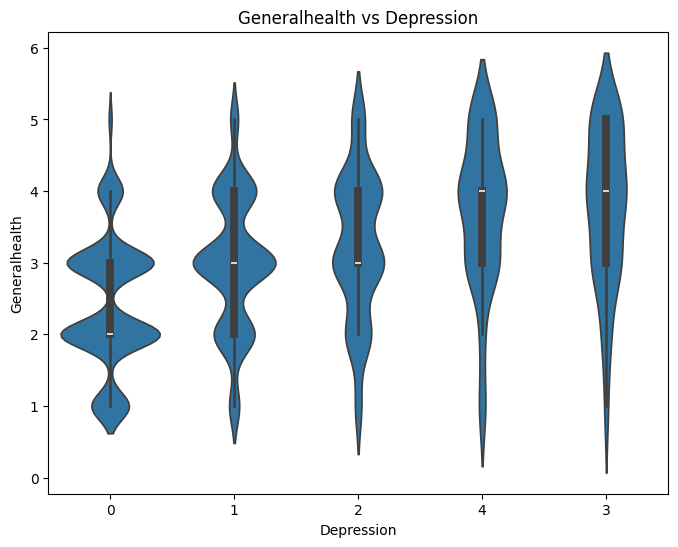

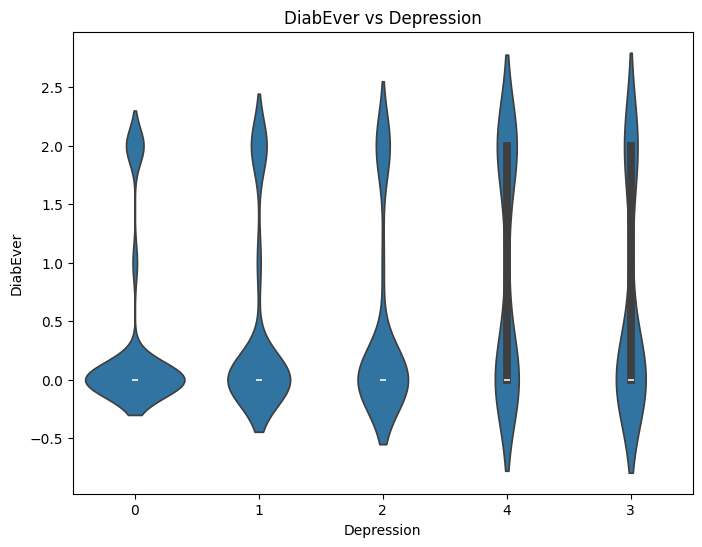

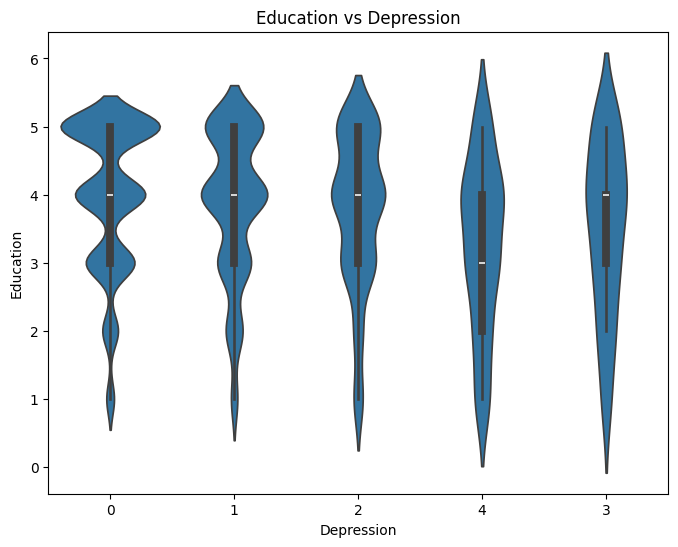

...

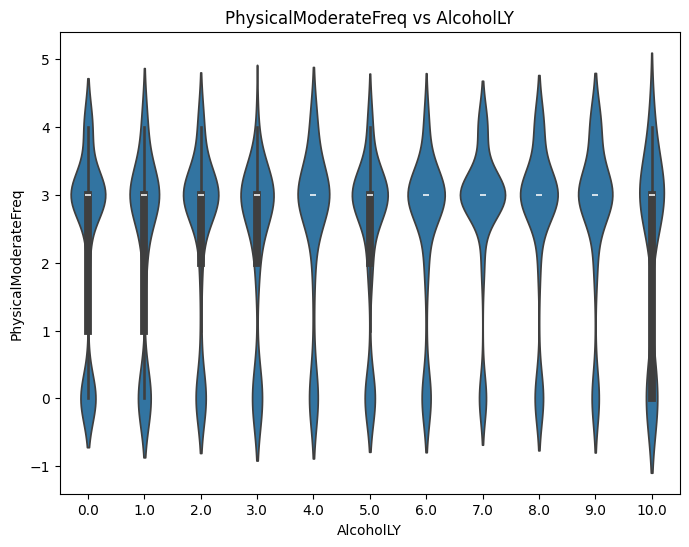

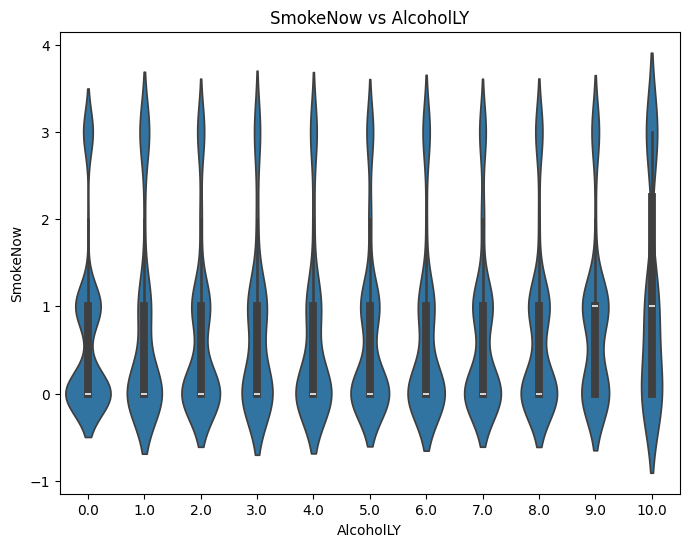

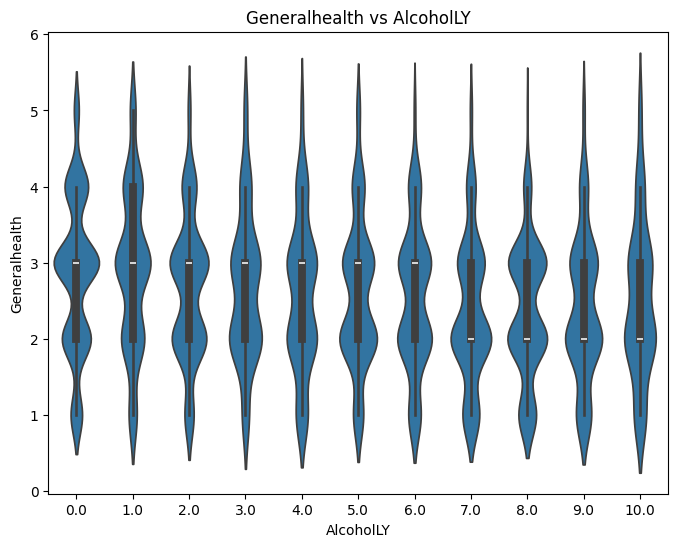

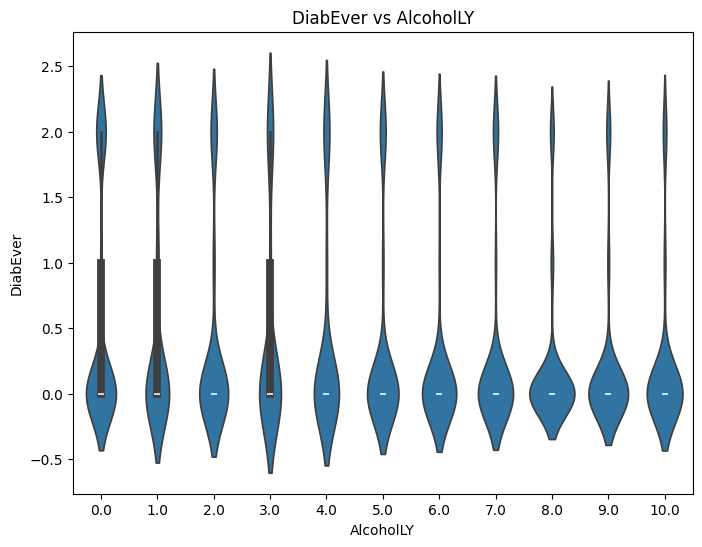

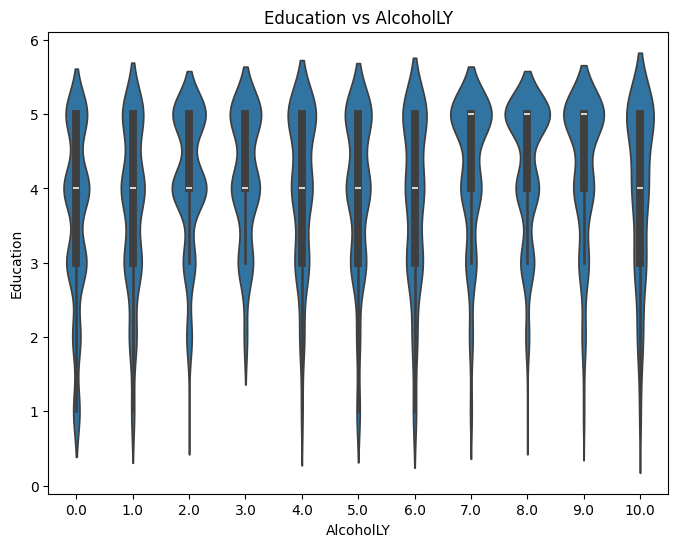

In [46]:
###### Violin Plot for Ordinal <-->  Ordinal Correlations

# List of ordinal variables to plot
ordinal_vars = ['Depression', 'PhysicalModerateFreq', 'SmokeNow', 'Generalhealth', 'DiabEver', 'Education', 'AlcoholLY']

# Violin plot for each combination of ordinal variables
for var1 in ordinal_vars:
    for var2 in ordinal_vars:
        if var1 != var2:
            plt.figure(figsize=(8, 6))
            sns.violinplot(data=df, x=var1, y=var2)
            plt.title(f'{var2} vs {var1}')
            plt.xlabel(var1)
            plt.ylabel(var2)
            plt.show()


In [48]:
!pip install pingouin


In [49]:
import pingouin as pg


In [50]:

# Statistical Analysis Using Kruskal-Wallis H Test and Welch's ANOVA for Non-Normal
# Variables in each group (Equal\Unequal Variance)
kruskal_variables = ['Systolic1', 'Diastolic1', 'Systolic2', 'Systolic3',
                     'BMI', 'Sleep HourWD', 'Pulse1', 'Pulse2', 'Pulse3',
                     'Platelet', 'HDLmg', 'Age']

welch_variables = ['Diastolic2', 'Diastolic3', 'LymphocytePCT', 'Monocyte PCT',
                   'NeutrophilsPCT', 'EosinophilsPCT', 'BasophilsPCT', 'Cholesterol_mg']

# Kruskal-Wallis H Test for Unequal Variances
kruskal_results = []

for variable in kruskal_variables:
    group_cvd0 = df[df['CVD'] == 0][variable]
    group_cvd1 = df[df['CVD'] == 1][variable]


    kruskal_stat, kruskal_p = kruskal(group_cvd0, group_cvd1)
    significant = kruskal_p < 0.05

    # Median comparison to see which group is higher
    if significant:
        median_cvd0 = np.median(group_cvd0)
        median_cvd1 = np.median(group_cvd1)
        higher_group = "CVD = 0" if median_cvd0 > median_cvd1 else "CVD = 1"
    else:
        higher_group = "No significant difference"

    kruskal_results.append({
        "Variable": variable,
        "Kruskal-Wallis_p": kruskal_p,
        "Significant": significant,
        "Higher_Group": higher_group})

# Welch's ANOVA for Equal Variances
welch_results = []

for variable in welch_variables:
    # Perform Welch's ANOVA using pingouin
    welch_anova = pg.welch_anova(dv=variable, between='CVD', data=df)
    p_value = welch_anova['p-unc'][0]
    significant = p_value < 0.05

    # Mean comparison to see which group is higher
    if significant:
        mean_cvd0 = np.mean(df[df['CVD'] == 0][variable])
        mean_cvd1 = np.mean(df[df['CVD'] == 1][variable])
        higher_group = "CVD = 0" if mean_cvd0 > mean_cvd1 else "CVD = 1"
    else:
        higher_group = "No significant difference"

    welch_results.append({
        "Variable": variable,
        "Welch_ANOVA_p": p_value,
        "Significant": significant,
        "Higher_Group": higher_group})



kruskal_results_df = pd.DataFrame(kruskal_results)
welch_results_df = pd.DataFrame(welch_results)


print("Kruskal-Wallis H Test Results (Non-Normal, Unequal Variances):")
print(kruskal_results_df)

print("\nWelch's ANOVA Results (Non-Normal, Equal Variances):")
print(welch_results_df)



Kruskal-Wallis H Test Results (Non-Normal, Unequal Variances):
        Variable  Kruskal-Wallis_p  Significant               Higher_Group
0      Systolic1      9.705742e-01        False  No significant difference
1     Diastolic1      9.664633e-12         True                    CVD = 0
2      Systolic2      6.178385e-01        False  No significant difference
3      Systolic3      5.794456e-01        False  No significant difference
4            BMI      8.150991e-08         True                    CVD = 1
5   Sleep HourWD      1.475031e-04         True                    CVD = 1
6         Pulse1      4.655766e-01        False  No significant difference
7         Pulse2      3.047605e-01        False  No significant difference
8         Pulse3      1.452701e-01        False  No significant difference
9       Platelet      1.344251e-08         True                    CVD = 0
10         HDLmg      1.421686e-12         True                    CVD = 0
11           Age      2.253781e-35   

# **Exploratory Data Analysis (EDA)**

**Comprehensive Correlation Analysis Across Numerical, Ordinal, and Categorical Variables**

In [51]:
# Define your numerical columns
numerical_cols = ['Systolic1', 'Diastolic1', 'Systolic2', 'Diastolic2',
    'Systolic3', 'Diastolic3', 'BMI', 'Sleep HourWD',
     'LymphocytePCT', 'Monocyte PCT', 'Pulse1', 'Pulse2', 'Pulse3',
    'NeutrophilsPCT', 'EosinophilsPCT', 'BasophilsPCT',
    'Platelet', 'Cholesterol_mg']

# Define your binary columns (already provided)
binary_columns = ['DietarySuppsF', 'DigestiveMedsF', 'GumMintsCoughDropsF',
                  'CoffeeTeaCreamOSugarF', 'Aspirin', 'EverBP', 'EverChole',
                  'TakeCholMed', 'EverAsthma', 'EverArthritis',
                  'EverLiverCondition', 'Gender']

# Define your ordinal columns (already provided)
ordinal_cols = ['Depression', 'PhysicalModerateFreq', 'SmokeNow', 'Generalhealth',
                'DiabEver', 'Education', 'AlcoholLY']

# Define your multilevel categorical columns (already provided)
multilevel_categorical_cols = ['Race', 'MaritalSt']


# Required Libraries
import pandas as pd
import numpy as np
from scipy.stats import mannwhitneyu, pointbiserialr, kruskal, spearmanr, f_oneway
import seaborn as sns
import matplotlib.pyplot as plt

# Assuming `df` is your DataFrame

# 1. Numerical vs Binary Categorical (Mann-Whitney U Test and Point-Biserial Correlation)

# Results for Mann-Whitney U Test and Point-Biserial Correlation
for var in binary_columns:
    for num_col in numerical_cols:
        # Mann-Whitney U Test
        group_0 = df[df[var] == 0][num_col]
        group_1 = df[df[var] == 1][num_col]
        stat, p_value_mw = mannwhitneyu(group_0, group_1)

        # Point-Biserial Correlation
        corr, p_value_pb = pointbiserialr(df[num_col], df[var])

        # Display Results
        print(f"Results for {num_col} vs {var}:")
        print(f"Mann-Whitney U Test statistic: {stat:.4f}, p-value: {p_value_mw:.4f}")
        print(f"Point-Biserial Correlation: {corr:.4f}, p-value: {p_value_pb:.4f}")
        if p_value_mw < 0.05:
            print("Distributions are significantly different.")
        if p_value_pb < 0.05:
            print(f"There is a statistically significant correlation between {num_col} and {var}.\n")
        else:
            print(f"No significant correlation between {num_col} and {var}.\n")



for var in ordinal_cols:
    for num_col in numerical_cols:
        corr, p_value_spearman = spearmanr(df[num_col], df[var])
        print(f"Spearman’s Rank Correlation for {num_col} vs {var}:")
        print(f"Correlation: {corr:.4f}, p-value: {p_value_spearman:.4f}")
        if p_value_spearman < 0.05:
            print(f"There is a statistically significant correlation between {num_col} and {var}.\n")
        else:
            print(f"No significant correlation between {num_col} and {var}.\n")

# 3. Numerical vs Multilevel Categorical (Kruskal-Wallis H Test)


for var in multilevel_categorical_cols:
    for num_col in numerical_cols:
        groups = [df[df[var] == category][num_col] for category in df[var].unique()]

        # Kruskal-Wallis H Test
        stat, p_value_kw = kruskal(*groups)

        print(f"Kruskal-Wallis Test for {num_col} vs {var}:")
        print(f"Statistic: {stat:.4f}, p-value: {p_value_kw:.4f}")
        if p_value_kw < 0.05:
            print(f"The distributions of {num_col} differ significantly across categories in {var}.\n")
        else:
            print(f"The distributions of {num_col} do not differ significantly across categories in {var}.\n")

# 4. Numerical vs Multilevel Categorical (Welch's ANOVA for unequal variances)
for var in multilevel_categorical_cols:
    for num_col in numerical_cols:
        groups = [df[df[var] == category][num_col] for category in df[var].unique()]

        # Welch's ANOVA
        stat, p_value_anova = f_oneway(*groups)

        print(f"Welch's ANOVA for {num_col} vs {var}:")
        print(f"Statistic: {stat:.4f}, p-value: {p_value_anova:.4f}")
        if p_value_anova < 0.05:
            print(f"The means of {num_col} differ significantly across categories in {var}.\n")
        else:
            print(f"The means of {num_col} do not differ significantly across categories in {var}.\n")

Results for Systolic1 vs DietarySuppsF:
Mann-Whitney U Test statistic: 225048.0000, p-value: 0.0565
Point-Biserial Correlation: -0.0328, p-value: 0.0578
No significant correlation between Systolic1 and DietarySuppsF.

Results for Diastolic1 vs DietarySuppsF:
Mann-Whitney U Test statistic: 226995.0000, p-value: 0.0366
Point-Biserial Correlation: -0.0389, p-value: 0.0245
Distributions are significantly different.
There is a statistically significant correlation between Diastolic1 and DietarySuppsF.

Results for Systolic2 vs DietarySuppsF:
Mann-Whitney U Test statistic: 228392.5000, p-value: 0.0264
Point-Biserial Correlation: -0.0392, p-value: 0.0232
Distributions are significantly different.
There is a statistically significant correlation between Systolic2 and DietarySuppsF.

Results for Diastolic2 vs DietarySuppsF:
Mann-Whitney U Test statistic: 228122.5000, p-value: 0.0281
Point-Biserial Correlation: -0.0441, p-value: 0.0106
Distributions are significantly different.
There is a statis

In [52]:
# Comprehensive Statistical Testing for Relationships Between Numerical, Binary, Ordinal, and Multilevel Categorical Variables

# 1. Ordinal vs Ordinal (Spearman's Rank Correlation)
for var1 in ordinal_cols:
    for var2 in ordinal_cols:
        if var1 != var2:
            corr, p_value_spearman = spearmanr(df[var1], df[var2])
            print(f"Spearman’s Rank Correlation for {var1} vs {var2}:")
            print(f"Correlation: {corr:.4f}, p-value: {p_value_spearman:.4f}")
            if p_value_spearman < 0.05:
                print(f"There is a statistically significant correlation between {var1} and {var2}.\n")
            else:
                print(f"No significant correlation between {var1} and {var2}.\n")

# 2. Ordinal vs Binary (Mann-Whitney U Test and Point-Biserial Correlation)
for var in ordinal_cols:
    for binary_var in binary_columns:
        # Mann-Whitney U Test
        group_0 = df[df[binary_var] == 0][var]
        group_1 = df[df[binary_var] == 1][var]
        stat, p_value_mw = mannwhitneyu(group_0, group_1)

        # Point-Biserial Correlation
        corr, p_value_pb = pointbiserialr(df[var], df[binary_var])

        print(f"Results for {var} vs {binary_var}:")
        print(f"Mann-Whitney U Test statistic: {stat:.4f}, p-value: {p_value_mw:.4f}")
        print(f"Point-Biserial Correlation: {corr:.4f}, p-value: {p_value_pb:.4f}")
        if p_value_mw < 0.05:
            print("Distributions are significantly different.")
        if p_value_pb < 0.05:
            print(f"There is a statistically significant correlation between {var} and {binary_var}.\n")
        else:
            print(f"No significant correlation between {var} and {binary_var}.\n")

# 3. Ordinal vs Multilevel Categorical (Kruskal-Wallis H Test - Spearman's Rank Correlation)
for var in ordinal_cols:
    for categorical_var in multilevel_categorical_cols:
        groups = [df[df[categorical_var] == category][var] for category in df[categorical_var].unique()]

        # Kruskal-Wallis H Test
        stat, p_value_kw = kruskal(*groups)
        print(f"Kruskal-Wallis Test for {var} vs {categorical_var}:")
        print(f"Statistic: {stat:.4f}, p-value: {p_value_kw:.4f}")
        if p_value_kw < 0.05:
            print(f"The distributions of {var} differ significantly across categories in {categorical_var}.\n")
        else:
            print(f"The distributions of {var} do not differ significantly across categories in {categorical_var}.\n")

# 4. Binary vs Binary (Chi-Square Test - Point-Biserial Correlation)
for var1 in binary_columns:
    for var2 in binary_columns:
        if var1 != var2:
            # Chi-Square Test of Independence
            contingency_table = pd.crosstab(df[var1], df[var2])
            chi2_stat, p_value_chi2, dof, expected = chi2_contingency(contingency_table)
            print(f"Chi-Square Test for {var1} vs {var2}:")
            print(f"Chi2 Stat: {chi2_stat:.4f}, p-value: {p_value_chi2:.4f}")
            if p_value_chi2 < 0.05:
                print(f"There is a statistically significant association between {var1} and {var2}.\n")
            else:
                print(f"No significant association between {var1} and {var2}.\n")

# 5. Binary vs Multilevel Categorical (Chi-Square Test)
for var1 in binary_columns:
    for var2 in multilevel_categorical_cols:
        contingency_table = pd.crosstab(df[var1], df[var2])
        chi2_stat, p_value_chi2, dof, expected = chi2_contingency(contingency_table)
        print(f"Chi-Square Test for {var1} vs {var2}:")
        print(f"Chi2 Stat: {chi2_stat:.4f}, p-value: {p_value_chi2:.4f}")
        if p_value_chi2 < 0.05:
            print(f"There is a statistically significant association between {var1} and {var2}.\n")
        else:
            print(f"No significant association between {var1} and {var2}.\n")

# 6. Multilevel Categorical vs Multilevel Categorical (Chi-Square Test)
for var1 in multilevel_categorical_cols:
    for var2 in multilevel_categorical_cols:
        if var1 != var2:
            contingency_table = pd.crosstab(df[var1], df[var2])
            chi2_stat, p_value_chi2, dof, expected = chi2_contingency(contingency_table)
            print(f"Chi-Square Test for {var1} vs {var2}:")
            print(f"Chi2 Stat: {chi2_stat:.4f}, p-value: {p_value_chi2:.4f}")
            if p_value_chi2 < 0.05:
                print(f"There is a statistically significant association between {var1} and {var2}.\n")
            else:
                print(f"No significant association between {var1} and {var2}.\n")


Spearman’s Rank Correlation for Depression vs PhysicalModerateFreq:
Correlation: -0.1246, p-value: 0.0000
There is a statistically significant correlation between Depression and PhysicalModerateFreq.

Spearman’s Rank Correlation for Depression vs SmokeNow:
Correlation: 0.1321, p-value: 0.0000
There is a statistically significant correlation between Depression and SmokeNow.

Spearman’s Rank Correlation for Depression vs Generalhealth:
Correlation: 0.3475, p-value: 0.0000
There is a statistically significant correlation between Depression and Generalhealth.

Spearman’s Rank Correlation for Depression vs DiabEver:
Correlation: 0.1122, p-value: 0.0000
There is a statistically significant correlation between Depression and DiabEver.

Spearman’s Rank Correlation for Depression vs Education:
Correlation: -0.1112, p-value: 0.0000
There is a statistically significant correlation between Depression and Education.

Spearman’s Rank Correlation for Depression vs AlcoholLY:
Correlation: -0.0768, p-v

In [53]:
# Mann-Whitney U Test and Point-Biserial Correlation Analysis for CVD-Related Variables

results = []

variables = ['Age', 'Cholesterol_mg', 'HDLmg', 'BMI', 'Platelet', 'LymphocytePCT',
             'NeutrophilsPCT', 'Sleep HourWD', 'Diastolic1', 'Diastolic2', 'Diastolic3']

for var in variables:
    # Mann-Whitney U test
    group_cvd0 = df[df['CVD'] == 0][var]
    group_cvd1 = df[df['CVD'] == 1][var]
    u_stat, p_val_mannwhitney = mannwhitneyu(group_cvd0, group_cvd1, alternative='two-sided')

    # Point-Biserial correlation
    correlation, p_val_pointbiserial = pointbiserialr(df['CVD'], df[var])


    results.append({
        'Variable': var,
        'Mann-Whitney U Statistic': u_stat,
        'Mann-Whitney p-value': p_val_mannwhitney,
        'Point-Biserial Correlation': correlation,
        'Point-Biserial p-value': p_val_pointbiserial})


# Convert results to a DataFrame
results_df = pd.DataFrame(results)


results_df['Mann-Whitney Significant'] = results_df['Mann-Whitney p-value'] < 0.05
results_df['Point-Biserial Significant'] = results_df['Point-Biserial p-value'] < 0.05

print(results_df)

          Variable  Mann-Whitney U Statistic  Mann-Whitney p-value  \
0              Age                  347179.0          2.254572e-35   
1   Cholesterol_mg                  832609.5          7.551709e-50   
2            HDLmg                  694291.0          1.421974e-12   
3              BMI                  472633.5          8.152258e-08   
4         Platelet                  669367.0          1.344472e-08   
5    LymphocytePCT                  683631.0          9.110885e-11   
6   NeutrophilsPCT                  484841.5          2.891702e-06   
7     Sleep HourWD                  501167.0          1.475200e-04   
8       Diastolic1                  689466.0          9.666520e-12   
9       Diastolic2                  710213.5          1.503963e-15   
10      Diastolic3                  698259.0          2.768947e-13   

    Point-Biserial Correlation  Point-Biserial p-value  \
0                     0.213414            8.273778e-36   
1                    -0.235839            1

In [54]:
### Chi-Square Test for Association Between CVD and Binary Variables

binary_columns = ['DietarySuppsF', 'DigestiveMedsF', 'GumMintsCoughDropsF',
                  'CoffeeTeaCreamOSugarF', 'Aspirin', 'EverBP', 'EverChole',
                  'TakeCholMed', 'EverAsthma', 'EverArthritis', 'EverThyroid ',
                  'EverLiverCondition', 'Gender']

# Chi-square test
results = []
for col in binary_columns:
    contingency_table = pd.crosstab(df['CVD'], df[col])
    chi2, p, dof, expected = chi2_contingency(contingency_table)
    results.append({
        'Variable': col,
        'Chi2 Stat': chi2,
        'p-value': p})


chi2_results = pd.DataFrame(results)
print(chi2_results)


                 Variable   Chi2 Stat       p-value
0           DietarySuppsF    2.890679  8.909339e-02
1          DigestiveMedsF    0.000000  1.000000e+00
2     GumMintsCoughDropsF    0.884678  3.469237e-01
3   CoffeeTeaCreamOSugarF    1.216793  2.699909e-01
4                 Aspirin  400.734783  3.810500e-89
5                  EverBP  157.437580  4.107085e-36
6               EverChole   88.013566  6.500709e-21
7             TakeCholMed  270.241154  1.005428e-60
8              EverAsthma    5.836637  1.569580e-02
9           EverArthritis   46.351036  9.885521e-12
10           EverThyroid     6.550599  1.048488e-02
11     EverLiverCondition   11.710783  6.213897e-04
12                 Gender   28.097332  1.153648e-07


In [55]:
#####Cramér's V Calculation with Chi-Square Test for Binary Variables and CVD
def cramers_v(chi2_stat, n, min_dim):
    return np.sqrt(chi2_stat / (n * (min_dim - 1)))

binary_columns = ['DietarySuppsF', 'DigestiveMedsF', 'GumMintsCoughDropsF',
                  'CoffeeTeaCreamOSugarF', 'Aspirin', 'EverBP', 'EverChole',
                  'TakeCholMed', 'EverAsthma', 'EverArthritis', 'EverThyroid ',
                  'EverLiverCondition', 'Gender']

# Calculate Cramér's V for each binary variable with respect to CVD
cramers_v_results = []

for col in binary_columns:
    contingency_table = pd.crosstab(df['CVD'], df[col])
    chi2_stat, p, dof, expected = chi2_contingency(contingency_table)
    n = df.shape[0]
    min_dim = min(contingency_table.shape)

    cramer_v_value = cramers_v(chi2_stat, n, min_dim)

    cramers_v_results.append({'Variable': col, "Cramér's V": cramer_v_value})

cramers_v_df = pd.DataFrame(cramers_v_results)
print(cramers_v_df)


                 Variable  Cramér's V
0           DietarySuppsF    0.029375
1          DigestiveMedsF    0.000000
2     GumMintsCoughDropsF    0.016251
3   CoffeeTeaCreamOSugarF    0.019058
4                 Aspirin    0.345865
5                  EverBP    0.216786
6               EverChole    0.162089
7             TakeCholMed    0.284023
8              EverAsthma    0.041741
9           EverArthritis    0.117627
10           EverThyroid     0.044220
11     EverLiverCondition    0.059125
12                 Gender    0.091582


In [56]:
#### Logistic Regression Analysis of Binary Variables for Association with CVD

binary_columns = [
    'DietarySuppsF', 'DigestiveMedsF', 'GumMintsCoughDropsF',
    'CoffeeTeaCreamOSugarF', 'Aspirin', 'EverBP', 'EverChole',
    'TakeCholMed', 'EverAsthma', 'EverArthritis', 'EverThyroid ',
    'EverLiverCondition', 'Gender']

# List to store p-values for each variable
log_reg_pvalues = []

for col in binary_columns:
    X = df[[col]]
    X = sm.add_constant(X)
    y = df['CVD']

    # Fit the logistic regression model
    model = sm.Logit(y, X)
    result = model.fit()

    # Get p-value for the coefficient
    p_value = result.pvalues[col]


    log_reg_pvalues.append({
        'Variable': col,
        'P-value': p_value})

# Convert results to DataFrame
log_reg_pvalues_df = pd.DataFrame(log_reg_pvalues)

print(log_reg_pvalues_df)



Optimization terminated successfully.
         Current function value: 0.355015
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.355466
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.355278
         Iterations 6
         Current function value: 0.354852
         Iterations: 35
Optimization terminated successfully.
         Current function value: 0.296891
         Iterations 7
Optimization terminated successfully.
         Current function value: 0.331248
         Iterations 7
Optimization terminated successfully.
         Current function value: 0.341529
         Iterations 7


/usr/local/lib/python3.10/dist-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


Optimization terminated successfully.
         Current function value: 0.315604
         Iterations 7
Optimization terminated successfully.
         Current function value: 0.354596
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.348505
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.354495
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.353852
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.351207
         Iterations 6
                 Variable       P-value
0           DietarySuppsF  6.755949e-02
1          DigestiveMedsF  8.591393e-01
2     GumMintsCoughDropsF  2.797268e-01
3   CoffeeTeaCreamOSugarF  9.999859e-01
4                 Aspirin  1.035723e-65
5                  EverBP  2.966503e-32
6               EverChole  1.107047e-19
7             TakeCholMed  3.429534e-50
8              EverAsthma  1

In [57]:
##### Comparison of Summary Statistics (Median and Mean) for Variables by CVD Group
variables_to_test = ['Age', 'Cholesterol_mg', 'HDLmg', 'BMI', 'Platelet', 'LymphocytePCT',
             'NeutrophilsPCT', 'Sleep HourWD', 'Diastolic1', 'Diastolic2', 'Diastolic3']

# Calculate medians and means for each group
summary_stats = []

for variable in variables_to_test:
    median_cvd0 = df[df['CVD'] == 0][variable].median()
    median_cvd1 = df[df['CVD'] == 1][variable].median()
    mean_cvd0 = df[df['CVD'] == 0][variable].mean()
    mean_cvd1 = df[df['CVD'] == 1][variable].mean()

    summary_stats.append({
        "Variable": variable,
        "Median_CVD_0": median_cvd0,
        "Median_CVD_1": median_cvd1,
        "Mean_CVD_0": mean_cvd0,
        "Mean_CVD_1": mean_cvd1,
        "Difference (Median)": median_cvd1 - median_cvd0,
        "Difference (Mean)": mean_cvd1 - mean_cvd0})


summary_stats_df = pd.DataFrame(summary_stats)

print(summary_stats_df)

          Variable  Median_CVD_0  Median_CVD_1  Mean_CVD_0  Mean_CVD_1  \
0              Age          62.0          69.0   60.760701   68.214099   
1   Cholesterol_mg         192.0         155.0  195.110549  162.425587   
2            HDLmg          54.0          48.0   56.065723   50.302872   
3              BMI          28.6          30.2   29.657263   31.889556   
4         Platelet         246.0         230.0  252.748568  235.704961   
5    LymphocytePCT          29.2          26.2   29.636636   26.695039   
6   NeutrophilsPCT          59.1          61.5   58.771891   61.135248   
7     Sleep HourWD           8.0           8.0    7.618807    7.885117   
8       Diastolic1          76.0          72.0   76.304685   72.117493   
9       Diastolic2          75.0          70.0   75.655207   70.806789   
10      Diastolic3          75.0          70.0   75.136502   70.647520   

    Difference (Median)  Difference (Mean)  
0                   7.0           7.453398  
1                 -37

In [58]:
##### Percentage of CVD=1 Individuals Using Cholesterol Medication (TakeCholMed)
cvd_1_group = df[df['CVD'] == 1]

take_chol_med_count = cvd_1_group[cvd_1_group['TakeCholMed'] == 1].shape[0]
total_cvd_1_count = cvd_1_group.shape[0]

percentage_take_chol_med = (take_chol_med_count / total_cvd_1_count) * 100

print(f"Percentage of CVD=1 individuals with TakeCholMed=1: {percentage_take_chol_med:.2f}%")


Percentage of CVD=1 individuals with TakeCholMed=1: 76.50%


In [59]:
####### Percentage of CVD=1 Individuals with a History of Cholesterol (EverChole)
cvd_1_group = df[df['CVD'] == 1]

take_chol_med_count = cvd_1_group[cvd_1_group['EverChole'] == 1].shape[0]
total_cvd_1_count = cvd_1_group.shape[0]

percentage_take_chol_med = (take_chol_med_count / total_cvd_1_count) * 100

print(f"Percentage of CVD=1 individuals with EverChole=1: {percentage_take_chol_med:.2f}%")


Percentage of CVD=1 individuals with EverChole=1: 75.20%


In [60]:
### Percentage of CVD=1 Individuals Using Blood Pressure Medication (TakeBPMed)

# Filter for CVD=1
cvd_1_group = df[df['CVD'] == 1]

# Calculate the percentage where TakeBPMed = 1
take_bp_med_count = cvd_1_group[cvd_1_group['TakeBPMed'] == 1].shape[0]
total_cvd_1_count = cvd_1_group.shape[0]

percentage_take_bp_med = (take_bp_med_count / total_cvd_1_count) * 100

print(f"Percentage of CVD=1 individuals with TakeBPMed=1: {percentage_take_bp_med:.2f}%")


Percentage of CVD=1 individuals with TakeBPMed=1: 69.97%


In [61]:

# Independent T-test: Comparing Cholesterol Levels Between Gender Groups
group_0 = df[df['Gender'] == 0]['Cholesterol_mg']
group_1 = df[df['Gender'] == 1]['Cholesterol_mg']

# Perform t-test
t_stat, p_value = stats.ttest_ind(group_0, group_1)


print(f"T-statistic: {t_stat}")
print(f"P-value: {p_value}")

if p_value < 0.05:
    print("There is a significant difference between the two groups.")
else:
    print("There is no significant difference between the two groups.")


T-statistic: 10.22618126184614
P-value: 3.420736659655697e-24
There is a significant difference between the two groups.


<ipython-input-62-d500b3351dd0>:2: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x='Gender', y='Cholesterol_mg', data=df, palette='Set2')


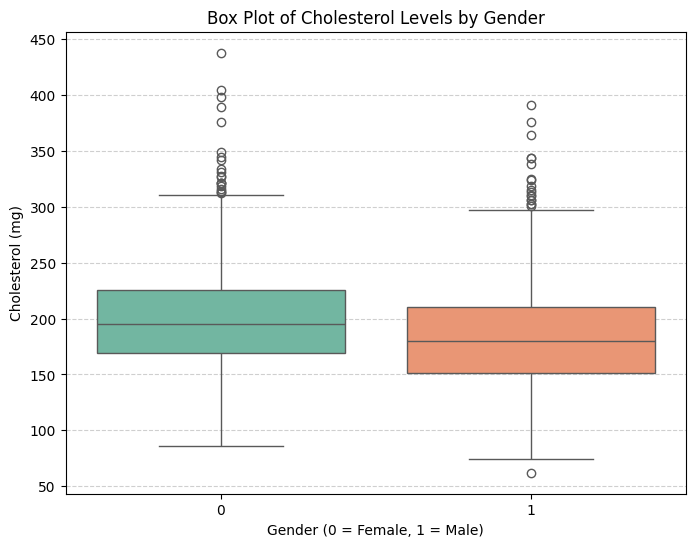

In [62]:
plt.figure(figsize=(8, 6))
sns.boxplot(x='Gender', y='Cholesterol_mg', data=df, palette='Set2')


plt.title('Box Plot of Cholesterol Levels by Gender')
plt.xlabel('Gender (0 = Female, 1 = Male)')
plt.ylabel('Cholesterol (mg)')
plt.grid(axis='y', linestyle='--', alpha=0.6)

plt.show()

In [63]:
# Count and percentage of CVD value 1 and 0
count_1 = (df['CVD'] == 1).sum()
count_0 = (df['CVD'] == 0).sum()

percentage_1 = (df['CVD'] == 1).mean() * 100
percentage_0 = (df['CVD'] == 0).mean() * 100


print(f"Count of CVD value 1: {count_1}")
print(f"Percentage of CVD value 1: {percentage_1:.2f}%")
print(f"Count of CVD value 0: {count_0}")
print(f"Percentage of CVD value 0: {percentage_0:.2f}%")


Count of CVD value 1: 383
Percentage of CVD value 1: 11.43%
Count of CVD value 0: 2967
Percentage of CVD value 0: 88.57%


In [64]:
print(df.columns.tolist())

['AlcoholLY', 'EverAsthma', 'EverArthritis', 'EverThyroid ', 'EverLiverCondition', 'Gender', 'Age', 'Race', 'Education', 'MaritalSt', 'Systolic1', 'Diastolic1', 'Systolic2', 'Diastolic2', 'Systolic3', 'Diastolic3', 'Pulse1', 'Pulse2', 'Pulse3', 'BMDSTATS', 'BMI', 'EverBP', 'TakeBPMed', 'EverChole', 'TakeCholMed', 'DiabEver', 'Generalhealth', 'Aspirin', 'Sleep HourWD', 'SmokeNow', 'LymphocytePCT', 'Monocyte PCT', 'NeutrophilsPCT', 'EosinophilsPCT', 'BasophilsPCT', 'Platelet', 'CoffeeTeaCreamOSugarF', 'GumMintsCoughDropsF', 'DigestiveMedsF', 'DietarySuppsF', 'HDLmg', 'Cholesterol_mg', 'PhysicalModerateFreq', 'Depression', 'CVD', 'Race_Original', 'Race_Mapped', 'MaritalStatus']


# **Feature Selection and Data Preprocessing**

In [65]:
###############f_classif

numerical_cols = ['Systolic1', 'Diastolic1', 'Systolic2', 'Diastolic2',
                  'Systolic3', 'Diastolic3', 'BMI', 'Sleep HourWD',
                  'LymphocytePCT', 'Monocyte PCT', 'Pulse1', 'Pulse2', 'Pulse3',
                  'NeutrophilsPCT', 'EosinophilsPCT', 'BasophilsPCT',
                  'Platelet', 'Cholesterol_mg']

binary_columns = ['DietarySuppsF', 'DigestiveMedsF', 'GumMintsCoughDropsF',
                  'CoffeeTeaCreamOSugarF', 'Aspirin', 'EverBP', 'EverChole',
                  'TakeCholMed', 'EverAsthma', 'EverArthritis',
                  'EverLiverCondition', 'Gender']

ordinal_cols = ['Depression', 'PhysicalModerateFreq', 'SmokeNow', 'Generalhealth',
                'DiabEver', 'Education', 'AlcoholLY']

multilevel_categorical_cols = ['Race', 'MaritalSt']

# Target variable
target = 'CVD'

# Apply LabelEncoder for categorical features (including binary, ordinal, and multilevel)
encoder = LabelEncoder()

# Encoding categorical, binary, ordinal, and multilevel features
for col in binary_columns + ordinal_cols + multilevel_categorical_cols:
    df[col] = encoder.fit_transform(df[col])

df['Depression'] = pd.Categorical(df['Depression'], categories=[0, 1, 2, 3, 4], ordered=True)
df['PhysicalModerateFreq'] = pd.Categorical(df['PhysicalModerateFreq'], ordered=True)
df['SmokeNow'] = pd.Categorical(df['SmokeNow'], ordered=True)
df['Generalhealth'] = pd.Categorical(df['Generalhealth'], ordered=True)
df['DiabEver'] = pd.Categorical(df['DiabEver'], ordered=True)
df['Education'] = pd.Categorical(df['Education'], ordered=True)
df['AlcoholLY'] = pd.Categorical(df['AlcoholLY'], ordered=True)

# Separate features and target variable
X = df[numerical_cols + binary_columns + ordinal_cols + multilevel_categorical_cols]
y = df[target]

# Separate numerical features for mutual_info
X_numerical = df[numerical_cols]

# Separate categorical features for f_classif
X_categorical = df[binary_columns + ordinal_cols + multilevel_categorical_cols]

# Apply f_classif for categorical features
f_cat_values, p_cat_values = f_classif(X_categorical, y)



result_cat_df = pd.DataFrame({
    'Feature': binary_columns + ordinal_cols + multilevel_categorical_cols,
    'F-Value': f_cat_values,
    'P-Value': p_cat_values})


print("Categorical/Binary/Ordinal/Multilevel Features (f_classif):")
print(result_cat_df)

significant_cat_features = result_cat_df[result_cat_df['P-Value'] < 0.05]
print("\nStatistically significant categorical/binary/ordinal/multilevel features (p-value < 0.05):")
print(significant_cat_features)



Categorical/Binary/Ordinal/Multilevel Features (f_classif):
                  Feature     F-Value       P-Value
0           DietarySuppsF    3.395666  6.545631e-02
1          DigestiveMedsF    0.031489  8.591651e-01
2     GumMintsCoughDropsF    1.180523  2.773277e-01
3   CoffeeTeaCreamOSugarF    2.205801  1.375866e-01
4                 Aspirin  457.848203  2.591380e-95
5                  EverBP  166.613490  3.096127e-37
6               EverChole   91.413016  2.181228e-21
7             TakeCholMed  295.958098  1.259638e-63
8              EverAsthma    6.201513  1.281225e-02
9           EverArthritis   47.742931  5.792250e-12
10     EverLiverCondition   12.503940  4.115997e-04
11                 Gender   28.908719  8.107034e-08
12             Depression   18.596991  1.661348e-05
13   PhysicalModerateFreq   31.552454  2.099791e-08
14               SmokeNow   25.494901  4.672413e-07
15          Generalhealth  195.383814  3.399119e-43
16               DiabEver  136.954347  4.921759e-31
17  

In [66]:
# Apply mutual_info_regression for continuous features

mutual_info_values = mutual_info_regression(X_numerical, y)


result_mutual_info_df = pd.DataFrame({
    'Feature': numerical_cols,
    'Mutual Information': mutual_info_values})


print("Continuous Features (Mutual Information):")
print(result_mutual_info_df)

significant_mutual_info_features = result_mutual_info_df.sort_values(by='Mutual Information', ascending=False)
print("\nSignificant continuous features based on mutual information:")
print(significant_mutual_info_features)


Continuous Features (Mutual Information):
           Feature  Mutual Information
0        Systolic1            0.001574
1       Diastolic1            0.019206
2        Systolic2            0.003150
3       Diastolic2            0.020316
4        Systolic3            0.000000
5       Diastolic3            0.010642
6              BMI            0.000000
7     Sleep HourWD            0.000000
8    LymphocytePCT            0.000000
9     Monocyte PCT            0.003159
10          Pulse1            0.012582
11          Pulse2            0.016889
12          Pulse3            0.000000
13  NeutrophilsPCT            0.001657
14  EosinophilsPCT            0.022923
15    BasophilsPCT            0.000000
16        Platelet            0.005896
17  Cholesterol_mg            0.037491

Significant continuous features based on mutual information:
           Feature  Mutual Information
17  Cholesterol_mg            0.037491
14  EosinophilsPCT            0.022923
3       Diastolic2            0.020316

In [67]:
# Calculate Spearman's correlation and p-values
spearman_results = [spearmanr(df[col], y) for col in numerical_cols]

# Extract correlation coefficients and p-values
spearman_corrs, spearman_pvals = zip(*spearman_results)


result_spearman_df = pd.DataFrame({
    'Feature': numerical_cols,
    'Spearman Correlation': spearman_corrs,
    'P-Value': spearman_pvals})



print("\nContinuous Features (Spearman's Correlation):")
print(result_spearman_df)


significant_spearman_features = result_spearman_df[result_spearman_df['P-Value'] < 0.05]
print("\nStatistically significant continuous features (p-value < 0.05):")
print(significant_spearman_features)



Continuous Features (Spearman's Correlation):
           Feature  Spearman Correlation       P-Value
0        Systolic1             -0.000637  9.705808e-01
1       Diastolic1             -0.117701  8.278114e-12
2        Systolic2             -0.008621  6.179107e-01
3       Diastolic2             -0.137836  1.118213e-15
4        Systolic3             -0.009576  5.795219e-01
5       Diastolic3             -0.126234  2.251870e-13
6              BMI              0.092685  7.695601e-08
7     Sleep HourWD              0.065581  1.455889e-04
8    LymphocytePCT             -0.111992  8.029529e-11
9     Monocyte PCT              0.058171  7.557515e-04
10          Pulse1             -0.012609  4.656588e-01
11          Pulse2             -0.017734  3.048308e-01
12          Pulse3             -0.025167  1.452965e-01
13  NeutrophilsPCT              0.080842  2.799385e-06
14  EosinophilsPCT              0.030825  7.444398e-02
15    BasophilsPCT             -0.006848  6.919366e-01
16        Platelet

In [68]:
# List of features to keep
features_to_keep = [
    'Aspirin', 'EverBP', 'EverChole', 'TakeCholMed', 'EverAsthma', 'EverArthritis',
    'EverLiverCondition', 'Gender', 'Depression', 'PhysicalModerateFreq', 'SmokeNow',
    'Generalhealth', 'DiabEver', 'Education', 'AlcoholLY',

    'Diastolic1', 'Diastolic2', 'Diastolic3', 'BMI', 'Sleep HourWD', 'LymphocytePCT',
    'Monocyte PCT', 'NeutrophilsPCT', 'EosinophilsPCT', 'CVD']

df = df[features_to_keep]
print(df.head())

   Aspirin  EverBP  EverChole  TakeCholMed  EverAsthma  EverArthritis  \
1        0       1          0            0           0              0   
2        1       0          1            1           0              0   
3        1       1          1            0           0              0   
5        1       1          0            0           0              1   
6        0       0          0            0           0              0   

   EverLiverCondition  Gender Depression PhysicalModerateFreq  ... Diastolic1  \
1                   0       1          0                    3  ...       84.0   
2                   0       0          0                    3  ...       79.0   
3                   0       0          0                    0  ...       76.0   
5                   0       0          0                    0  ...       76.0   
6                   0       1          0                    3  ...       69.0   

  Diastolic2 Diastolic3   BMI Sleep HourWD  LymphocytePCT  Monocyte PCT  \

In [69]:
# Check for NaN values in the entire dataset
print("NaN values in the dataset:")
print(df.isnull().sum())

NaN values in the dataset:
Aspirin                 0
EverBP                  0
EverChole               0
TakeCholMed             0
EverAsthma              0
EverArthritis           0
EverLiverCondition      0
Gender                  0
Depression              0
PhysicalModerateFreq    0
SmokeNow                0
Generalhealth           0
DiabEver                0
Education               0
AlcoholLY               0
Diastolic1              0
Diastolic2              0
Diastolic3              0
BMI                     0
Sleep HourWD            0
LymphocytePCT           0
Monocyte PCT            0
NeutrophilsPCT          0
EosinophilsPCT          0
CVD                     0
dtype: int64


In [70]:
# List of ordinal columns
ordinal_columns = ['Depression', 'PhysicalModerateFreq', 'SmokeNow',
                   'Generalhealth', 'DiabEver', 'Education', 'AlcoholLY']

# Define the mappings for ordinal columns
depression_mapping = {0: 0, 1: 1, 2: 2, 3: 3, 4: 4}
diabever_mapping = {0: 0, 1: 1, 2: 2}
alcoholly_mapping = {i: i for i in range(11)}
generalhealth_mapping = {0:0, 1: 1, 2: 2, 3: 3, 4: 4}
physicalmoderatefreq_mapping = {0: 0, 1: 1, 2: 2, 3: 3, 4: 4}
education_mapping = {0:0, 1: 1, 2: 2, 3: 3, 4: 4}
smoke_mapping = {0: 0, 1: 1, 2: 2, 3: 3}

# Apply mappings for each ordinal column
for col in ordinal_columns:
    if col == 'Depression':
        df['Depression'] = df['Depression'].map(depression_mapping)
    elif col == 'DiabEver':
        df['DiabEver'] = df['DiabEver'].map(diabever_mapping)
    elif col == 'AlcoholLY':
        df['AlcoholLY'] = df['AlcoholLY'].map(alcoholly_mapping)
    elif col == 'Generalhealth':
        df['Generalhealth'] = df['Generalhealth'].map(generalhealth_mapping)
    elif col == 'PhysicalModerateFreq':
        df['PhysicalModerateFreq'] = df['PhysicalModerateFreq'].map(physicalmoderatefreq_mapping)
    elif col == 'Education':
        df['Education'] = df['Education'].map(education_mapping)
    elif col == 'SmokeNow':
        df['SmokeNow'] = df['SmokeNow'].map(smoke_mapping)


print(df[ordinal_columns].head())


  Depression PhysicalModerateFreq SmokeNow Generalhealth DiabEver Education  \
1          0                    3        1             2        0         4   
2          0                    3        0             2        2         2   
3          0                    0        0             1        0         4   
5          0                    0        0             1        0         4   
6          0                    3        0             1        0         4   

  AlcoholLY  
1         9  
2         1  
3         0  
5         3  
6         5  


<ipython-input-70-a31b7147920e>:17: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['Depression'] = df['Depression'].map(depression_mapping)
<ipython-input-70-a31b7147920e>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['PhysicalModerateFreq'] = df['PhysicalModerateFreq'].map(physicalmoderatefreq_mapping)
<ipython-input-70-a31b7147920e>:29: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the cavea

In [71]:
# Check for NaN values in the entire dataset
print("NaN values in the dataset:")
print(df.isnull().sum())


NaN values in the dataset:
Aspirin                 0
EverBP                  0
EverChole               0
TakeCholMed             0
EverAsthma              0
EverArthritis           0
EverLiverCondition      0
Gender                  0
Depression              0
PhysicalModerateFreq    0
SmokeNow                0
Generalhealth           0
DiabEver                0
Education               0
AlcoholLY               0
Diastolic1              0
Diastolic2              0
Diastolic3              0
BMI                     0
Sleep HourWD            0
LymphocytePCT           0
Monocyte PCT            0
NeutrophilsPCT          0
EosinophilsPCT          0
CVD                     0
dtype: int64


In [72]:
# Separate features and target
X = df.drop('CVD', axis=1)  # Assuming 'CVD' is the target column
y = df['CVD']

# Split the data into train and test sets (80% train, 20% test)
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42, stratify=y)


imputer = SimpleImputer(strategy='mean')
X_train = imputer.fit_transform(X_train)
X_test = imputer.transform(X_test)

# Apply ADASYN to balance the training set (only on training data)
adasyn = ADASYN(sampling_strategy='minority', random_state=42, n_neighbors=5)
X_train_adasyn, y_train_adasyn = adasyn.fit_resample(X_train, y_train)

# Scale the numerical columns (Fit only on training data)
scaler = StandardScaler()
X_train_scaled = scaler.fit_transform(X_train_adasyn)
X_test_scaled = scaler.transform(X_test)

# Check for NaN values in the processed data
print("Checking for NaN values in the data:")
print(f"X_train_scaled NaN values: {np.any(np.isnan(X_train_scaled))}")
print(f"X_test_scaled NaN values: {np.any(np.isnan(X_test_scaled))}")
print(f"y_train_adasyn NaN values: {np.any(np.isnan(y_train_adasyn))}")
print(f"y_test NaN values: {np.any(np.isnan(y_test))}")


print(f"Class distribution after ADASYN (y_train_adasyn):\n{y_train_adasyn.value_counts()}")



Checking for NaN values in the data:
X_train_scaled NaN values: False
X_test_scaled NaN values: False
y_train_adasyn NaN values: False
y_test NaN values: False
Class distribution after ADASYN (y_train_adasyn):
CVD
1.0    2398
0.0    2374
Name: count, dtype: int64


# **Model Training**





In [85]:

# Define the Logistic Regression model
lr_model = LogisticRegression(random_state=42, max_iter=1000)

# Cross-validation setup
cv = ShuffleSplit(n_splits=5, test_size=0.2, random_state=42)

# Initialize variables to track results
accuracies = []
precision_scores = []
recall_scores = []
f1_scores = []

# Perform Shuffle-Split Cross-validation
for train_index, test_index in cv.split(X_train_scaled):
    # Split the data into training and testing sets
    X_train, X_test = X_train_scaled[train_index], X_train_scaled[test_index]
    y_train, y_test = y_train_adasyn[train_index], y_train_adasyn[test_index]

    # Train the model
    lr_model.fit(X_train, y_train)

    # Make predictions
    y_pred = lr_model.predict(X_test)

    # Calculate accuracy
    acc = accuracy_score(y_test, y_pred)
    accuracies.append(acc)

    # Calculate precision, recall, f1-score
    precision, recall, f1, _ = precision_recall_fscore_support(y_test, y_pred, average='weighted')
    precision_scores.append(precision)
    recall_scores.append(recall)
    f1_scores.append(f1)


    print("Logistic Regression Classification Report:")
    print(classification_report(y_test, y_pred))

# Display average results
print(f"Average Accuracy: {np.mean(accuracies):.4f}")
print(f"Average Precision: {np.mean(precision_scores):.4f}")
print(f"Average Recall: {np.mean(recall_scores):.4f}")
print(f"Average F1-Score: {np.mean(f1_scores):.4f}")


Logistic Regression Classification Report:
              precision    recall  f1-score   support

         0.0       0.84      0.79      0.81       479
         1.0       0.80      0.84      0.82       476

    accuracy                           0.82       955
   macro avg       0.82      0.82      0.82       955
weighted avg       0.82      0.82      0.82       955

Logistic Regression Classification Report:
              precision    recall  f1-score   support

         0.0       0.83      0.77      0.80       457
         1.0       0.80      0.86      0.83       498

    accuracy                           0.81       955
   macro avg       0.82      0.81      0.81       955
weighted avg       0.81      0.81      0.81       955

Logistic Regression Classification Report:
              precision    recall  f1-score   support

         0.0       0.81      0.77      0.79       491
         1.0       0.76      0.81      0.78       464

    accuracy                           0.79       955

In [86]:
# Define the Decision Tree model
dt_model = DecisionTreeClassifier(random_state=42)

# Cross-validation setup
cv = ShuffleSplit(n_splits=5, test_size=0.2, random_state=42)

# Initialize variables to track results
accuracies = []
precision_scores = []
recall_scores = []
f1_scores = []

# Perform Shuffle-Split Cross-validation
for train_index, test_index in cv.split(X_train_scaled):
    # Split the data into training and testing sets
    X_train, X_test = X_train_scaled[train_index], X_train_scaled[test_index]
    y_train, y_test = y_train_adasyn[train_index], y_train_adasyn[test_index]

    # Train the model
    dt_model.fit(X_train, y_train)

    # Make predictions
    y_pred = dt_model.predict(X_test)

    # Calculate accuracy
    acc = accuracy_score(y_test, y_pred)
    accuracies.append(acc)

    # Calculate precision, recall, f1-score
    precision, recall, f1, _ = precision_recall_fscore_support(y_test, y_pred, average='weighted')
    precision_scores.append(precision)
    recall_scores.append(recall)
    f1_scores.append(f1)

    # Print classification report
    print("Decision Tree Classification Report:")
    print(classification_report(y_test, y_pred))

# Display average results
print(f"Average Accuracy: {np.mean(accuracies):.4f}")
print(f"Average Precision: {np.mean(precision_scores):.4f}")
print(f"Average Recall: {np.mean(recall_scores):.4f}")
print(f"Average F1-Score: {np.mean(f1_scores):.4f}")


Decision Tree Classification Report:
              precision    recall  f1-score   support

         0.0       0.89      0.89      0.89       479
         1.0       0.89      0.89      0.89       476

    accuracy                           0.89       955
   macro avg       0.89      0.89      0.89       955
weighted avg       0.89      0.89      0.89       955

Decision Tree Classification Report:
              precision    recall  f1-score   support

         0.0       0.91      0.89      0.90       457
         1.0       0.90      0.92      0.91       498

    accuracy                           0.90       955
   macro avg       0.91      0.90      0.90       955
weighted avg       0.90      0.90      0.90       955

Decision Tree Classification Report:
              precision    recall  f1-score   support

         0.0       0.91      0.87      0.89       491
         1.0       0.87      0.91      0.89       464

    accuracy                           0.89       955
   macro avg     

In [87]:
# Define the Random Forest model
rf_model = RandomForestClassifier(random_state=42)

# Cross-validation setup
cv = ShuffleSplit(n_splits=5, test_size=0.2, random_state=42)

# Initialize variables to track results
accuracies = []
precision_scores = []
recall_scores = []
f1_scores = []

# Perform Shuffle-Split Cross-validation
for train_index, test_index in cv.split(X_train_scaled):
    # Split the data into training and testing sets
    X_train, X_test = X_train_scaled[train_index], X_train_scaled[test_index]
    y_train, y_test = y_train_adasyn[train_index], y_train_adasyn[test_index]

    # Train the model
    rf_model.fit(X_train, y_train)

    # Make predictions
    y_pred = rf_model.predict(X_test)

    # Calculate accuracy
    acc = accuracy_score(y_test, y_pred)
    accuracies.append(acc)

    # Calculate precision, recall, f1-score
    precision, recall, f1, _ = precision_recall_fscore_support(y_test, y_pred, average='weighted')
    precision_scores.append(precision)
    recall_scores.append(recall)
    f1_scores.append(f1)

    # Print classification report
    print("Random Forest Classification Report:")
    print(classification_report(y_test, y_pred))

# Display average results
print(f"Average Accuracy: {np.mean(accuracies):.4f}")
print(f"Average Precision: {np.mean(precision_scores):.4f}")
print(f"Average Recall: {np.mean(recall_scores):.4f}")
print(f"Average F1-Score: {np.mean(f1_scores):.4f}")


Random Forest Classification Report:
              precision    recall  f1-score   support

         0.0       0.93      0.97      0.95       479
         1.0       0.97      0.92      0.94       476

    accuracy                           0.95       955
   macro avg       0.95      0.95      0.95       955
weighted avg       0.95      0.95      0.95       955

Random Forest Classification Report:
              precision    recall  f1-score   support

         0.0       0.94      0.95      0.94       457
         1.0       0.95      0.95      0.95       498

    accuracy                           0.95       955
   macro avg       0.95      0.95      0.95       955
weighted avg       0.95      0.95      0.95       955

Random Forest Classification Report:
              precision    recall  f1-score   support

         0.0       0.95      0.97      0.96       491
         1.0       0.96      0.94      0.95       464

    accuracy                           0.96       955
   macro avg     

In [88]:
# Define the Gaussian Naive Bayes model
gnb_model = GaussianNB()

# Cross-validation setup
cv = ShuffleSplit(n_splits=5, test_size=0.2, random_state=42)

# Initialize variables to track results
accuracies = []
precision_scores = []
recall_scores = []
f1_scores = []

# Perform Shuffle-Split Cross-validation
for train_index, test_index in cv.split(X_train_scaled):
    # Split the data into training and testing sets
    X_train, X_test = X_train_scaled[train_index], X_train_scaled[test_index]
    y_train, y_test = y_train_adasyn[train_index], y_train_adasyn[test_index]

    # Train the model
    gnb_model.fit(X_train, y_train)

    # Make predictions
    y_pred = gnb_model.predict(X_test)

    # Calculate accuracy
    acc = accuracy_score(y_test, y_pred)
    accuracies.append(acc)

    # Calculate precision, recall, f1-score
    precision, recall, f1, _ = precision_recall_fscore_support(y_test, y_pred, average='weighted')
    precision_scores.append(precision)
    recall_scores.append(recall)
    f1_scores.append(f1)

    # Print classification report
    print("Gaussian Naive Bayes Classification Report:")
    print(classification_report(y_test, y_pred))

# Display average results
print(f"Average Accuracy: {np.mean(accuracies):.4f}")
print(f"Average Precision: {np.mean(precision_scores):.4f}")
print(f"Average Recall: {np.mean(recall_scores):.4f}")
print(f"Average F1-Score: {np.mean(f1_scores):.4f}")


Gaussian Naive Bayes Classification Report:
              precision    recall  f1-score   support

         0.0       0.80      0.82      0.81       479
         1.0       0.82      0.80      0.81       476

    accuracy                           0.81       955
   macro avg       0.81      0.81      0.81       955
weighted avg       0.81      0.81      0.81       955

Gaussian Naive Bayes Classification Report:
              precision    recall  f1-score   support

         0.0       0.78      0.79      0.79       457
         1.0       0.81      0.80      0.80       498

    accuracy                           0.79       955
   macro avg       0.79      0.79      0.79       955
weighted avg       0.79      0.79      0.79       955

Gaussian Naive Bayes Classification Report:
              precision    recall  f1-score   support

         0.0       0.78      0.79      0.79       491
         1.0       0.78      0.77      0.77       464

    accuracy                           0.78       

In [89]:
# Define the KNN model
knn_model = KNeighborsClassifier()

# Cross-validation setup
cv = ShuffleSplit(n_splits=5, test_size=0.2, random_state=42)

# Initialize variables to track results
accuracies = []
precision_scores = []
recall_scores = []
f1_scores = []

# Perform Shuffle-Split Cross-validation
for train_index, test_index in cv.split(X_train_scaled):
    # Split the data into training and testing sets
    X_train, X_test = X_train_scaled[train_index], X_train_scaled[test_index]
    y_train, y_test = y_train_adasyn[train_index], y_train_adasyn[test_index]

    # Train the model
    knn_model.fit(X_train, y_train)

    # Make predictions
    y_pred = knn_model.predict(X_test)

    # Calculate accuracy
    acc = accuracy_score(y_test, y_pred)
    accuracies.append(acc)

    # Calculate precision, recall, f1-score
    precision, recall, f1, _ = precision_recall_fscore_support(y_test, y_pred, average='weighted')
    precision_scores.append(precision)
    recall_scores.append(recall)
    f1_scores.append(f1)

    # Print classification report
    print("KNN Classification Report:")
    print(classification_report(y_test, y_pred))

# Display average results
print(f"Average Accuracy: {np.mean(accuracies):.4f}")
print(f"Average Precision: {np.mean(precision_scores):.4f}")
print(f"Average Recall: {np.mean(recall_scores):.4f}")
print(f"Average F1-Score: {np.mean(f1_scores):.4f}")


KNN Classification Report:
              precision    recall  f1-score   support

         0.0       1.00      0.75      0.86       479
         1.0       0.80      1.00      0.89       476

    accuracy                           0.87       955
   macro avg       0.90      0.87      0.87       955
weighted avg       0.90      0.87      0.87       955

KNN Classification Report:
              precision    recall  f1-score   support

         0.0       1.00      0.74      0.85       457
         1.0       0.81      1.00      0.89       498

    accuracy                           0.88       955
   macro avg       0.90      0.87      0.87       955
weighted avg       0.90      0.88      0.87       955

KNN Classification Report:
              precision    recall  f1-score   support

         0.0       1.00      0.71      0.83       491
         1.0       0.76      1.00      0.87       464

    accuracy                           0.85       955
   macro avg       0.88      0.85      0.85    

In [90]:
# Define the KNN model
knn_model = KNeighborsClassifier()

# Define the parameter grid for tuning
param_grid = {
    'n_neighbors': [3, 5, 7, 9],  # Number of neighbors
    'weights': ['uniform', 'distance'],  # Weighting function used in prediction
    'p': [1, 2]  # Power parameter for the Minkowski distance (1 = Manhattan, 2 = Euclidean)
}

# Set up GridSearchCV for hyperparameter tuning
grid_search = GridSearchCV(estimator=knn_model, param_grid=param_grid, cv=3, scoring='accuracy', n_jobs=-1)

# Cross-validation setup
cv = ShuffleSplit(n_splits=5, test_size=0.2, random_state=42)

# Initialize variables to track results
accuracies = []
precision_scores = []
recall_scores = []
f1_scores = []

# Perform Shuffle-Split Cross-validation with GridSearchCV for hyperparameter tuning
for train_index, test_index in cv.split(X_train_scaled):
    # Split the data into training and testing sets
    X_train, X_test = X_train_scaled[train_index], X_train_scaled[test_index]
    y_train, y_test = y_train_adasyn[train_index], y_train_adasyn[test_index]

    # Fit GridSearchCV on the training data to find the best parameters
    grid_search.fit(X_train, y_train)

    # Get the best model from GridSearchCV
    best_model = grid_search.best_estimator_

    # Make predictions with the best model
    y_pred = best_model.predict(X_test)

    # Calculate accuracy
    acc = accuracy_score(y_test, y_pred)
    accuracies.append(acc)

    # Calculate precision, recall, f1-score
    precision, recall, f1, _ = precision_recall_fscore_support(y_test, y_pred, average='weighted')
    precision_scores.append(precision)
    recall_scores.append(recall)
    f1_scores.append(f1)

    # Print classification report
    print("KNN Classification Report:")
    print(classification_report(y_test, y_pred))

# Display average results
print(f"Average Accuracy: {np.mean(accuracies):.4f}")
print(f"Average Precision: {np.mean(precision_scores):.4f}")
print(f"Average Recall: {np.mean(recall_scores):.4f}")
print(f"Average F1-Score: {np.mean(f1_scores):.4f}")

# Display the best parameters found
print(f"Best Parameters: {grid_search.best_params_}")


KNN Classification Report:
              precision    recall  f1-score   support

         0.0       1.00      0.88      0.93       479
         1.0       0.89      1.00      0.94       476

    accuracy                           0.94       955
   macro avg       0.94      0.94      0.94       955
weighted avg       0.95      0.94      0.94       955

KNN Classification Report:
              precision    recall  f1-score   support

         0.0       1.00      0.88      0.94       457
         1.0       0.90      1.00      0.95       498

    accuracy                           0.94       955
   macro avg       0.95      0.94      0.94       955
weighted avg       0.95      0.94      0.94       955

KNN Classification Report:
              precision    recall  f1-score   support

         0.0       1.00      0.87      0.93       491
         1.0       0.88      1.00      0.94       464

    accuracy                           0.93       955
   macro avg       0.94      0.94      0.93    

In [91]:
# Define the SVM model
svm_model = SVC(random_state=42)

# Cross-validation setup
cv = ShuffleSplit(n_splits=5, test_size=0.2, random_state=42)

# Initialize variables to track results
accuracies = []
precision_scores = []
recall_scores = []
f1_scores = []

# Perform Shuffle-Split Cross-validation
for train_index, test_index in cv.split(X_train_scaled):
    # Split the data into training and testing sets
    X_train, X_test = X_train_scaled[train_index], X_train_scaled[test_index]
    y_train, y_test = y_train_adasyn[train_index], y_train_adasyn[test_index]

    # Train the model
    svm_model.fit(X_train, y_train)

    # Make predictions
    y_pred = svm_model.predict(X_test)

    # Calculate accuracy
    acc = accuracy_score(y_test, y_pred)
    accuracies.append(acc)

    # Calculate precision, recall, f1-score
    precision, recall, f1, _ = precision_recall_fscore_support(y_test, y_pred, average='weighted')
    precision_scores.append(precision)
    recall_scores.append(recall)
    f1_scores.append(f1)

    # Print classification report
    print("SVM Classification Report:")
    print(classification_report(y_test, y_pred))

# Display average results
print(f"Average Accuracy: {np.mean(accuracies):.4f}")
print(f"Average Precision: {np.mean(precision_scores):.4f}")
print(f"Average Recall: {np.mean(recall_scores):.4f}")
print(f"Average F1-Score: {np.mean(f1_scores):.4f}")


SVM Classification Report:
              precision    recall  f1-score   support

         0.0       0.95      0.90      0.93       479
         1.0       0.91      0.95      0.93       476

    accuracy                           0.93       955
   macro avg       0.93      0.93      0.93       955
weighted avg       0.93      0.93      0.93       955

SVM Classification Report:
              precision    recall  f1-score   support

         0.0       0.98      0.90      0.94       457
         1.0       0.92      0.98      0.95       498

    accuracy                           0.94       955
   macro avg       0.95      0.94      0.94       955
weighted avg       0.94      0.94      0.94       955

SVM Classification Report:
              precision    recall  f1-score   support

         0.0       0.95      0.88      0.91       491
         1.0       0.88      0.95      0.92       464

    accuracy                           0.91       955
   macro avg       0.92      0.92      0.91    

In [92]:
from sklearn.model_selection import GridSearchCV

param_grid = {
    'C': [0.1, 1, 10],
    'kernel': ['linear', 'rbf'],
    'gamma': ['scale', 'auto']
}

grid_search = GridSearchCV(SVC(), param_grid, cv=5, scoring='accuracy')
grid_search.fit(X_train_scaled, y_train_adasyn)

print(grid_search.best_params_)


{'C': 10, 'gamma': 'scale', 'kernel': 'rbf'}


In [93]:
# Define the SVM model with the best parameters
svm_model = SVC(C=10, gamma='scale', kernel='rbf', random_state=42)

# Cross-validation setup
cv = ShuffleSplit(n_splits=5, test_size=0.2, random_state=42)

# Initialize variables to track results
accuracies = []
precision_scores = []
recall_scores = []
f1_scores = []

# Perform Shuffle-Split Cross-validation
for train_index, test_index in cv.split(X_train_scaled):
    # Split the data into training and testing sets
    X_train, X_test = X_train_scaled[train_index], X_train_scaled[test_index]
    y_train, y_test = y_train_adasyn[train_index], y_train_adasyn[test_index]

    # Train the model
    svm_model.fit(X_train, y_train)

    # Make predictions
    y_pred = svm_model.predict(X_test)

    # Calculate accuracy
    acc = accuracy_score(y_test, y_pred)
    accuracies.append(acc)

    # Calculate precision, recall, f1-score
    precision, recall, f1, _ = precision_recall_fscore_support(y_test, y_pred, average='weighted')
    precision_scores.append(precision)
    recall_scores.append(recall)
    f1_scores.append(f1)

    # Print classification report
    print("SVM Classification Report:")
    print(classification_report(y_test, y_pred))

# Display average results
print(f"Average Accuracy: {np.mean(accuracies):.4f}")
print(f"Average Precision: {np.mean(precision_scores):.4f}")
print(f"Average Recall: {np.mean(recall_scores):.4f}")
print(f"Average F1-Score: {np.mean(f1_scores):.4f}")


SVM Classification Report:
              precision    recall  f1-score   support

         0.0       0.98      0.94      0.96       479
         1.0       0.94      0.98      0.96       476

    accuracy                           0.96       955
   macro avg       0.96      0.96      0.96       955
weighted avg       0.96      0.96      0.96       955

SVM Classification Report:
              precision    recall  f1-score   support

         0.0       0.99      0.91      0.95       457
         1.0       0.93      0.99      0.96       498

    accuracy                           0.96       955
   macro avg       0.96      0.95      0.96       955
weighted avg       0.96      0.96      0.96       955

SVM Classification Report:
              precision    recall  f1-score   support

         0.0       0.99      0.93      0.96       491
         1.0       0.93      0.99      0.96       464

    accuracy                           0.96       955
   macro avg       0.96      0.96      0.96    

In [94]:
# Define the Neural Network model using TensorFlow/Keras
def create_nn_model(input_dim):
    model = Sequential([
        Dense(64, input_dim=input_dim, activation='relu'),
        Dense(32, activation='relu'),
        Dense(1, activation='sigmoid')
    ])
    model.compile(optimizer=Adam(), loss='binary_crossentropy', metrics=['accuracy'])
    return model

# Cross-validation setup
cv = ShuffleSplit(n_splits=5, test_size=0.2, random_state=42)

# Initialize variables to track results
accuracies = []
precision_scores = []
recall_scores = []
f1_scores = []

# Perform Shuffle-Split Cross-validation
for train_index, test_index in cv.split(X_train_scaled):
    # Split the data into training and testing sets
    X_train, X_test = X_train_scaled[train_index], X_train_scaled[test_index]
    y_train, y_test = y_train_adasyn[train_index], y_train_adasyn[test_index]

    # Define the model
    nn_model = create_nn_model(X_train.shape[1])

    # Train the model
    nn_model.fit(X_train, y_train, epochs=10, batch_size=32, verbose=0)

    # Make predictions
    y_pred_prob = nn_model.predict(X_test).flatten()
    y_pred = (y_pred_prob > 0.5).astype(int)  # Convert probabilities to binary predictions

    # Calculate accuracy
    acc = accuracy_score(y_test, y_pred)
    accuracies.append(acc)

    # Calculate precision, recall, f1-score
    precision, recall, f1, _ = precision_recall_fscore_support(y_test, y_pred, average='weighted')
    precision_scores.append(precision)
    recall_scores.append(recall)
    f1_scores.append(f1)

    # Print classification report
    print("Neural Network Classification Report:")
    print(classification_report(y_test, y_pred))

# Display average results
print(f"Average Accuracy: {np.mean(accuracies):.4f}")
print(f"Average Precision: {np.mean(precision_scores):.4f}")
print(f"Average Recall: {np.mean(recall_scores):.4f}")
print(f"Average F1-Score: {np.mean(f1_scores):.4f}")


/usr/local/lib/python3.10/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


30/30 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step
Neural Network Classification Report:
              precision    recall  f1-score   support

         0.0       0.92      0.89      0.90       479
         1.0       0.89      0.92      0.90       476

    accuracy                           0.90       955
   macro avg       0.90      0.90      0.90       955
weighted avg       0.90      0.90      0.90       955



/usr/local/lib/python3.10/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


30/30 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step
Neural Network Classification Report:
              precision    recall  f1-score   support

         0.0       0.92      0.88      0.90       457
         1.0       0.89      0.93      0.91       498

    accuracy                           0.90       955
   macro avg       0.90      0.90      0.90       955
weighted avg       0.90      0.90      0.90       955



/usr/local/lib/python3.10/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


30/30 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step
Neural Network Classification Report:
              precision    recall  f1-score   support

         0.0       0.93      0.87      0.90       491
         1.0       0.87      0.94      0.90       464

    accuracy                           0.90       955
   macro avg       0.90      0.90      0.90       955
weighted avg       0.90      0.90      0.90       955



/usr/local/lib/python3.10/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


30/30 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step
Neural Network Classification Report:
              precision    recall  f1-score   support

         0.0       0.93      0.87      0.90       480
         1.0       0.88      0.93      0.91       475

    accuracy                           0.90       955
   macro avg       0.90      0.90      0.90       955
weighted avg       0.90      0.90      0.90       955



/usr/local/lib/python3.10/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


30/30 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
Neural Network Classification Report:
              precision    recall  f1-score   support

         0.0       0.90      0.88      0.89       485
         1.0       0.88      0.90      0.89       470

    accuracy                           0.89       955
   macro avg       0.89      0.89      0.89       955
weighted avg       0.89      0.89      0.89       955

Average Accuracy: 0.9003
Average Precision: 0.9014
Average Recall: 0.9003
Average F1-Score: 0.9003


In [95]:
# Define the Neural Network model using TensorFlow/Keras with 5 layers
def create_nn_model(input_dim):
    model = Sequential([
        Dense(56, input_dim=input_dim, activation='relu'),
        Dense(56, activation='relu'),
        Dense(56, activation='relu'),
        Dense(56, activation='relu'),
        Dense(56, activation='relu'),
        Dense(1, activation='sigmoid')])

    model.compile(optimizer=Adam(), loss='binary_crossentropy', metrics=['accuracy'])
    return model

# Cross-validation setup
cv = ShuffleSplit(n_splits=5, test_size=0.2, random_state=42)

# Initialize variables to track results
accuracies = []
precision_scores = []
recall_scores = []
f1_scores = []

# Perform Shuffle-Split Cross-validation
for train_index, test_index in cv.split(X_train_scaled):
    # Split the data into training and testing sets
    X_train, X_test = X_train_scaled[train_index], X_train_scaled[test_index]
    y_train, y_test = y_train_adasyn[train_index], y_train_adasyn[test_index]

    # Define the model
    nn_model = create_nn_model(X_train.shape[1])

    # Train the model
    nn_model.fit(X_train, y_train, epochs=10, batch_size=32, verbose=0)

    # Make predictions
    y_pred_prob = nn_model.predict(X_test).flatten()
    y_pred = (y_pred_prob > 0.5).astype(int)  # Convert probabilities to binary predictions

    # Calculate accuracy
    acc = accuracy_score(y_test, y_pred)
    accuracies.append(acc)

    # Calculate precision, recall, f1-score
    precision, recall, f1, _ = precision_recall_fscore_support(y_test, y_pred, average='weighted')
    precision_scores.append(precision)
    recall_scores.append(recall)
    f1_scores.append(f1)

    # Print classification report
    print("Neural Network Classification Report:")
    print(classification_report(y_test, y_pred))

# Display average results
print(f"Average Accuracy: {np.mean(accuracies):.4f}")
print(f"Average Precision: {np.mean(precision_scores):.4f}")
print(f"Average Recall: {np.mean(recall_scores):.4f}")
print(f"Average F1-Score: {np.mean(f1_scores):.4f}")


/usr/local/lib/python3.10/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


30/30 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
Neural Network Classification Report:
              precision    recall  f1-score   support

         0.0       0.95      0.93      0.94       479
         1.0       0.93      0.95      0.94       476

    accuracy                           0.94       955
   macro avg       0.94      0.94      0.94       955
weighted avg       0.94      0.94      0.94       955



/usr/local/lib/python3.10/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


30/30 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
Neural Network Classification Report:
              precision    recall  f1-score   support

         0.0       0.95      0.91      0.93       457
         1.0       0.92      0.95      0.94       498

    accuracy                           0.93       955
   macro avg       0.93      0.93      0.93       955
weighted avg       0.93      0.93      0.93       955



/usr/local/lib/python3.10/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


30/30 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
Neural Network Classification Report:
              precision    recall  f1-score   support

         0.0       0.99      0.91      0.95       491
         1.0       0.91      0.99      0.95       464

    accuracy                           0.95       955
   macro avg       0.95      0.95      0.95       955
weighted avg       0.95      0.95      0.95       955



/usr/local/lib/python3.10/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


30/30 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
Neural Network Classification Report:
              precision    recall  f1-score   support

         0.0       0.94      0.93      0.94       480
         1.0       0.93      0.94      0.94       475

    accuracy                           0.94       955
   macro avg       0.94      0.94      0.94       955
weighted avg       0.94      0.94      0.94       955



/usr/local/lib/python3.10/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


30/30 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step
Neural Network Classification Report:
              precision    recall  f1-score   support

         0.0       0.99      0.86      0.92       485
         1.0       0.88      0.99      0.93       470

    accuracy                           0.93       955
   macro avg       0.93      0.93      0.93       955
weighted avg       0.94      0.93      0.93       955

Average Accuracy: 0.9368
Average Precision: 0.9391
Average Recall: 0.9368
Average F1-Score: 0.9367


/usr/local/lib/python3.10/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


30/30 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step


/usr/local/lib/python3.10/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


30/30 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step


/usr/local/lib/python3.10/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


30/30 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step


/usr/local/lib/python3.10/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


30/30 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step


/usr/local/lib/python3.10/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


30/30 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step


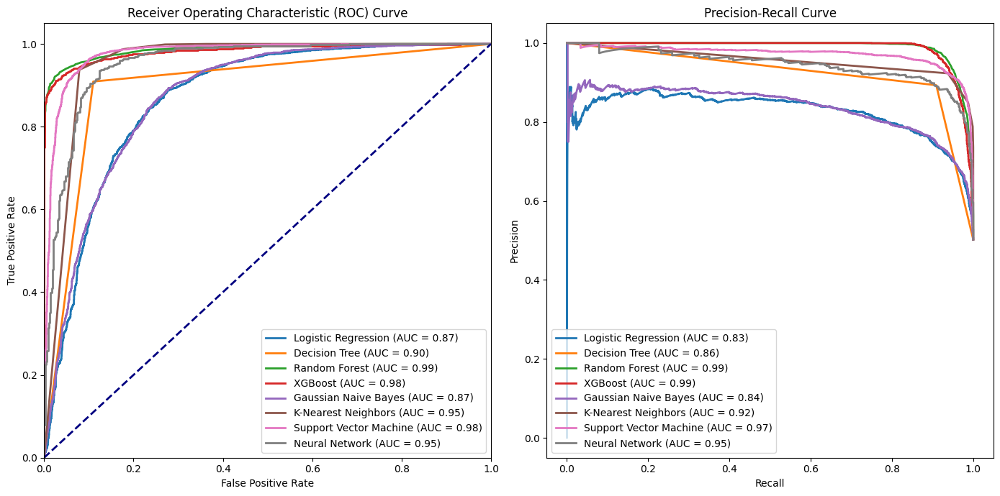

In [96]:
# Function to create the neural network model
def create_nn_model(input_dim):
    model = Sequential()
    model.add(Dense(64, input_dim=input_dim, activation='relu'))
    model.add(Dense(32, activation='relu'))
    model.add(Dense(1, activation='sigmoid'))
    model.compile(loss='binary_crossentropy', optimizer=Adam(), metrics=['accuracy'])
    return model

# Function to compute and plot ROC and Precision-Recall curves
def plot_roc_prc(models, X_train_scaled, y_train_adasyn):
    plt.figure(figsize=(14, 7))

    # Initialize lists to store results
    fpr_list, tpr_list, roc_auc_list = [], [], []
    precision_list, recall_list, pr_auc_list = [], [], []

    # Cross-validation setup (Stratified K-Fold)
    cv = StratifiedKFold(n_splits=5, shuffle=True, random_state=42)

    # Iterate over each model and calculate metrics
    for model_name, model in models:
        if model_name == 'Neural Network':
            # Train the neural network model using KFold cross-validation
            nn_accuracies, nn_precision_scores, nn_recall_scores, nn_f1_scores = [], [], [], []
            for train_index, test_index in cv.split(X_train_scaled, y_train_adasyn):
                X_train_fold, X_test_fold = X_train_scaled[train_index], X_train_scaled[test_index]
                y_train_fold, y_test_fold = y_train_adasyn[train_index], y_train_adasyn[test_index]

                nn_model = create_nn_model(X_train_fold.shape[1])
                nn_model.fit(X_train_fold, y_train_fold, epochs=10, batch_size=32, verbose=0)

                # Predict probabilities for the ROC and Precision-Recall curves
                y_pred_prob = nn_model.predict(X_test_fold)
                fpr, tpr, _ = roc_curve(y_test_fold, y_pred_prob)
                roc_auc = auc(fpr, tpr)
                precision, recall, _ = precision_recall_curve(y_test_fold, y_pred_prob)
                pr_auc = average_precision_score(y_test_fold, y_pred_prob)

                # Store results
                fpr_list.append(fpr)
                tpr_list.append(tpr)
                roc_auc_list.append(roc_auc)
                precision_list.append(precision)
                recall_list.append(recall)
                pr_auc_list.append(pr_auc)
        else:
            # Cross-validation for other models
            y_pred_prob = cross_val_predict(model, X_train_scaled, y_train_adasyn, cv=cv, method='predict_proba')[:, 1]
            fpr, tpr, _ = roc_curve(y_train_adasyn, y_pred_prob)
            roc_auc = auc(fpr, tpr)
            precision, recall, _ = precision_recall_curve(y_train_adasyn, y_pred_prob)
            pr_auc = average_precision_score(y_train_adasyn, y_pred_prob)

            # Store results
            fpr_list.append(fpr)
            tpr_list.append(tpr)
            roc_auc_list.append(roc_auc)
            precision_list.append(precision)
            recall_list.append(recall)
            pr_auc_list.append(pr_auc)

        # Plot ROC curve
        plt.subplot(1, 2, 1)
        plt.plot(fpr, tpr, lw=2, label=f'{model_name} (AUC = {roc_auc:.2f})')

        # Plot Precision-Recall curve
        plt.subplot(1, 2, 2)
        plt.plot(recall, precision, lw=2, label=f'{model_name} (AUC = {pr_auc:.2f})')

    # Format ROC plot
    plt.subplot(1, 2, 1)
    plt.plot([0, 1], [0, 1], color='navy', lw=2, linestyle='--')
    plt.xlim([0.0, 1.0])
    plt.ylim([0.0, 1.05])
    plt.xlabel('False Positive Rate')
    plt.ylabel('True Positive Rate')
    plt.title('Receiver Operating Characteristic (ROC) Curve')
    plt.legend(loc='lower right')

    # Format Precision-Recall plot
    plt.subplot(1, 2, 2)
    plt.xlabel('Recall')
    plt.ylabel('Precision')
    plt.title('Precision-Recall Curve')
    plt.legend(loc='lower left')

    plt.tight_layout()
    plt.show()

# Define models to test
models = [
    ('Logistic Regression', LogisticRegression(random_state=42, max_iter=1000)),
    ('Decision Tree', DecisionTreeClassifier(random_state=42)),
    ('Random Forest', RandomForestClassifier(random_state=42)),
    ('XGBoost', XGBClassifier(random_state=42)),
    ('Gaussian Naive Bayes', GaussianNB()),
    ('K-Nearest Neighbors', KNeighborsClassifier()),
    ('Support Vector Machine', SVC(random_state=42, probability=True)),
    ('Neural Network', None)]

# Call the function to plot ROC and Precision-Recall curves
plot_roc_prc(models, X_train_scaled, y_train_adasyn)
